# Exploratory analysis excluding timed-out trials

In [116]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro, levene, kruskal, sem, f_oneway, linregress, spearmanr
from sklearn.utils import resample
import random 
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import statsmodels.api as sm
import statsmodels.formula.api as smf
import pymc as pm
import arviz as az
from sklearn.model_selection import KFold
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import mean_absolute_error
import warnings

In [16]:
#Read the dataset and drop NaN values

dataset = 'data_thesis_FILTERED.csv'
data = pd.read_csv(dataset)
data.dropna(inplace=True)

data['durLookBottom'] = data['LookTotDurInL'] + data['LookTotDurInR'] #New variable: durLookBottom

data['FixNbInBottom'] = data['FixNbInL'] + data['FixNbInR'] #New variable: FixNbInBottom

data

,session,trialno,difficulty,accuracy,period_in_trial,step_reached,durPeriodTotal,FixNb,FixNbInL,FixNbInR,...,NbSwitches,objL,objR,objT,sideChosen,sideMatch,timePeriodStarts,timePeriodEnds,durLookBottom,FixNbInBottom
0,curE002a,8,Easy,0.0,exploration,3,11270,20,13,5,...,6,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,1962.0,13230.0,5480,18
1,curE002a,8,Easy,0.0,decision,3,924,2,1,0,...,0,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,13232.0,14154.0,536,1
2,curE002a,9,Easy,1.0,exploration,3,2498,6,3,2,...,2,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,2024.0,4520.0,1670,5
3,curE002a,9,Easy,1.0,decision,3,2182,4,1,0,...,0,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,4522.0,6702.0,530,1
4,curE002a,10,Easy,1.0,exploration,3,9912,11,3,5,...,3,F-4-E-1.png,V-1-G-1.png,V-1-G-1.png,right,right,2046.0,11956.0,2658,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2055,curE122a,35,Hard,1.0,decision,3,1432,0,0,0,...,0,V-4-F-1.png,V-4-A-4.png,V-4-F-1.png,left,left,18390.0,19820.0,0,0
2056,curE122a,38,Hard,1.0,exploration,3,2414,5,2,1,...,2,O-2-J-1.png,O-2-G-4.png,O-2-J-1.png,left,left,2716.0,5128.0,1586,3
2057,curE122a,38,Hard,1.0,decision,3,582,2,2,0,...,1,O-2-J-1.png,O-2-G-4.png,O-2-J-1.png,left,left,5130.0,5710.0,488,2
2058,curE122a,48,Medium,0.0,exploration,3,2332,2,1,0,...,1,V-2-B-3.png,V-3-H-3.png,V-3-H-3.png,left,right,1488.0,17710.0,596,1


In [17]:
# Summary statistics
print(data.describe())

           trialno     accuracy  step_reached  durPeriodTotal        FixNb  \
count  2060.000000  2060.000000   2060.000000     2060.000000  2060.000000   
mean     26.346602     0.523301      2.954369     4381.984466     7.853883   
std      14.649251     0.499578      0.208734     3745.790742     6.214751   
min       7.000000     0.000000      2.000000      550.000000     0.000000   
25%      15.000000     0.000000      3.000000     1917.500000     4.000000   
50%      24.000000     1.000000      3.000000     2823.000000     6.000000   
75%      35.000000     1.000000      3.000000     5520.000000    10.000000   
max      87.000000     1.000000      3.000000    20258.000000    51.000000   

          FixNbInL     FixNbInR     FixNbInT   FixNbNoAOI  FixTotDurInL  ...  \
count  2060.000000  2060.000000  2060.000000  2060.000000   2060.000000  ...   
mean      2.614563     2.436408     2.610194     0.192718    851.565049  ...   
std       3.830805     3.421404     2.686826     0.507587

In [18]:
# Divide the dataset into decision and exploration rows
decision_data = data[data['period_in_trial'] == 'decision']
exploration_data = data[data['period_in_trial'] == 'exploration']

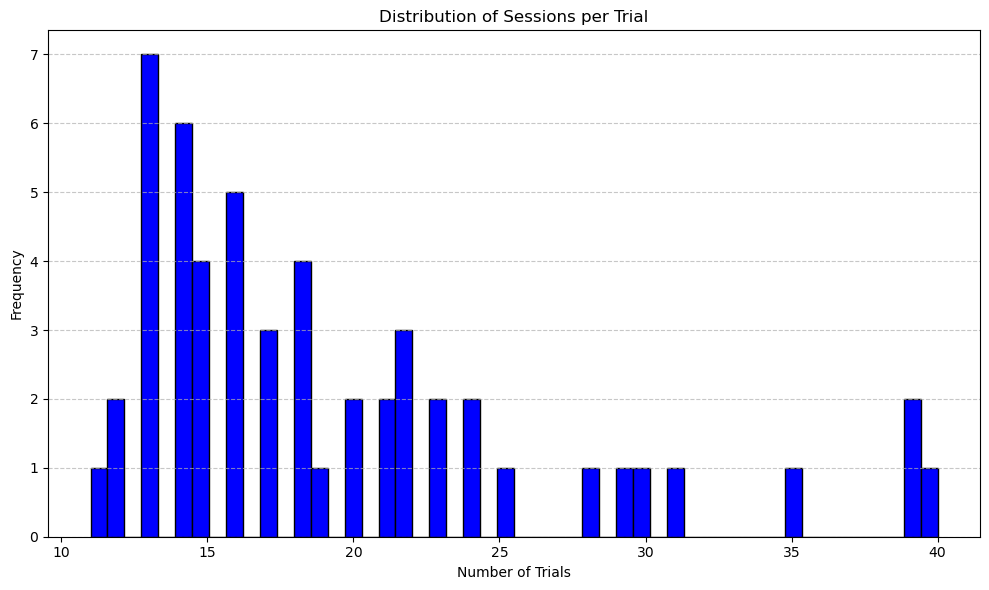

In [5]:
# Distribution of session per trial number
trials_per_session = decision_data.groupby('session')['trialno'].nunique()

# Plot the number of trials per session
plt.figure(figsize=(10, 6))
plt.hist(trials_per_session, bins=50, color='blue', edgecolor='black')
plt.title('Distribution of Sessions per Trial')
plt.xlabel('Number of Trials')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Difficulty counts:
difficulty
Easy      454
Medium    320
Hard      163
xHard      93
Name: count, dtype: int64


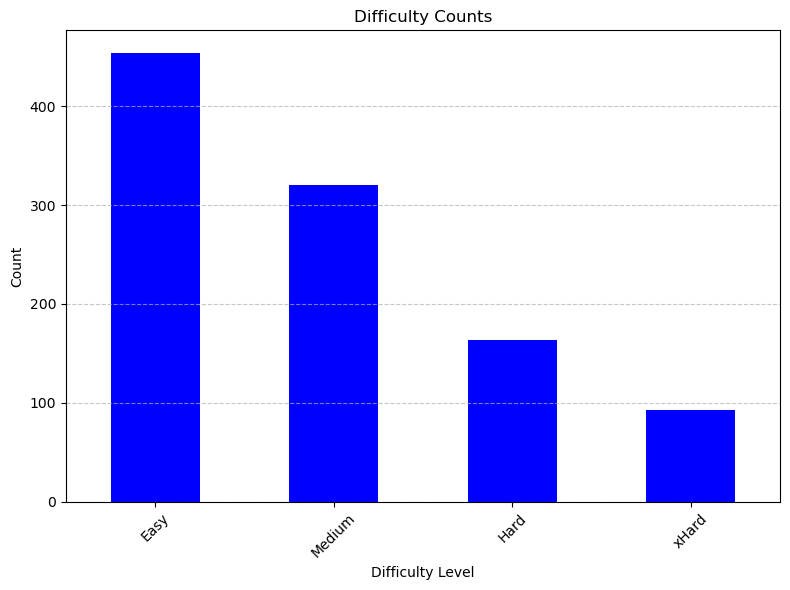

In [6]:
#Count of Difficulty Levels 

difficulty_counts = decision_data['difficulty'].value_counts()

print("Difficulty counts:")
print(difficulty_counts)

plt.figure(figsize=(8, 6))
difficulty_counts.plot(kind='bar', color='blue')
plt.title('Difficulty Counts')
plt.xlabel('Difficulty Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

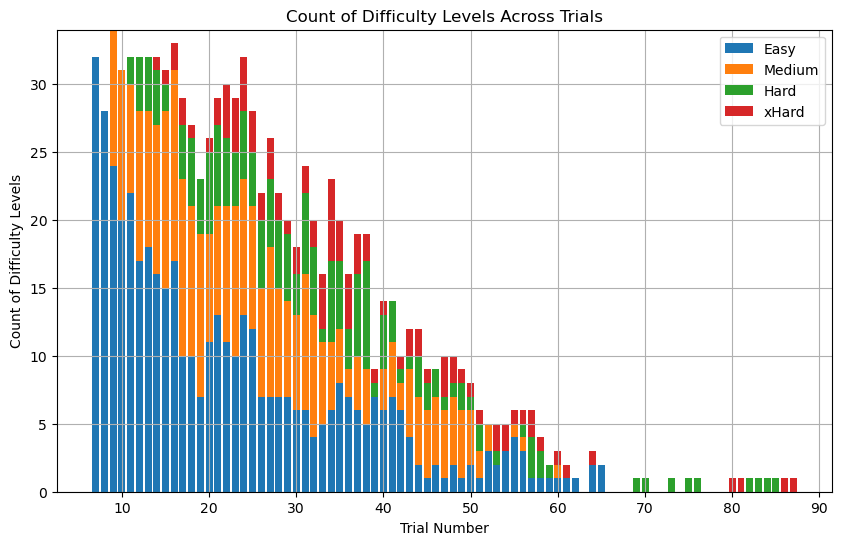

In [7]:
# Difficulty levels count across trials

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']
difficulty_trial_counts = decision_data.groupby(['trialno', 'difficulty']).size().unstack(fill_value=0)
difficulty_trial_counts = difficulty_trial_counts[difficulty_order]

plt.figure(figsize=(10, 6))

bottom = None
for difficulty in difficulty_trial_counts.columns:
    plt.bar(difficulty_trial_counts.index, difficulty_trial_counts[difficulty], label=difficulty, bottom=bottom)
    if bottom is None:
        bottom = difficulty_trial_counts[difficulty].values
    else:
        bottom += difficulty_trial_counts[difficulty].values

plt.xlabel('Trial Number')
plt.ylabel('Count of Difficulty Levels')
plt.title('Count of Difficulty Levels Across Trials')
plt.legend()
plt.grid(True)
plt.show()

accuracy
1.0    539
0.0    491
Name: count, dtype: int64


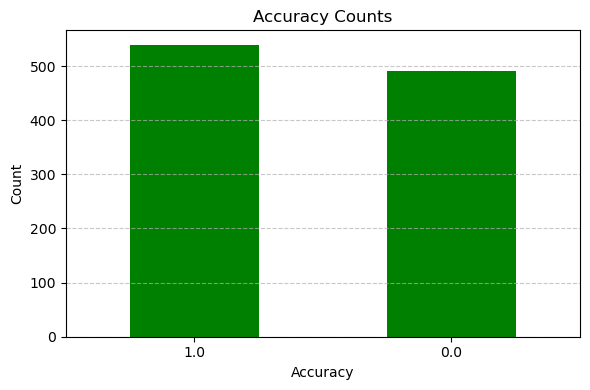

In [8]:
#Accuracy Counts

accuracy_counts = decision_data['accuracy'].value_counts()
print(accuracy_counts)

plt.figure(figsize=(6, 4))
accuracy_counts.plot(kind='bar', color='green')
plt.title('Accuracy Counts')
plt.xlabel('Accuracy')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

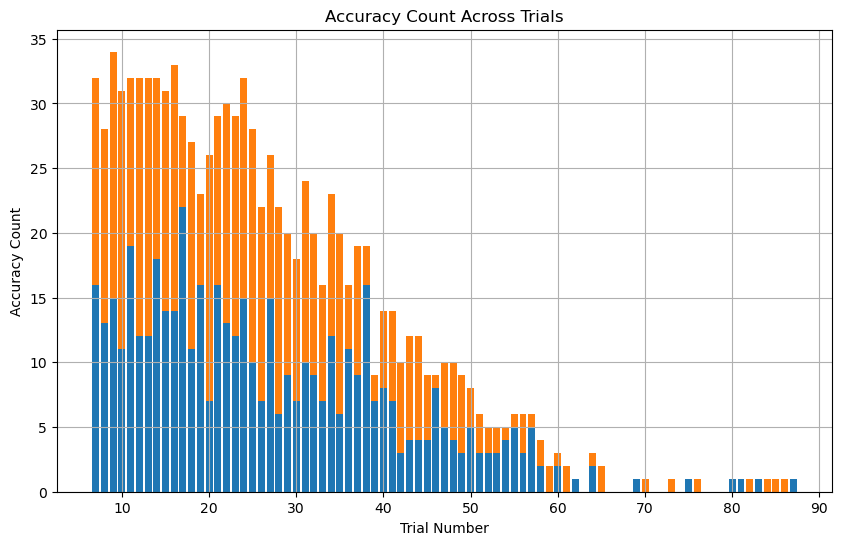

In [9]:
#Accuracy count across trials

accuracy_trial_counts = decision_data.groupby(['trialno', 'accuracy']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))

bottom = None
for accuracy in accuracy_trial_counts.columns:
    plt.bar(accuracy_trial_counts.index, accuracy_trial_counts[accuracy], label=accuracy, bottom=bottom)
    if bottom is None:
        bottom = accuracy_trial_counts[accuracy].values
    else:
        bottom += accuracy_trial_counts[accuracy].values

plt.xlabel('Trial Number')
plt.ylabel('Accuracy Count')
plt.title('Accuracy Count Across Trials')
#plt.legend()
plt.grid(True)
plt.show()

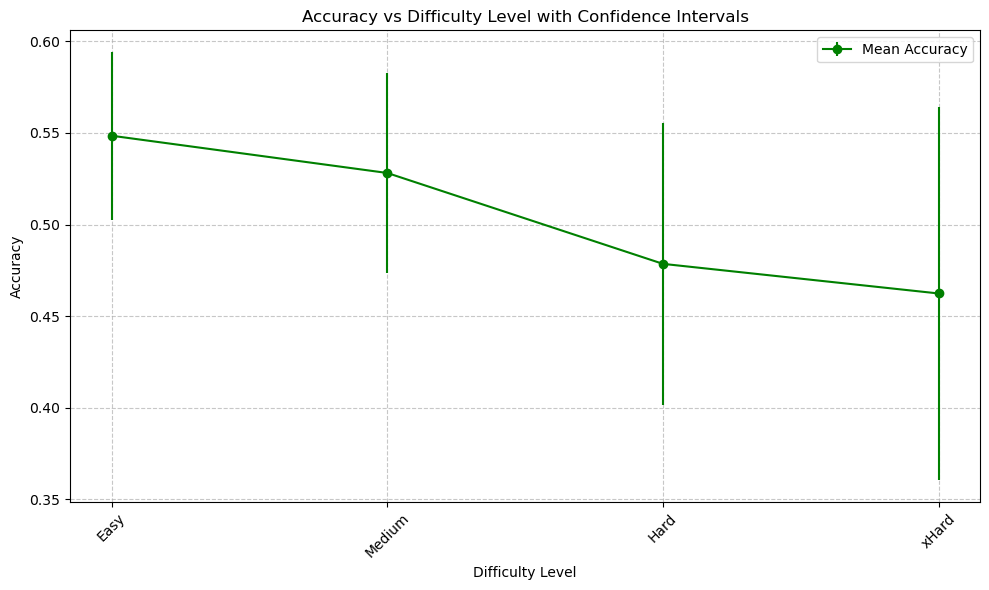

Accuracy means per difficulty level:
difficulty
Easy      0.548458
Medium    0.528125
Hard      0.478528
xHard     0.462366
Name: accuracy, dtype: float64

Accuracy medians per difficulty level:
difficulty
Easy      1.0
Medium    1.0
Hard      0.0
xHard     0.0
Name: accuracy, dtype: float64


In [10]:
#Accuracy means by difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

mean_accuracy = decision_data.groupby('difficulty')['accuracy'].mean().loc[difficulty_order]
std_accuracy = decision_data.groupby('difficulty')['accuracy'].std().loc[difficulty_order]
count_accuracy = decision_data.groupby('difficulty')['accuracy'].count().loc[difficulty_order]
conf_interval = 1.96 * std_accuracy / np.sqrt(count_accuracy)

plt.figure(figsize=(10, 6))

plt.errorbar(mean_accuracy.index, mean_accuracy, yerr=conf_interval, fmt='o', linestyle='-', color='green', label='Mean Accuracy')

plt.title('Accuracy vs Difficulty Level with Confidence Intervals')
plt.xlabel('Difficulty Level')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Accuracy means per difficulty level:")
print(mean_accuracy)

print("\nAccuracy medians per difficulty level:")
print(decision_data.groupby('difficulty')['accuracy'].median().loc[difficulty_order])


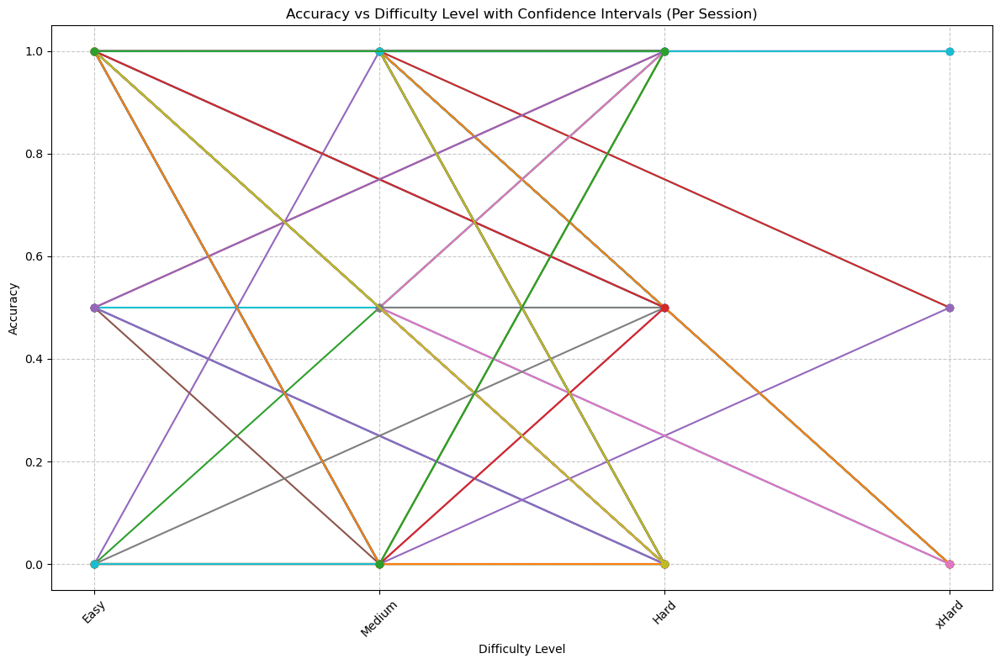

In [11]:
# Accuracy medians per session by difficulty level

session_accuracy = decision_data.groupby(['session', 'difficulty'])['accuracy'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_accuracy.loc[session].dropna().index.tolist()

    if available_difficulty_levels:
        median_accuracy_session = session_accuracy.loc[session][available_difficulty_levels]
        plt.plot(median_accuracy_session.index, median_accuracy_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Accuracy vs Difficulty Level with Confidence Intervals (Per Session)')
plt.xlabel('Difficulty Level')
plt.ylabel('Accuracy')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

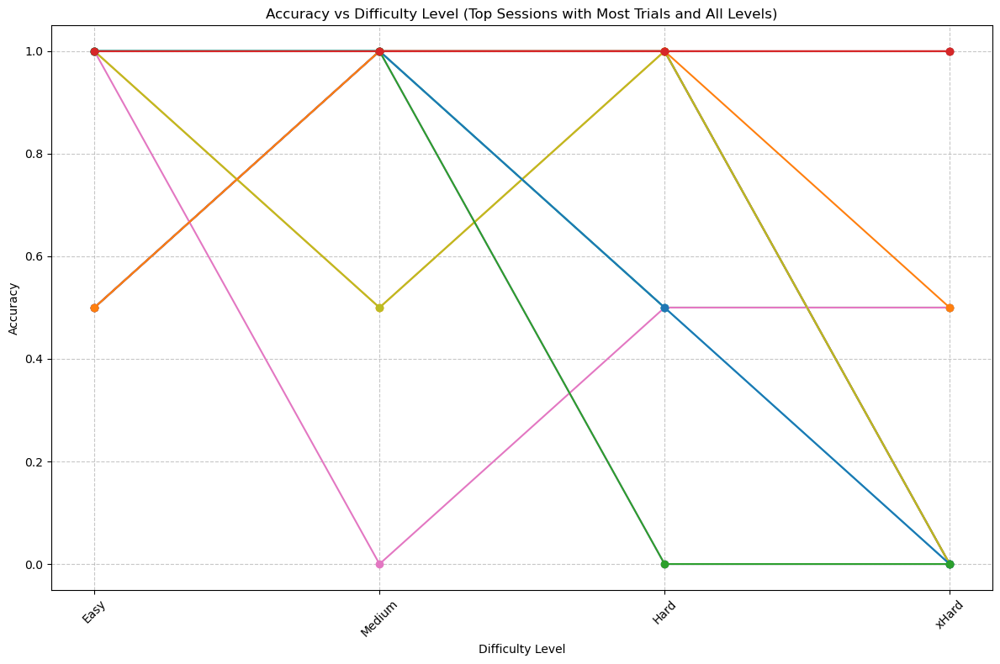

In [12]:
# Accuracy medians per session (Top sessions with most trials) by difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

session_accuracy_all = decision_data.groupby(['session', 'difficulty'])['accuracy'].median().unstack()

sessions_all = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

complete_sessions = session_accuracy_all.dropna().index.get_level_values('session').unique()

total_trials_per_session = decision_data[decision_data['session'].isin(complete_sessions)].groupby('session')['accuracy'].count()

top_complete_sessions = total_trials_per_session.nlargest(30).index

for session in top_complete_sessions:
    available_difficulty_levels = session_accuracy_all.loc[session].dropna().index.tolist()
    
    if available_difficulty_levels:
        median_accuracy_session = session_accuracy_all.loc[session][available_difficulty_levels]
        median_accuracy_session = median_accuracy_session.reindex(difficulty_order)
        
        plt.plot(median_accuracy_session.index, median_accuracy_session, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Accuracy vs Difficulty Level (Top Sessions with Most Trials and All Levels)')
plt.xlabel('Difficulty Level')
plt.ylabel('Accuracy')
#plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

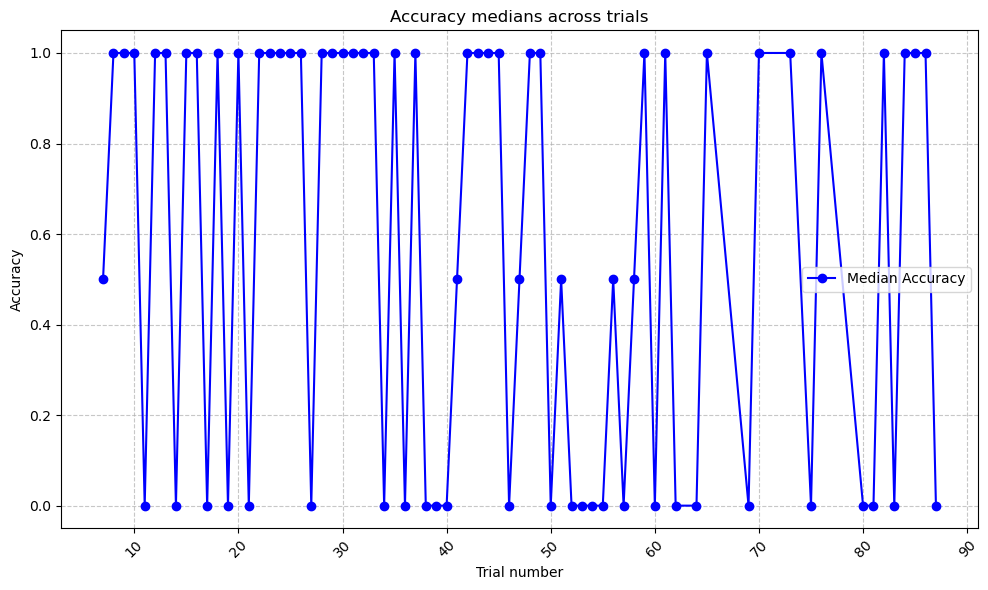

In [13]:
#Accuracy medians across trials

plt.figure(figsize=(10, 6))
decision_data.groupby('trialno')['accuracy'].median().plot(marker='o', linestyle='-', color='blue', label='Median Accuracy')
plt.title('Accuracy medians across trials')
plt.xlabel('Trial number')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Total trial duration
Means: 
difficulty
Easy      8616.647577
Medium    8782.012500
Hard      9513.766871
xHard     8106.903226
Name: durPeriodTotal, dtype: float64
Standard Errors of the Mean: 
difficulty
Easy      246.971350
Medium    284.499826
Hard      416.462705
xHard     477.873892
Name: durPeriodTotal, dtype: float64


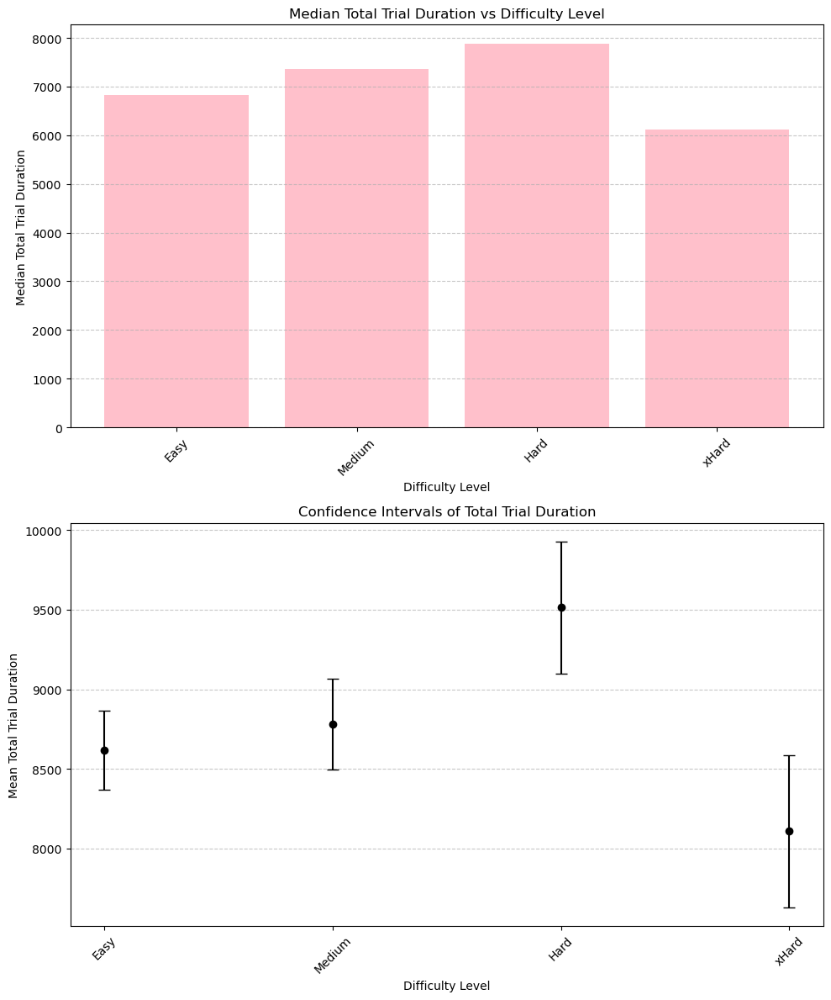

In [14]:
#Total trial duration vs. Difficulty level

trial_duration = data.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

mean_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].mean().reindex(difficulty_order)
median_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].median().reindex(difficulty_order)
sem_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].sem().reindex(difficulty_order)

print("Total trial duration")
print("Means: ")
print(mean_duration_by_difficulty)
print("Standard Errors of the Mean: ")
print(sem_duration_by_difficulty)

fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

# Subplot 1: Median duration by difficulty
ax1.bar(median_duration_by_difficulty.index, median_duration_by_difficulty, color='pink')
ax1.set_title('Median Total Trial Duration vs Difficulty Level')
ax1.set_xlabel('Difficulty Level')
ax1.set_ylabel('Median Total Trial Duration')
ax1.grid(axis='y', linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', rotation=45)

# Subplot 2: Confidence intervals
ax2.errorbar(mean_duration_by_difficulty.index, mean_duration_by_difficulty, yerr=sem_duration_by_difficulty, fmt='o', color='black', capsize=5)
ax2.set_title('Confidence Intervals of Total Trial Duration')
ax2.set_xlabel('Difficulty Level')
ax2.set_ylabel('Mean Total Trial Duration')
ax2.grid(axis='y', linestyle='--', alpha=0.7)
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

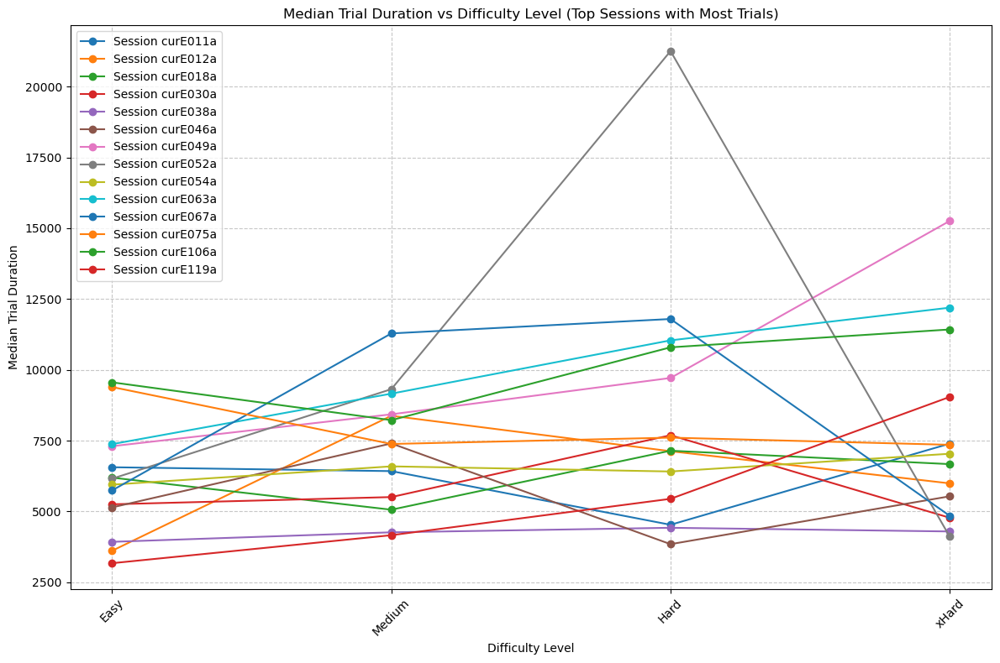

In [15]:
# Median trial duration per session by difficulty level (top sessions with most trials)

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

total_trial_duration_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()

median_trial_duration_per_session = total_trial_duration_per_trial.groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()

plt.figure(figsize=(12, 8))

complete_sessions_median = median_trial_duration_per_session.dropna().index

top_complete_sessions_median = complete_sessions_median.value_counts().nlargest(20).index

for session_id in top_complete_sessions_median:
    if session_id in complete_sessions_median:
        session_data = median_trial_duration_per_session.loc[session_id].dropna()
        session_data = session_data.reindex(difficulty_order)
        plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session_id}')

plt.title('Median Trial Duration vs Difficulty Level (Top Sessions with Most Trials)')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Trial Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

In [16]:
# Median trial duration per session by difficulty level - slope of linear regression line  - complete sessions
# Compute the slope of the linear regression line fitted to the mean trial duration vs. difficulty level for each session to get the rate of change in trial duration as the difficulty level increases
# To handle missing values, so I only included (for now) the sessions in which we have all the levels. 

total_trial_duration_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()
median_trial_duration_per_session = total_trial_duration_per_trial.groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()

session_slopes = {}

for session_id in top_complete_sessions_median:
    if session_id in complete_sessions_median:
        session_data = median_trial_duration_per_session.loc[session_id].dropna()
        session_data = session_data.reindex(difficulty_order)
        
        if len(session_data) >= 2:
            slope, intercept, r_value, p_value, std_err = linregress(range(len(session_data)), session_data)
            session_slopes[session_id] = slope

sorted_session_slopes = dict(sorted(session_slopes.items()))

for session_id, slope in sorted_session_slopes.items():
    print(f"Session {session_id}: Slope = {slope}")

Session curE011a: Slope = 60.5
Session curE012a: Slope = 588.3
Session curE018a: Slope = 351.4
Session curE030a: Slope = 75.8
Session curE038a: Slope = 125.8
Session curE046a: Slope = -238.2
Session curE049a: Slope = 2513.9
Session curE052a: Slope = 579.7
Session curE054a: Slope = 309.2
Session curE063a: Slope = 1633.2
Session curE067a: Slope = -218.8
Session curE075a: Slope = -589.3
Session curE106a: Slope = 816.9
Session curE119a: Slope = 1889.1


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks t

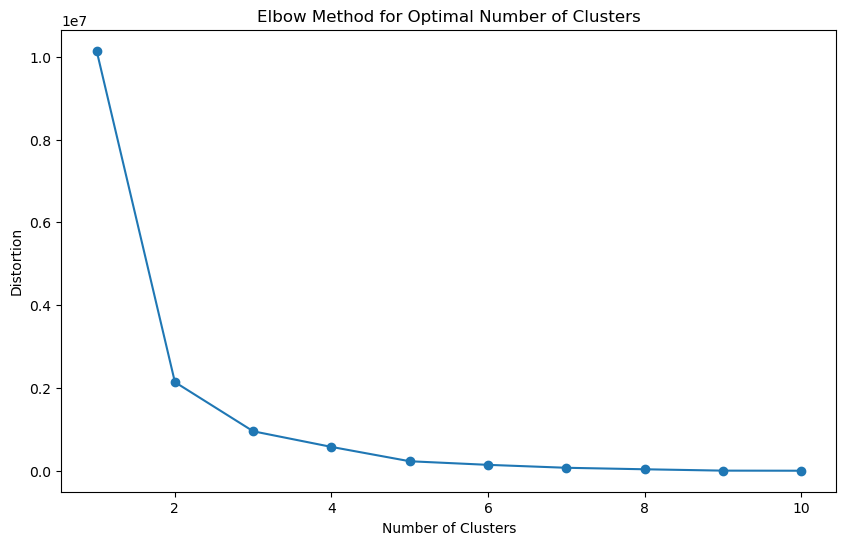

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


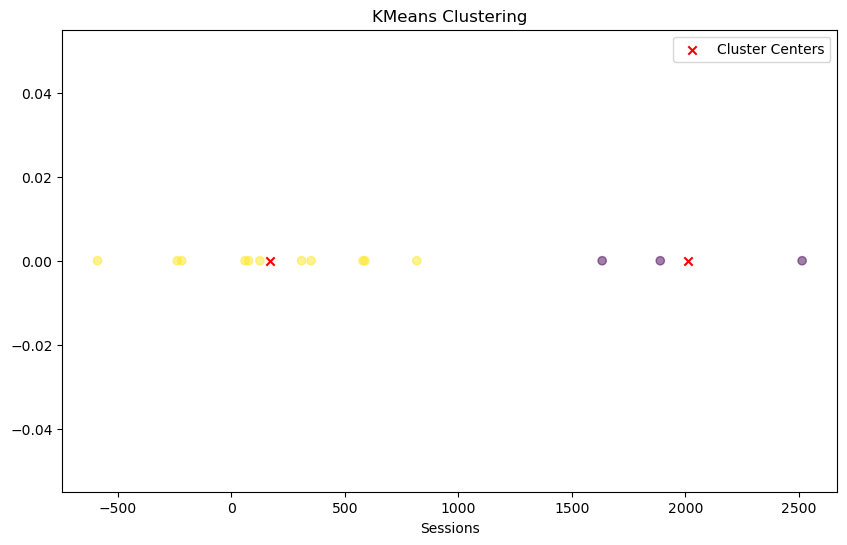

Sessions in Cluster 1:
['curE049a', 'curE063a', 'curE119a']

Sessions in Cluster 2:
['curE011a', 'curE012a', 'curE018a', 'curE030a', 'curE038a', 'curE046a', 'curE052a', 'curE054a', 'curE067a', 'curE075a', 'curE106a']


In [17]:
# Median trial duration per session by difficulty level - clustering  - complete sessions
# K-means along with the elbow method

from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt

X = np.array(list(sorted_session_slopes.values())).reshape(-1, 1)

# Elbow method
distortions = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(X)
    distortions.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), distortions, marker='o')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Distortion')
plt.show()

optimal_num_clusters = 2 

# KMeans clustering 
kmeans = KMeans(n_clusters=optimal_num_clusters, random_state=0)
kmeans.fit(X)

cluster_labels = kmeans.labels_
cluster_centers = kmeans.cluster_centers_

plt.figure(figsize=(10, 6))
plt.scatter(X, np.zeros_like(X), c=cluster_labels, cmap='viridis', alpha=0.5)
plt.scatter(cluster_centers, np.zeros_like(cluster_centers), c='red', marker='x', label='Cluster Centers')
plt.title('KMeans Clustering')
plt.xlabel('Sessions')
plt.legend()
plt.show()

sessions = list(sorted_session_slopes.keys())
sessions_in_cluster_1 = [sessions[i] for i, label in enumerate(cluster_labels) if label == 0]
sessions_in_cluster_2 = [sessions[i] for i, label in enumerate(cluster_labels) if label == 1]

print("Sessions in Cluster 1:")
print(sessions_in_cluster_1)
print("\nSessions in Cluster 2:")
print(sessions_in_cluster_2)

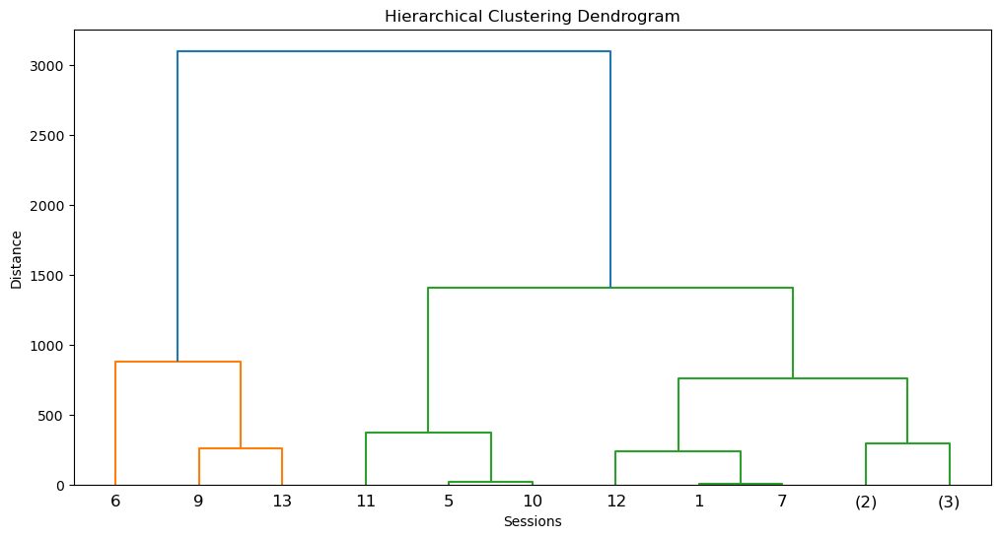

Sessions in Cluster 0:
['curE011a', 'curE012a', 'curE018a', 'curE030a', 'curE038a', 'curE046a', 'curE052a', 'curE054a', 'curE067a', 'curE075a', 'curE106a']
Sessions in Cluster 1:
['curE049a', 'curE063a', 'curE119a']


In [18]:
# Median trial duration per session by difficulty level - clustering  - complete sessions
# Hierarchical clustering along with the elbow method
# Use of agglomerative clustering algorithm

X = np.array(list(sorted_session_slopes.values())).reshape(-1, 1)

linkage_method = 'complete'  # I could also try: 'single', 'complete', 'average', etc.
model = AgglomerativeClustering(n_clusters=2, linkage=linkage_method)
model.fit(X)

linkage_matrix = linkage(X, method=linkage_method)

# Plot 
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, truncate_mode='level', p=3)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sessions')
plt.ylabel('Distance')
plt.show()

sessions_in_cluster = {}

for cluster_id in np.unique(model.labels_):
    sessions_in_cluster[cluster_id] = [sessions[i] for i, label in enumerate(model.labels_) if label == cluster_id]

for cluster_id, sessions_list in sessions_in_cluster.items():
    print(f"Sessions in Cluster {cluster_id}:")
    print(sessions_list)

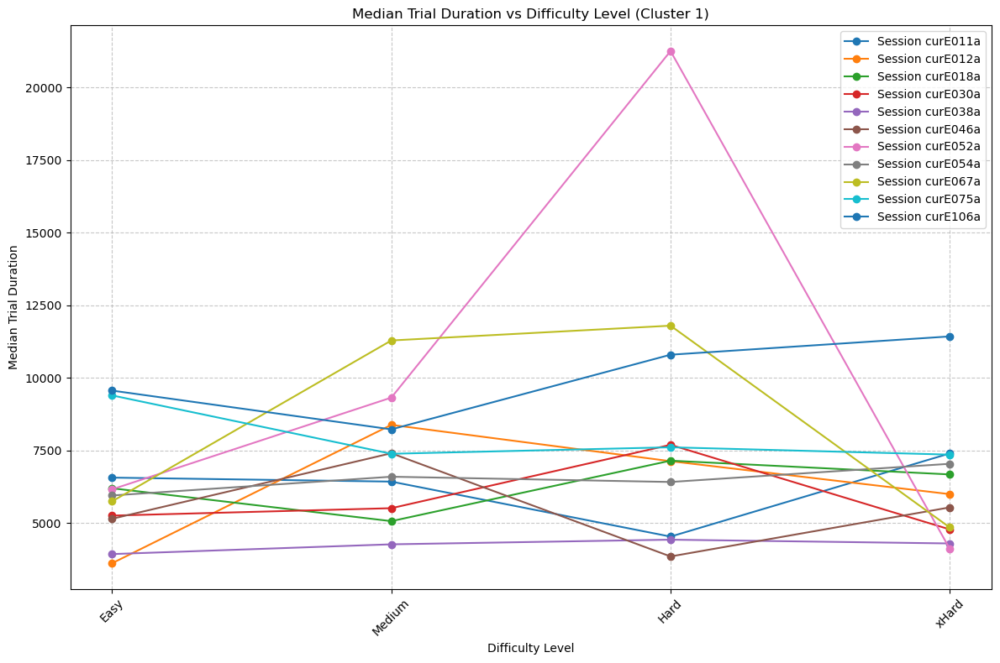

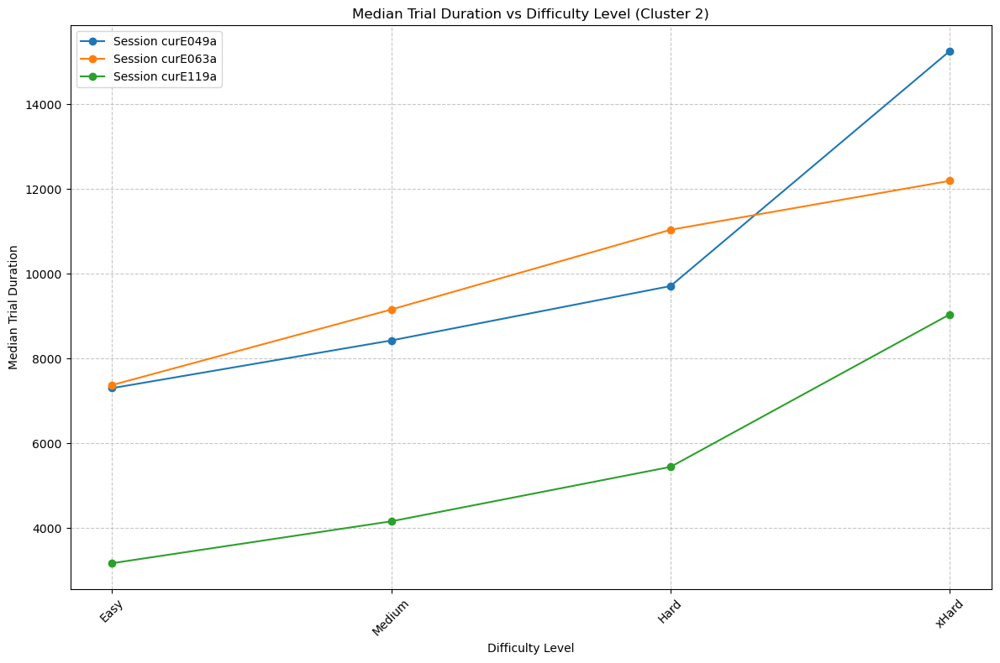

In [19]:
# Two plots with the different clusters

# Define the sessions for each plot
sessions_plot1 = ['curE011a', 'curE012a', 'curE018a', 'curE030a', 'curE038a', 'curE046a', 'curE052a', 'curE054a', 'curE067a', 'curE075a', 'curE106a']
sessions_plot2 = ['curE049a', 'curE063a', 'curE119a']

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

total_trial_duration_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()
median_trial_duration_per_session = total_trial_duration_per_trial.groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()

plt.figure(figsize=(12, 8))

for session_id in sessions_plot1:
    if session_id in median_trial_duration_per_session.index:
        session_data = median_trial_duration_per_session.loc[session_id].dropna()
        session_data = session_data.reindex(difficulty_order)
        plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session_id}')

plt.title('Median Trial Duration vs Difficulty Level (Cluster 1)')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Trial Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))

for session_id in sessions_plot2:
    if session_id in median_trial_duration_per_session.index:
        session_data = median_trial_duration_per_session.loc[session_id].dropna()
        session_data = session_data.reindex(difficulty_order)
        plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session_id}')

plt.title('Median Trial Duration vs Difficulty Level (Cluster 2)')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Trial Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

Total trial duration
Medians: 
accuracy
0.0    6926.0
1.0    7148.0
Name: durPeriodTotal, dtype: float64
Standard Errors of the Mean: 
accuracy
0.0    239.904031
1.0    216.834412
Name: durPeriodTotal, dtype: float64


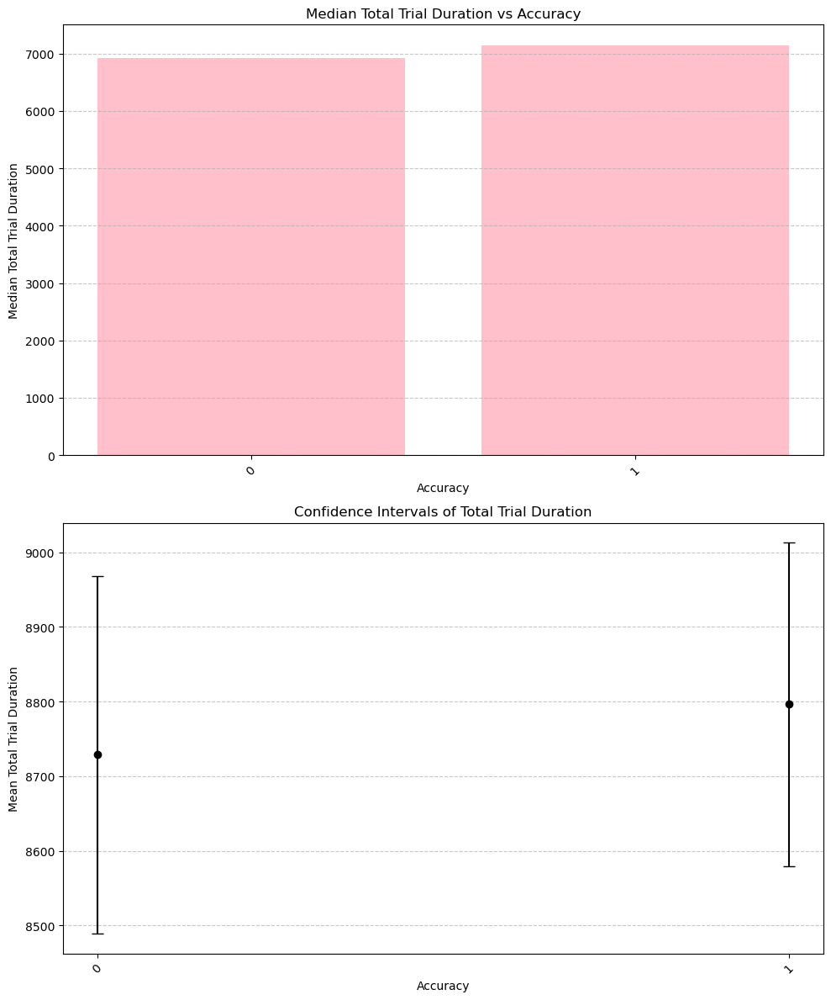

In [20]:
#Total period duration vs. Accuracy

trial_duration_accuracy = data.groupby(['session', 'trialno', 'accuracy'])['durPeriodTotal'].sum().reset_index()

mean_duration_by_accuracy = trial_duration_accuracy.groupby('accuracy')['durPeriodTotal'].mean()
median_duration_by_accuracy = trial_duration_accuracy.groupby('accuracy')['durPeriodTotal'].median()
sem_duration_by_accuracy = trial_duration_accuracy.groupby('accuracy')['durPeriodTotal'].sem()

print("Total trial duration")
print("Medians: ")
print(median_duration_by_accuracy)
print("Standard Errors of the Mean: ")
print(sem_duration_by_accuracy)

fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

#  Median duration by accuracy
ax1.bar(median_duration_by_accuracy.index, median_duration_by_accuracy, color='pink')
ax1.set_title('Median Total Trial Duration vs Accuracy')
ax1.set_xlabel('Accuracy')
ax1.set_ylabel('Median Total Trial Duration')
ax1.grid(axis='y', linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', rotation=45)
ax1.set_xticks([0, 1])

# Confidence intervals
ax2.errorbar(mean_duration_by_accuracy.index, mean_duration_by_accuracy, yerr=sem_duration_by_accuracy, fmt='o', color='black', capsize=5)
ax2.set_title('Confidence Intervals of Total Trial Duration')
ax2.set_xlabel('Accuracy')
ax2.set_ylabel('Mean Total Trial Duration')
ax2.grid(axis='y', linestyle='--', alpha=0.7)
ax2.tick_params(axis='x', rotation=45)
ax2.set_xticks([0, 1])

plt.tight_layout()
plt.show()

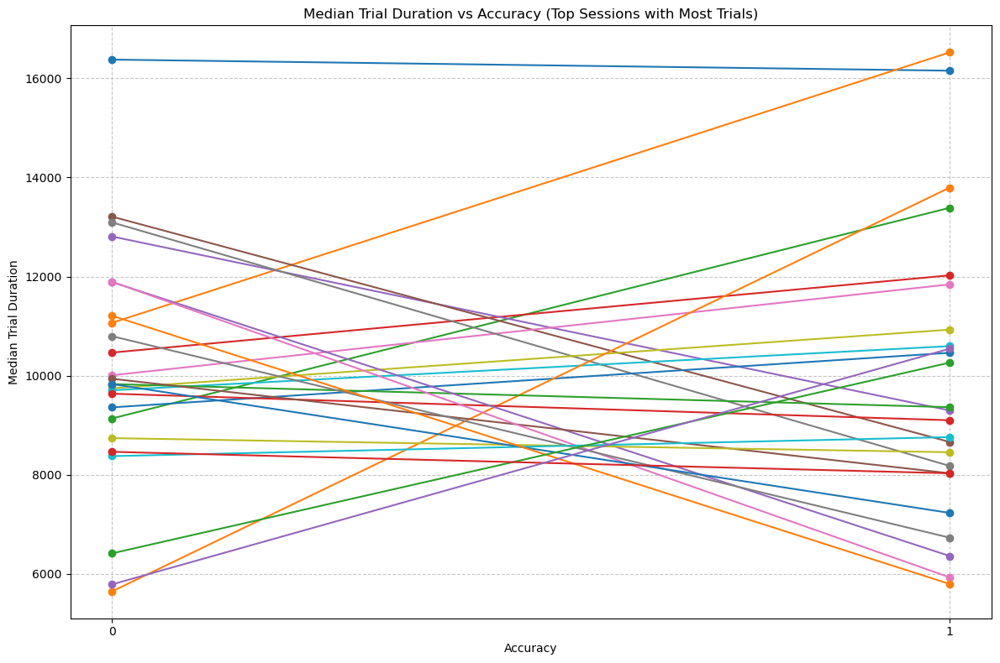

In [21]:
# Median trial duration per session by accuracy 
total_trial_duration_per_trial_accuracy = data.groupby(['session', 'trialno', 'accuracy'])['durPeriodTotal'].sum().reset_index()
median_trial_duration_per_session_accuracy = total_trial_duration_per_trial_accuracy.groupby(['session', 'accuracy'])['durPeriodTotal'].median().unstack()

plt.figure(figsize=(12, 8))

top_sessions = median_trial_duration_per_session_accuracy.sum(axis=1).nlargest(25).index

for session_id in top_sessions:
    session_data = median_trial_duration_per_session_accuracy.loc[session_id].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session_id}')

plt.title('Median Trial Duration vs Accuracy (Top Sessions with Most Trials)')
plt.xlabel('Accuracy')
plt.ylabel('Median Trial Duration')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for Easy: p-value = 6.115145120810978e-19
Shapiro-Wilk test for Hard: p-value = 2.6859133949119092e-11
Shapiro-Wilk test for Medium: p-value = 4.876325208936565e-15
Shapiro-Wilk test for xHard: p-value = 3.60759459119217e-07
Levene's test for homogeneity of variances: p-value = 0.10247845466206298
Kruskal-Wallis test:
H-statistic: 7.948822916796224
p-value: 0.047081307575384236
Mean Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      3264.757709
Hard      3746.404908
Medium    3225.625000
xHard     2629.483871
Name: durLookBottom, dtype: float64
SEM Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      122.832924
Hard      252.918052
Medium    147.748049
xHard     232.108501
Name: durLookBottom, dtype: float64


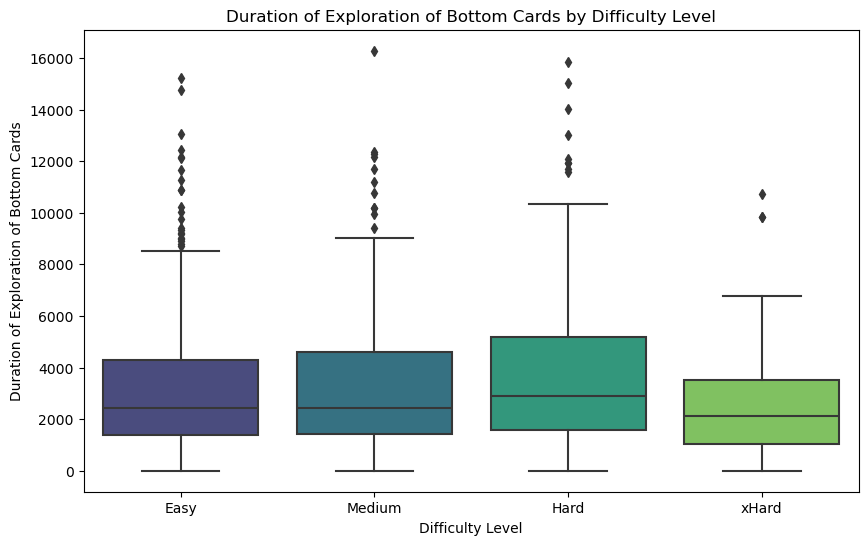

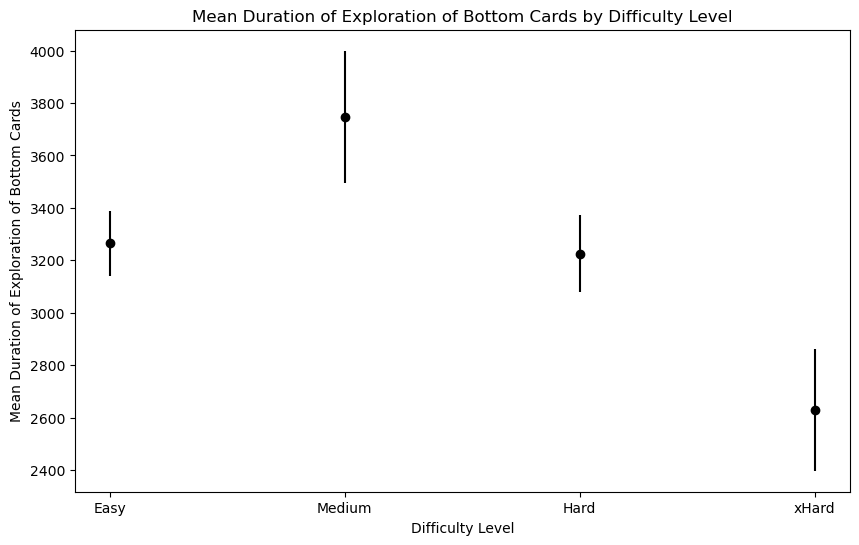

In [22]:
# HOW LONG INFANTS TAKE TO EXPLORE THE BOTTOM CARDS BEFORE DECIDING TO LOOK UP AND FLIP THE TOP CARD FOR EACH DIFFICULTY LEVEL (durLookBottomExploration vs. difficulty)

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

durLookBottom_by_difficulty = [exploration_data[exploration_data['difficulty'] == level]['durLookBottom'] for level in exploration_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('difficulty')['durLookBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*durLookBottom_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*durLookBottom_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration of bottom cards by difficulty level
mean_gazeduration_by_difficulty = exploration_data.groupby('difficulty')['durLookBottom'].mean()
sem_gazeduration_by_difficulty = exploration_data.groupby('difficulty')['durLookBottom'].sem()

print("Mean Duration of Exploration of bottom cards by Difficulty Level:")
print(mean_gazeduration_by_difficulty)
print("SEM Duration of Exploration of bottom cards by Difficulty Level:")
print(sem_gazeduration_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='durLookBottom', data=exploration_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Duration of Exploration of Bottom Cards')
plt.title('Duration of Exploration of Bottom Cards by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_gazeduration_by_difficulty))
plt.errorbar(x_gaze_positions, mean_gazeduration_by_difficulty, yerr=sem_gazeduration_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Duration of Exploration of Bottom Cards')
plt.title('Mean Duration of Exploration of Bottom Cards by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

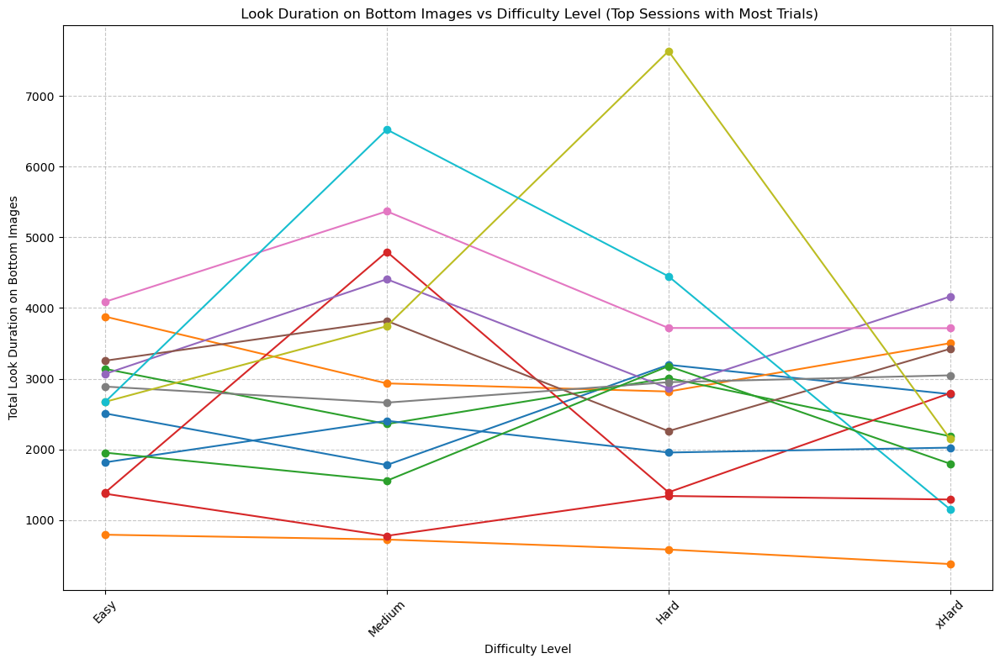

In [23]:
# Median gaze duration of exploration of bottom cards per session by difficulty level

durLookBottom_by_difficulty = exploration_data.groupby(['session', 'difficulty'])['durLookBottom'].median().unstack()

plt.figure(figsize=(12, 8))

complete_sessions = durLookBottom_by_difficulty.dropna().index.get_level_values('session').unique()

total_trials_per_session = exploration_data[exploration_data['session'].isin(complete_sessions)].groupby('session')['durLookBottom'].sum()

top_complete_sessions = total_trials_per_session.nlargest(25).index

for session in top_complete_sessions:
    available_difficulty_levels = durLookBottom_by_difficulty.loc[session].dropna().index.tolist()
    
    if available_difficulty_levels:
        durgaze_session = durLookBottom_by_difficulty.loc[session][available_difficulty_levels]
        durgaze_session_sorted = durgaze_session.reindex(difficulty_order)
        plt.plot(durgaze_session_sorted.index, durgaze_session_sorted, marker='o', linestyle='-', label=f'Session {session}')

plt.title(' Look Duration on Bottom Images vs Difficulty Level (Top Sessions with Most Trials)')
plt.xlabel('Difficulty Level')
plt.ylabel('Total Look Duration on Bottom Images')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for Easy: p-value = 3.095516838770787e-18
Shapiro-Wilk test for Hard: p-value = 2.7812365750070507e-11
Shapiro-Wilk test for Medium: p-value = 9.77161084510629e-15
Shapiro-Wilk test for xHard: p-value = 1.3344788738562754e-06
Levene's test for homogeneity of variances: p-value = 0.12972286056178614
Kruskal-Wallis test:
H-statistic: 7.334819156090553
p-value: 0.06195805765318944
Mean Look duration of bottom cards by Difficulty Level:
difficulty
Easy      3689.735683
Medium    3644.850000
Hard      4163.914110
xHard     3073.075269
Name: durLookBottom, dtype: float64
SEM Look duration of bottom cards by Difficulty Level:
difficulty
Easy      123.442614
Medium    149.246532
Hard      252.174652
xHard     231.165918
Name: durLookBottom, dtype: float64


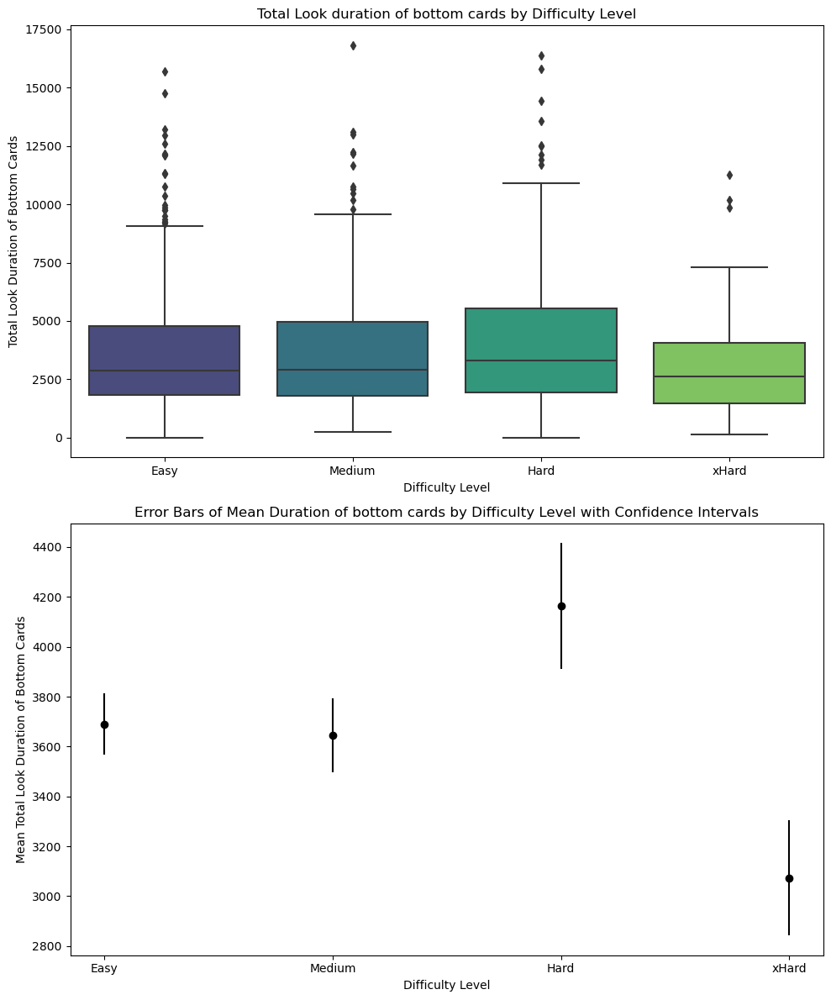

In [24]:
# HOW LONG INFANTS TAKE TO LOOK AT THE BOTTOM CARDS during both periods

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

durLookBottom_total_by_difficulty = data.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()

# Shapiro-Wilk test for normality
for group_name, group_data in durLookBottom_total_by_difficulty.groupby('difficulty')['durLookBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*[group_data['durLookBottom'] for group_name, group_data in durLookBottom_total_by_difficulty.groupby('difficulty')])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*[group_data['durLookBottom'] for group_name, group_data in durLookBottom_total_by_difficulty.groupby('difficulty')])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total duration of gaze of bottom cards by difficulty level
mean_totalgazeduration_by_difficulty = durLookBottom_total_by_difficulty.groupby('difficulty')['durLookBottom'].mean().reindex(difficulty_order)
sem_totalgazeduration_by_difficulty = durLookBottom_total_by_difficulty.groupby('difficulty')['durLookBottom'].sem().reindex(difficulty_order)
print("Mean Look duration of bottom cards by Difficulty Level:")
print(mean_totalgazeduration_by_difficulty)
print("SEM Look duration of bottom cards by Difficulty Level:")
print(sem_totalgazeduration_by_difficulty)

#Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='difficulty', y='durLookBottom', data=durLookBottom_total_by_difficulty, order=difficulty_order, palette='viridis', ax=ax1)
ax1.set_xlabel('Difficulty Level')
ax1.set_ylabel('Total Look Duration of Bottom Cards')
ax1.set_title('Total Look duration of bottom cards by Difficulty Level')

ax2.errorbar(np.arange(len(mean_totalgazeduration_by_difficulty)), mean_totalgazeduration_by_difficulty, yerr=sem_totalgazeduration_by_difficulty, fmt='o', color='black')
ax2.set_xlabel('Difficulty Level')
ax2.set_ylabel('Mean Total Look Duration of Bottom Cards')
ax2.set_title('Error Bars of Mean Duration of bottom cards by Difficulty Level with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_totalgazeduration_by_difficulty)))
ax2.set_xticklabels(mean_totalgazeduration_by_difficulty.index)

plt.tight_layout()
plt.show()

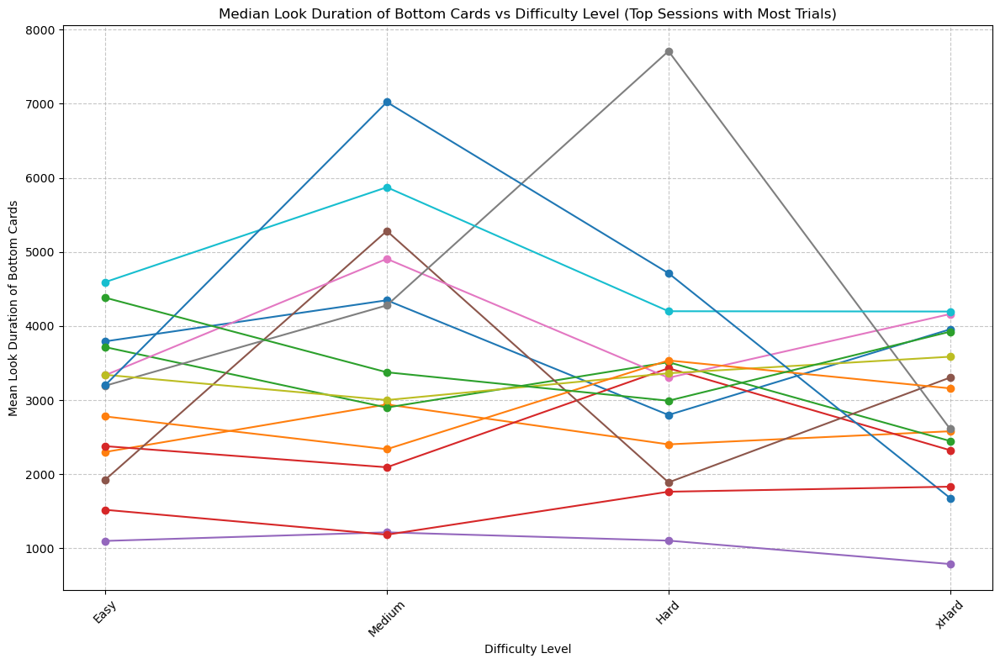

In [25]:
# Median look duration of bottom cards per session by difficulty level (top sessions with most trials)

total_durLookB_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()

median_durLookB_per_session = total_durLookB_per_trial.groupby(['session', 'difficulty'])['durLookBottom'].median().unstack()

plt.figure(figsize=(12, 8))

complete_sessions = median_durLookB_per_session.dropna().index

top_complete_sessions = complete_sessions.value_counts().nlargest(20).index

for session_id in top_complete_sessions:
    if session_id in complete_sessions:
        session_data = median_durLookB_per_session.loc[session_id].dropna()
        session_data_sorted = session_data.reindex(difficulty_order)
        plt.plot(session_data_sorted.index, session_data_sorted, marker='o', linestyle='-', label=f'Session {session_id}')

plt.title('Median Look Duration of Bottom Cards vs Difficulty Level (Top Sessions with Most Trials)')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Look Duration of Bottom Cards')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for Easy: p-value = 1.7131809466218468e-19
Shapiro-Wilk test for Hard: p-value = 3.0448330001842977e-09
Shapiro-Wilk test for Medium: p-value = 1.4994592983143136e-16
Shapiro-Wilk test for xHard: p-value = 1.4817875354392727e-06
Levene's test for homogeneity of variances: p-value = 0.22565246075484177
Kruskal-Wallis test:
H-statistic: 8.871453629556337
p-value: 0.031049715002661453
Mean FixNb of bottom cards during exploration by Difficulty Level:
difficulty
Easy       8.680617
Hard      10.067485
Medium     8.878125
xHard      7.419355
Name: FixNbInBottom, dtype: float64
SEM FixNb of bottom cards during exploration by Difficulty Level:
difficulty
Easy      0.314906
Hard      0.611444
Medium    0.407563
xHard     0.627841
Name: FixNbInBottom, dtype: float64


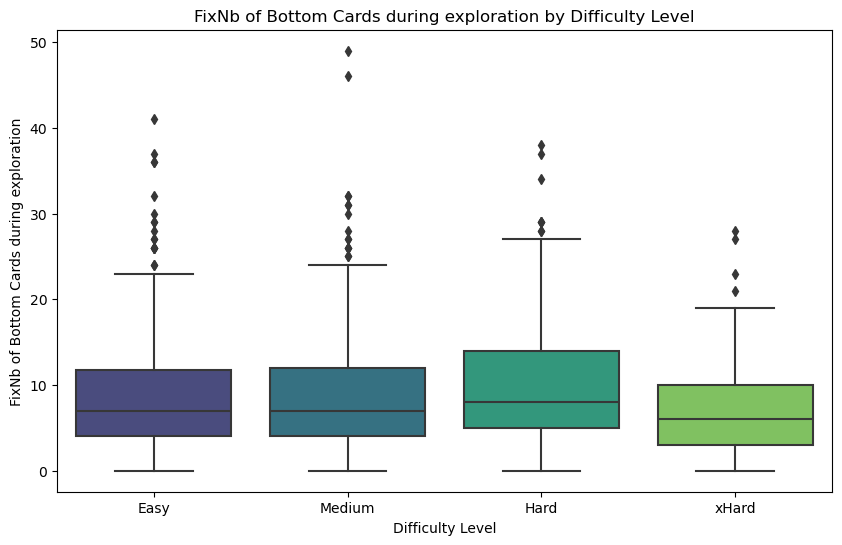

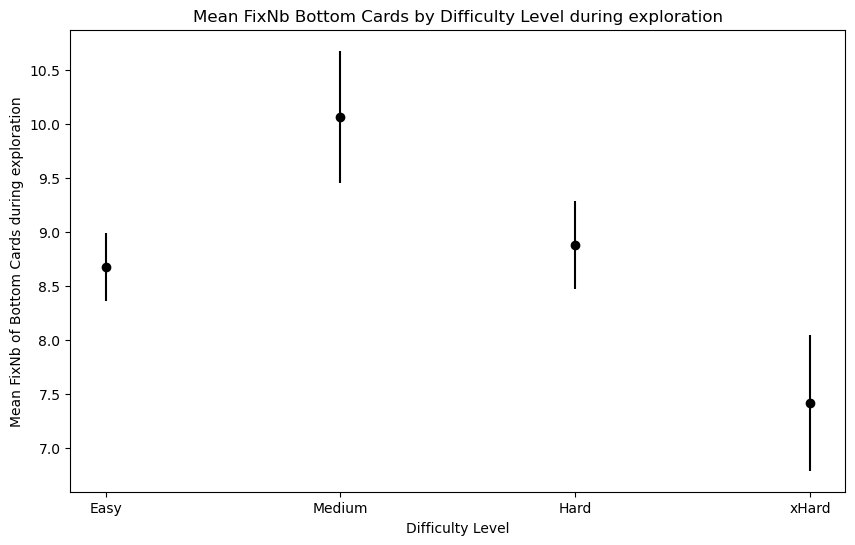

In [26]:
# NUMBER OF FIXATIONS DURING EXPLORATION OF THE BOTTOM CARDS FOR EACH DIFFICULTY LEVEL (FixNb for Exploration vs difficulty)

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

FixNbInBottom_by_difficulty = [exploration_data[exploration_data['difficulty'] == level]['FixNbInBottom'] for level in exploration_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('difficulty')['FixNbInBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*FixNbInBottom_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*FixNbInBottom_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Median and SEM of duration of exploration of bottom cards by difficulty level
mean_FixNbB_by_difficulty = exploration_data.groupby('difficulty')['FixNbInBottom'].mean()
sem_FixNbB_by_difficulty = exploration_data.groupby('difficulty')['FixNbInBottom'].sem()

print("Mean FixNb of bottom cards during exploration by Difficulty Level:")
print(mean_FixNbB_by_difficulty)
print("SEM FixNb of bottom cards during exploration by Difficulty Level:")
print(sem_FixNbB_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='FixNbInBottom', data=exploration_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNb of Bottom Cards during exploration')
plt.title('FixNb of Bottom Cards during exploration by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_fix_positions = np.arange(len(mean_FixNbB_by_difficulty))
plt.errorbar(x_gaze_positions, mean_FixNbB_by_difficulty, yerr=sem_FixNbB_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean FixNb of Bottom Cards during exploration')
plt.title('Mean FixNb Bottom Cards by Difficulty Level during exploration')
plt.xticks(x_fix_positions, difficulty_order)
plt.show()

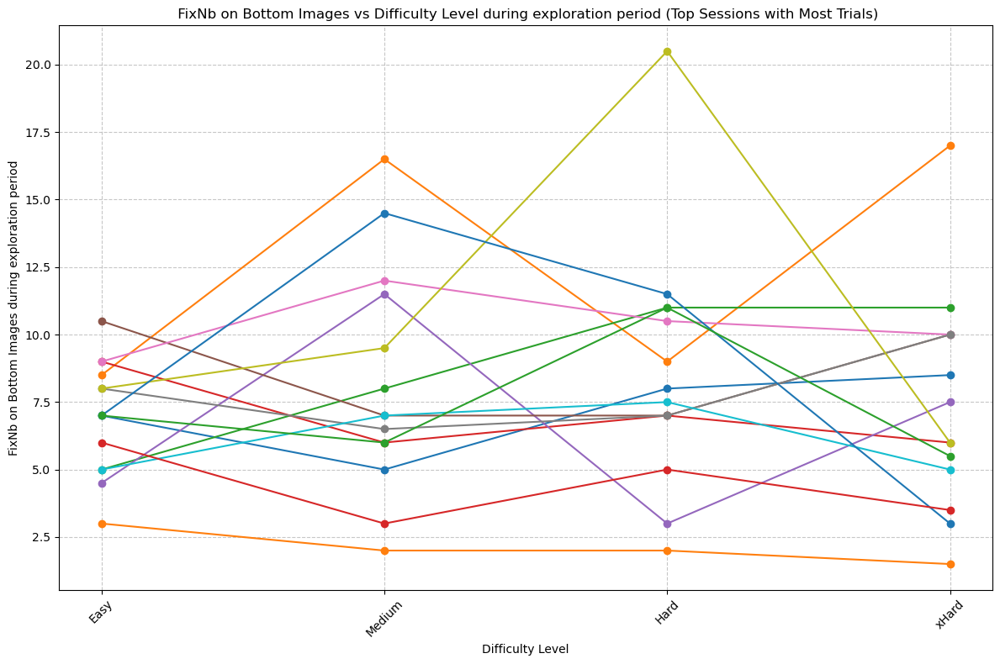

In [27]:
# Median FixN of bottom cards during exploration period per session by difficulty level

FixNbInBottom_by_difficulty = exploration_data.groupby(['session', 'difficulty'])['FixNbInBottom'].median().unstack()

plt.figure(figsize=(12, 8))

complete_sessions = FixNbInBottom_by_difficulty.dropna().index.get_level_values('session').unique()

total_trials_per_session = exploration_data[exploration_data['session'].isin(complete_sessions)].groupby('session')['FixNbInBottom'].sum()

top_complete_sessions = total_trials_per_session.nlargest(25).index

for session in top_complete_sessions:
    available_difficulty_levels = FixNbInBottom_by_difficulty.loc[session].dropna().index.tolist()
    
    if available_difficulty_levels:
        FixNbB_session = FixNbInBottom_by_difficulty.loc[session][available_difficulty_levels]
        FixNbB_session_sorted = FixNbB_session.reindex(difficulty_order)
        plt.plot(FixNbB_session_sorted.index, FixNbB_session_sorted, marker='o', linestyle='-', label=f'Session {session}')

plt.title(' FixNb on Bottom Images vs Difficulty Level during exploration period (Top Sessions with Most Trials)')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNb on Bottom Images during exploration period')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for Easy: p-value = 5.671099770400566e-19
Shapiro-Wilk test for Hard: p-value = 5.246578566441293e-09
Shapiro-Wilk test for Medium: p-value = 2.883541532374853e-16
Shapiro-Wilk test for xHard: p-value = 4.233474278771004e-06
Levene's test for homogeneity of variances: p-value = 0.18016397583693677
Kruskal-Wallis test:
H-statistic: 8.431382627011718
p-value: 0.03788893366066824
Mean FixNb of bottom cards by Difficulty Level:
difficulty
Easy       9.964758
Medium    10.103125
Hard      11.306748
xHard      8.655914
Name: FixNbInBottom, dtype: float64
SEM FixNb of bottom cards by Difficulty Level:
difficulty
Easy      0.315668
Medium    0.410668
Hard      0.612076
xHard     0.620006
Name: FixNbInBottom, dtype: float64


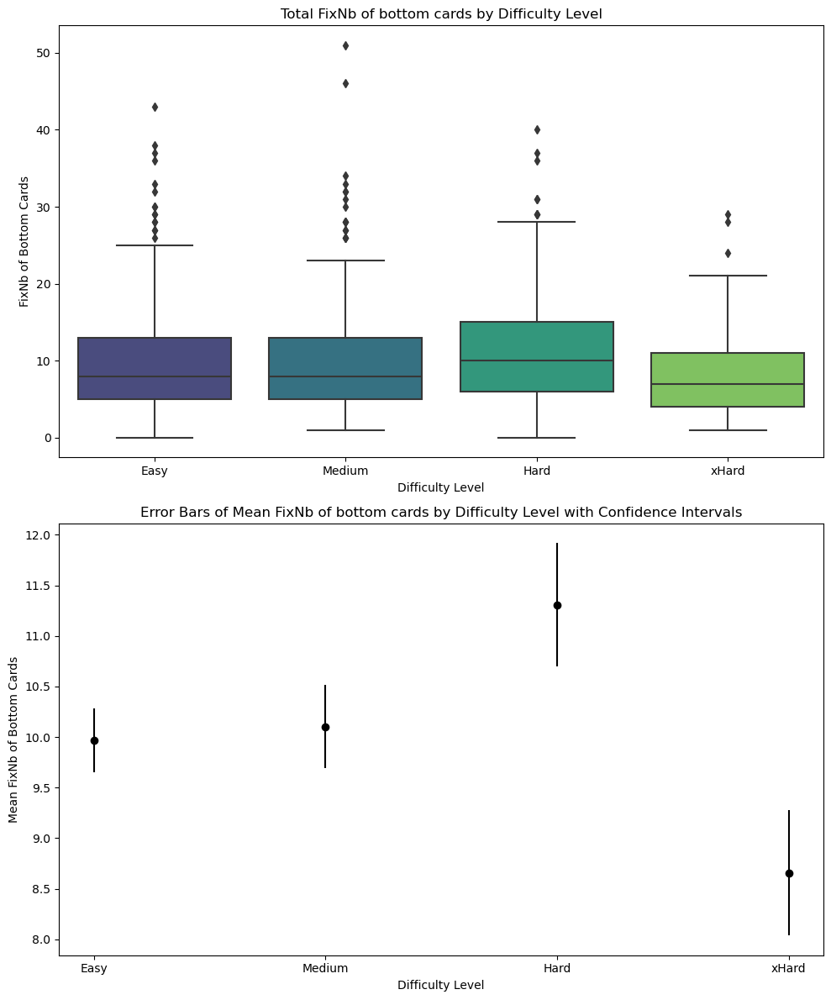

In [28]:
# NUMBER OF FIXATIONS OF BOTTOM CARDS during both periods

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

FixNbInBottom_total_by_difficulty = data.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()

# Shapiro-Wilk test for normality
for group_name, group_data in FixNbInBottom_total_by_difficulty.groupby('difficulty')['FixNbInBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*[group_data['FixNbInBottom'] for group_name, group_data in FixNbInBottom_total_by_difficulty.groupby('difficulty')])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*[group_data['FixNbInBottom'] for group_name, group_data in FixNbInBottom_total_by_difficulty.groupby('difficulty')])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total duration of gaze of bottom cards by difficulty level
mean_FixNbInBottom_by_difficulty = FixNbInBottom_total_by_difficulty.groupby('difficulty')['FixNbInBottom'].mean().reindex(difficulty_order)
sem_FixNbInBottom_by_difficulty = FixNbInBottom_total_by_difficulty.groupby('difficulty')['FixNbInBottom'].sem().reindex(difficulty_order)
print("Mean FixNb of bottom cards by Difficulty Level:")
print(mean_FixNbInBottom_by_difficulty)
print("SEM FixNb of bottom cards by Difficulty Level:")
print(sem_FixNbInBottom_by_difficulty)

#Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='difficulty', y='FixNbInBottom', data=FixNbInBottom_total_by_difficulty, order=difficulty_order, palette='viridis', ax=ax1)
ax1.set_xlabel('Difficulty Level')
ax1.set_ylabel('FixNb of Bottom Cards')
ax1.set_title('Total FixNb of bottom cards by Difficulty Level')

ax2.errorbar(np.arange(len(mean_FixNbInBottom_by_difficulty)), mean_FixNbInBottom_by_difficulty, yerr=sem_FixNbInBottom_by_difficulty, fmt='o', color='black')
ax2.set_xlabel('Difficulty Level')
ax2.set_ylabel('Mean FixNb of Bottom Cards')
ax2.set_title('Error Bars of Mean FixNb of bottom cards by Difficulty Level with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_FixNbInBottom_by_difficulty)))
ax2.set_xticklabels(mean_FixNbInBottom_by_difficulty.index)

plt.tight_layout()
plt.show()

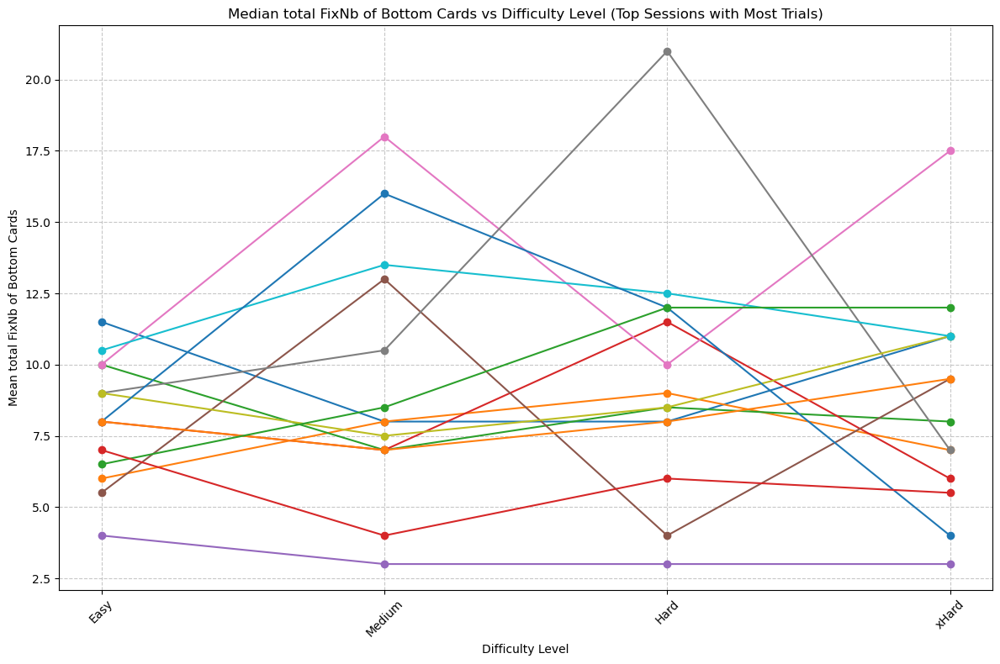

In [29]:
# Median look duration of bottom cards per session by difficulty level (top sessions with most trials)

total_FixNbInBottom_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()

median_FixNbInBottom_per_session = total_FixNbInBottom_per_trial.groupby(['session', 'difficulty'])['FixNbInBottom'].median().unstack()

plt.figure(figsize=(12, 8))

complete_sessions = median_FixNbInBottom_per_session.dropna().index

top_complete_sessions = complete_sessions.value_counts().nlargest(20).index

for session_id in top_complete_sessions:
    if session_id in complete_sessions:
        session_data = median_FixNbInBottom_per_session.loc[session_id].dropna()
        session_data_sorted = session_data.reindex(difficulty_order)
        plt.plot(session_data_sorted.index, session_data_sorted, marker='o', linestyle='-', label=f'Session {session_id}')

plt.title('Median total FixNb of Bottom Cards vs Difficulty Level (Top Sessions with Most Trials)')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean total FixNb of Bottom Cards')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for Easy: p-value = 1.3652075796705874e-20
Shapiro-Wilk test for Hard: p-value = 3.3575260997094043e-08
Shapiro-Wilk test for Medium: p-value = 1.3560817785586575e-15
Shapiro-Wilk test for xHard: p-value = 8.208907073026806e-09
Levene's test for homogeneity of variances: p-value = 0.0455813793625484
Kruskal-Wallis test:
H-statistic: 9.087467066600466
p-value: 0.028150286831524967
Mean NbSwitches during exploration by Difficulty Level:
difficulty
Easy      2.202643
Hard      2.490798
Medium    2.253125
xHard     1.989247
Name: NbSwitches, dtype: float64
SEM NbSwitches during exploration by Difficulty Level:
difficulty
Easy      0.060039
Hard      0.119127
Medium    0.078840
xHard     0.127455
Name: NbSwitches, dtype: float64


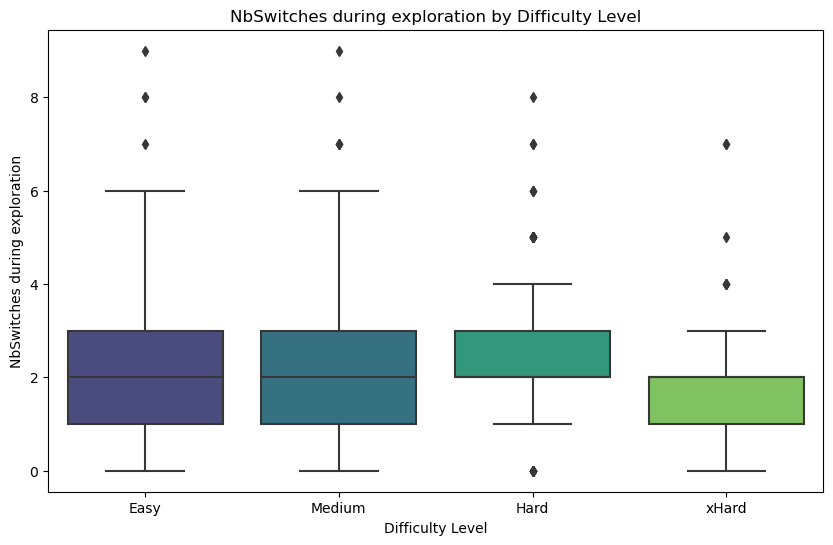

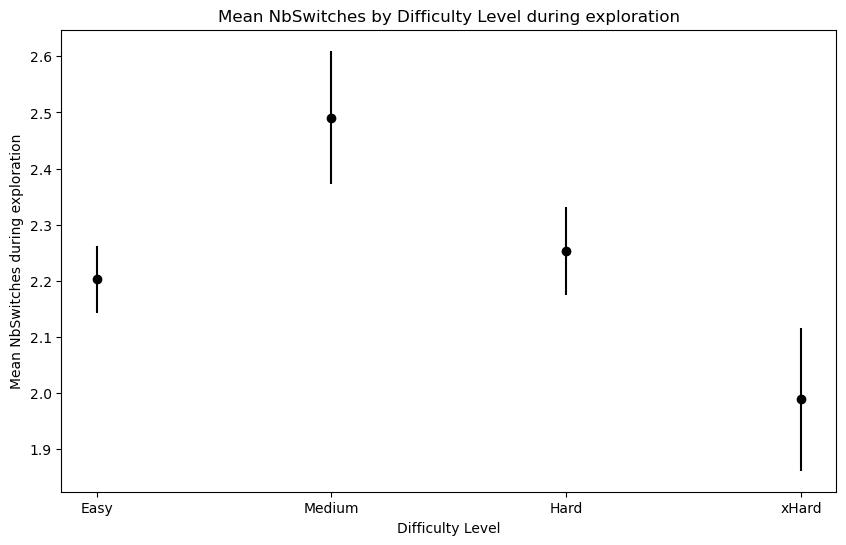

In [30]:
#NUMBER OF SWITCHES DURING EXPLORATION OF THE BOTTOM CARDS FOR EACH DIFFICULTY LEVEL

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

NbSwitches_by_difficulty = [exploration_data[exploration_data['difficulty'] == level]['NbSwitches'] for level in exploration_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('difficulty')['NbSwitches']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*NbSwitches_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*NbSwitches_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration of bottom cards by difficulty level
mean_NbSwitches_by_difficulty = exploration_data.groupby('difficulty')['NbSwitches'].mean()
sem_NbSwitches_by_difficulty = exploration_data.groupby('difficulty')['NbSwitches'].sem()

print("Mean NbSwitches during exploration by Difficulty Level:")
print(mean_NbSwitches_by_difficulty)
print("SEM NbSwitches during exploration by Difficulty Level:")
print(sem_NbSwitches_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='NbSwitches', data=exploration_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches during exploration')
plt.title('NbSwitches during exploration by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_sw_positions = np.arange(len(mean_NbSwitches_by_difficulty))
plt.errorbar(x_sw_positions, mean_NbSwitches_by_difficulty, yerr=sem_NbSwitches_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean NbSwitches during exploration')
plt.title('Mean NbSwitches by Difficulty Level during exploration')
plt.xticks(x_sw_positions, difficulty_order)
plt.show()

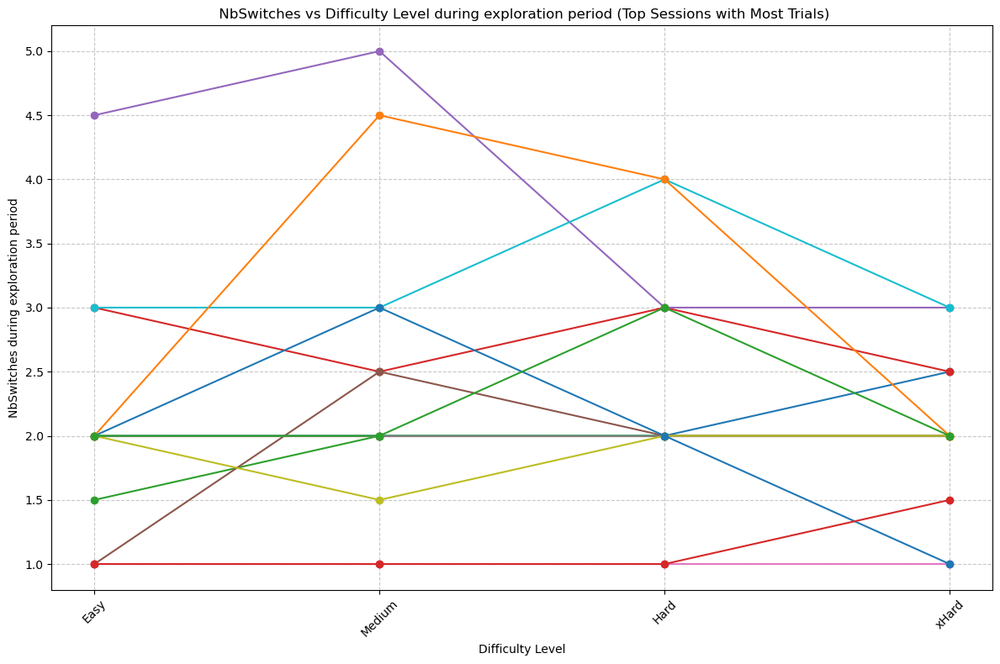

In [31]:
# Median FixN of bottom cards during exploration period per session by difficulty level

NbSwitches_by_difficulty = exploration_data.groupby(['session', 'difficulty'])['NbSwitches'].median().unstack()

plt.figure(figsize=(12, 8))

complete_sessions = NbSwitches_by_difficulty.dropna().index.get_level_values('session').unique()

total_trials_per_session = exploration_data[exploration_data['session'].isin(complete_sessions)].groupby('session')['NbSwitches'].sum()

top_complete_sessions = total_trials_per_session.nlargest(25).index

for session in top_complete_sessions:
    available_difficulty_levels = NbSwitches_by_difficulty.loc[session].dropna().index.tolist()
    
    if available_difficulty_levels:
        NbSwitches_session = NbSwitches_by_difficulty.loc[session][available_difficulty_levels]
        NbSwitches_session_sorted = NbSwitches_session.reindex(difficulty_order)
        plt.plot(NbSwitches_session_sorted.index, NbSwitches_session_sorted, marker='o', linestyle='-', label=f'Session {session}')

plt.title(' NbSwitches vs Difficulty Level during exploration period (Top Sessions with Most Trials)')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches during exploration period')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 9.166116840075267e-19
Shapiro-Wilk test for 1.0: p-value = 7.251810979899895e-22
Levene's test for homogeneity of variances: p-value = 0.7656683392003479
Kruskal-Wallis test:
H-statistic: 0.043063543332913956
p-value: 0.8356056696650855
Mean Duration of Exploration by Accuracy:
accuracy
0.0    3280.179226
1.0    3263.521336
Name: durLookBottom, dtype: float64
SEM Duration of Exploration by Accuracy:
accuracy
0.0    120.452022
1.0    118.420175
Name: durLookBottom, dtype: float64


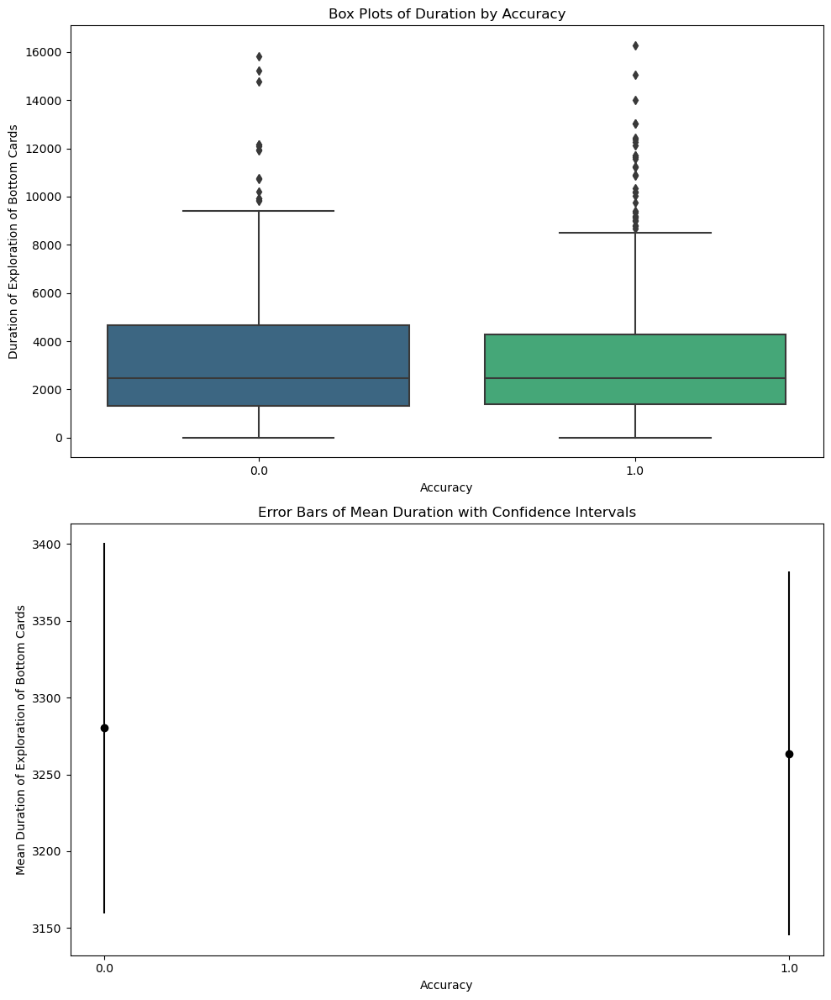

In [32]:
# HOW LONG INFANTS TAKE TO EXPLORE THE BOTTOM CARDS BY ACCURACY (durLookBottom vs accuracy)

LookDurBottom_by_accuracy = [exploration_data[exploration_data['accuracy'] == level]['durLookBottom'] for level in exploration_data['accuracy'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('accuracy')['durLookBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*LookDurBottom_by_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*LookDurBottom_by_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of exploration of bottom cards duration by accuracy
mean_lookduration_by_accuracy = exploration_data.groupby('accuracy')['durLookBottom'].mean()
sem_lookduration_by_accuracy = exploration_data.groupby('accuracy')['durLookBottom'].sem()
print("Mean Duration of Exploration by Accuracy:")
print(mean_lookduration_by_accuracy)
print("SEM Duration of Exploration by Accuracy:")
print(sem_lookduration_by_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='accuracy', y='durLookBottom', data=exploration_data, palette='viridis', ax=ax1)
ax1.set_xlabel('Accuracy')
ax1.set_ylabel('Duration of Exploration of Bottom Cards')
ax1.set_title('Box Plots of Duration by Accuracy')

ax2.errorbar(np.arange(len(mean_lookduration_by_accuracy)), mean_lookduration_by_accuracy, yerr=sem_lookduration_by_accuracy, fmt='o', color='black')
ax2.set_xlabel('Accuracy')
ax2.set_ylabel('Mean Duration of Exploration of Bottom Cards')
ax2.set_title('Error Bars of Mean Duration with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_lookduration_by_accuracy)))
ax2.set_xticklabels(mean_lookduration_by_accuracy.index)

plt.tight_layout()
plt.show()

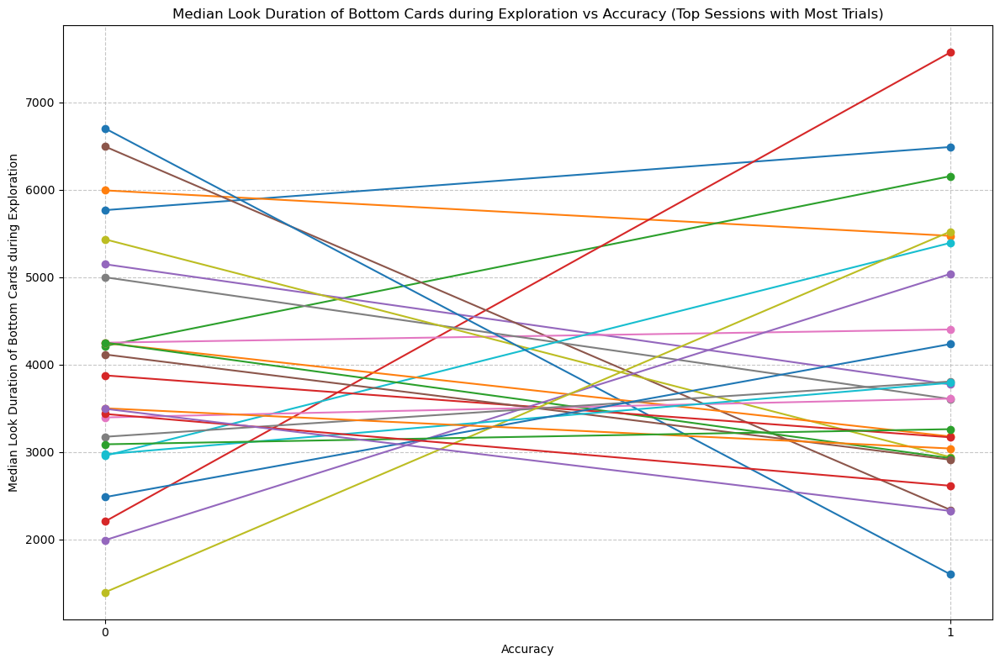

In [33]:
# Median gaze duration of bottom cards during exploration per session by accuracy

exploration_durlookB_per_trial_accuracy = exploration_data.groupby(['session', 'trialno', 'accuracy'])['durLookBottom'].sum().reset_index()
median_exploration_durlookB_per_session_accuracy = exploration_durlookB_per_trial_accuracy.groupby(['session', 'accuracy'])['durLookBottom'].median().unstack()

plt.figure(figsize=(12, 8))

top_sessions = median_exploration_durlookB_per_session_accuracy.sum(axis=1).nlargest(25).index

for session in top_sessions:
    session_data = median_exploration_durlookB_per_session_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median Look Duration of Bottom Cards during Exploration vs Accuracy (Top Sessions with Most Trials)')
plt.xlabel('Accuracy')
plt.ylabel('Median Look Duration of Bottom Cards during Exploration')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 5.003415136552765e-19
Shapiro-Wilk test for 1.0: p-value = 2.1084781627507706e-21
Levene's test for homogeneity of variances: p-value = 0.5869916798556749
Kruskal-Wallis test:
H-statistic: 0.11099573854969004
p-value: 0.7390133370659928
Mean FixNbInBottom by Accuracy:
accuracy
0.0    8.920570
1.0    8.781076
Name: FixNbInBottom, dtype: float64
SEM FixNbInBottom by Accuracy:
accuracy
0.0    0.317532
1.0    0.303882
Name: FixNbInBottom, dtype: float64


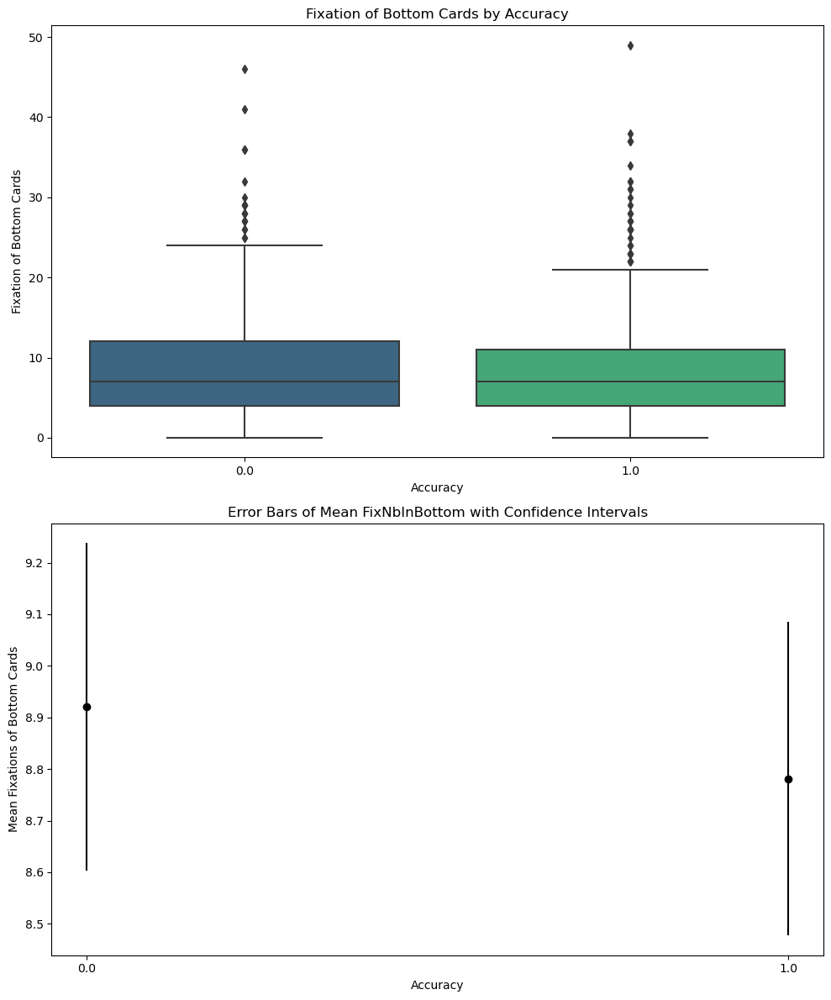

In [34]:
# NUMBER OF FIXATIONS DURING EXPLORATION OF THE BOTTOM CARDS BY ACCURACY

FixNbInBottom_by_accuracy = [exploration_data[exploration_data['accuracy'] == level]['FixNbInBottom'] for level in exploration_data['accuracy'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('accuracy')['FixNbInBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*FixNbInBottom_by_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*FixNbInBottom_by_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of fixations of bottom cards duration by accuracy
mean_FixNbInBottom_by_accuracy = exploration_data.groupby('accuracy')['FixNbInBottom'].mean()
sem_FixNbInBottom_by_accuracy = exploration_data.groupby('accuracy')['FixNbInBottom'].sem()
print("Mean FixNbInBottom by Accuracy:")
print(mean_FixNbInBottom_by_accuracy)
print("SEM FixNbInBottom by Accuracy:")
print(sem_FixNbInBottom_by_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='accuracy', y='FixNbInBottom', data=exploration_data, palette='viridis', ax=ax1)
ax1.set_xlabel('Accuracy')
ax1.set_ylabel('Fixation of Bottom Cards')
ax1.set_title('Fixation of Bottom Cards by Accuracy')

ax2.errorbar(np.arange(len(mean_FixNbInBottom_by_accuracy)), mean_FixNbInBottom_by_accuracy, yerr=sem_FixNbInBottom_by_accuracy, fmt='o', color='black')
ax2.set_xlabel('Accuracy')
ax2.set_ylabel('Mean Fixations of Bottom Cards')
ax2.set_title('Error Bars of Mean FixNbInBottom with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_FixNbInBottom_by_accuracy)))
ax2.set_xticklabels(mean_FixNbInBottom_by_accuracy.index)

plt.tight_layout()
plt.show()

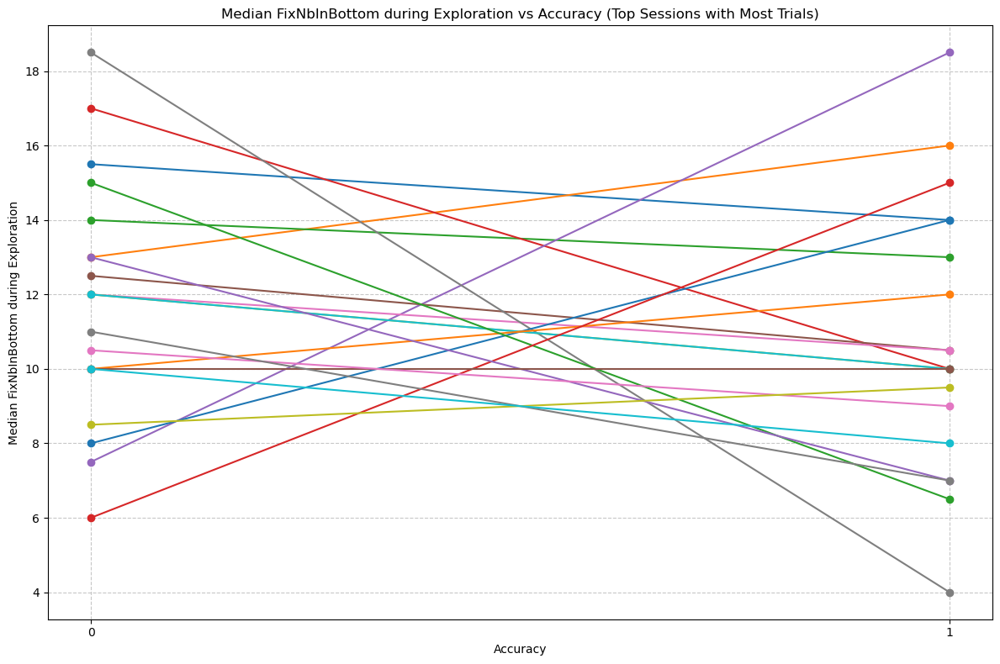

In [35]:
# Median fixations of bottom cards during exploration per session by accuracy

exploration_FixNbInBottom_per_trial_accuracy = exploration_data.groupby(['session', 'trialno', 'accuracy'])['FixNbInBottom'].sum().reset_index()
median_exploration_FixNbInBottom_per_session_accuracy = exploration_FixNbInBottom_per_trial_accuracy.groupby(['session', 'accuracy'])['FixNbInBottom'].median().unstack()

plt.figure(figsize=(12, 8))

top_sessions = median_exploration_FixNbInBottom_per_session_accuracy.sum(axis=1).nlargest(20).index

for session in top_sessions:
    session_data = median_exploration_FixNbInBottom_per_session_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median FixNbInBottom during Exploration vs Accuracy (Top Sessions with Most Trials)')
plt.xlabel('Accuracy')
plt.ylabel('Median FixNbInBottom during Exploration')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 1.7509788928615552e-20
Shapiro-Wilk test for 1.0: p-value = 2.515208236472228e-20
Levene's test for homogeneity of variances: p-value = 0.4317573813933656
Kruskal-Wallis test:
H-statistic: 0.0383009274292493
p-value: 0.8448401099372544
Mean NbSwitches by Accuracy:
accuracy
0.0    2.221996
1.0    2.265306
Name: NbSwitches, dtype: float64
SEM NbSwitches by Accuracy:
accuracy
0.0    0.059815
1.0    0.060032
Name: NbSwitches, dtype: float64


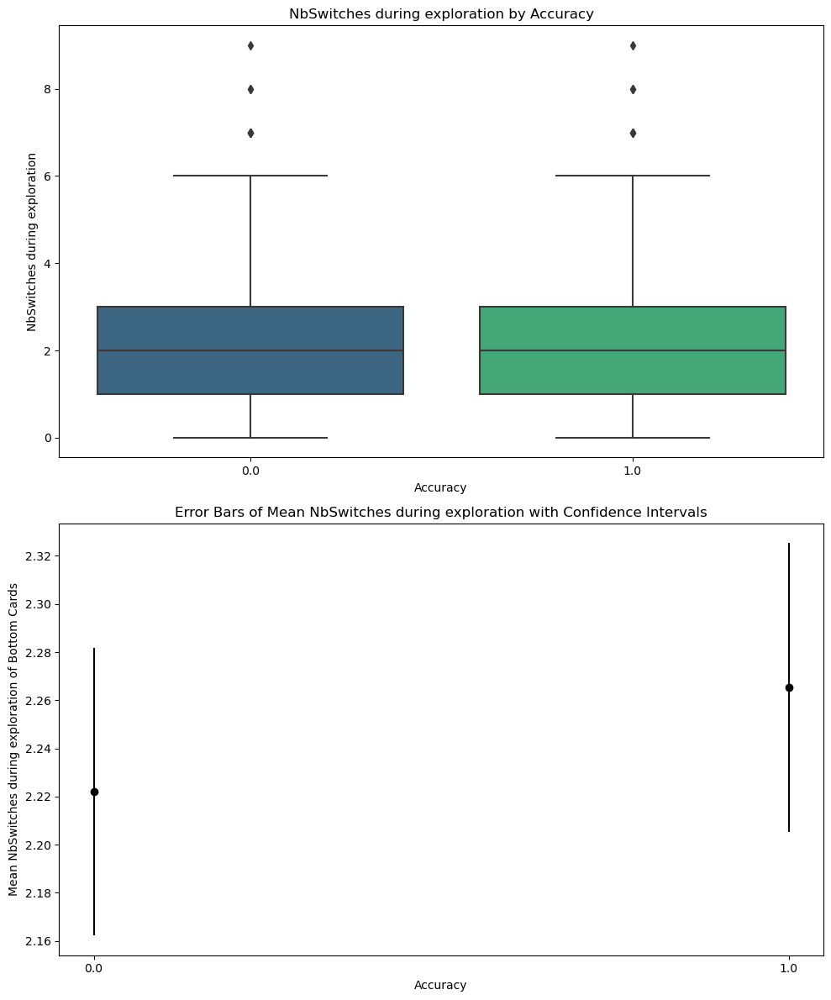

In [36]:
#NUMBER OF SWITCHES DURING EXPLORATION OF THE BOTTOM CARDS BY ACCURACY

NbSwitches_by_accuracy = [exploration_data[exploration_data['accuracy'] == level]['NbSwitches'] for level in exploration_data['accuracy'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('accuracy')['NbSwitches']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*NbSwitches_by_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*NbSwitches_by_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of NbSwitches during exploration by accuracy
mean_NbSwitches_by_accuracy = exploration_data.groupby('accuracy')['NbSwitches'].mean()
sem_NbSwitches_by_accuracy = exploration_data.groupby('accuracy')['NbSwitches'].sem()
print("Mean NbSwitches by Accuracy:")
print(mean_NbSwitches_by_accuracy)
print("SEM NbSwitches by Accuracy:")
print(sem_NbSwitches_by_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='accuracy', y='NbSwitches', data=exploration_data, palette='viridis', ax=ax1)
ax1.set_xlabel('Accuracy')
ax1.set_ylabel('NbSwitches during exploration')
ax1.set_title('NbSwitches during exploration by Accuracy')

ax2.errorbar(np.arange(len(mean_NbSwitches_by_accuracy)), mean_NbSwitches_by_accuracy, yerr=sem_NbSwitches_by_accuracy, fmt='o', color='black')
ax2.set_xlabel('Accuracy')
ax2.set_ylabel('Mean NbSwitches during exploration of Bottom Cards')
ax2.set_title('Error Bars of Mean NbSwitches during exploration with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_NbSwitches_by_accuracy)))
ax2.set_xticklabels(mean_NbSwitches_by_accuracy.index)

plt.tight_layout()
plt.show()

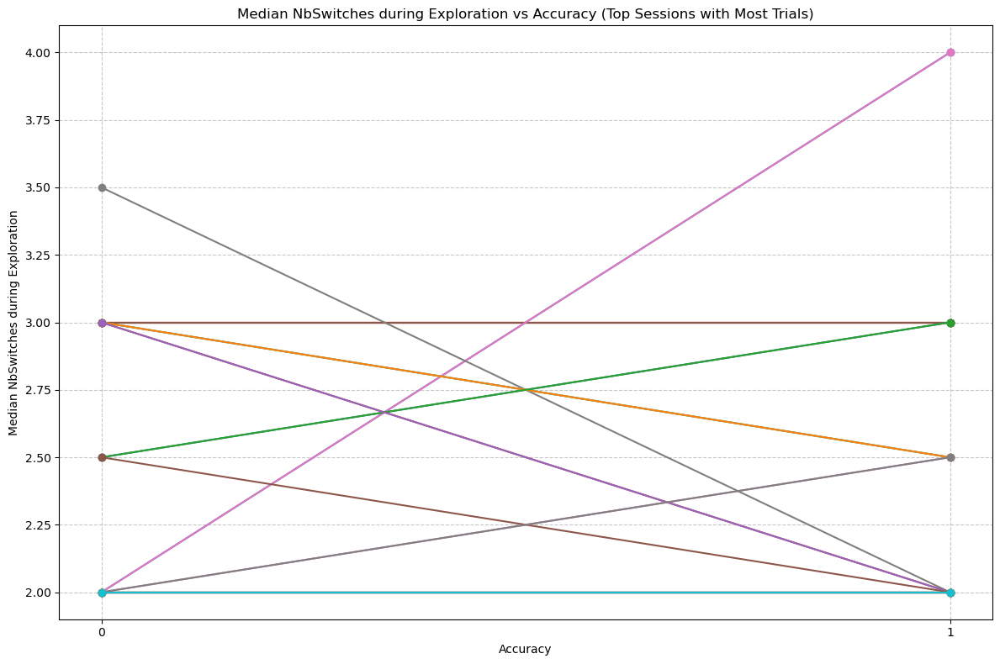

In [37]:
# Median NbSwitches during exploration per session by accuracy

exploration_NbSwitches_per_trial_accuracy = exploration_data.groupby(['session', 'trialno', 'accuracy'])['NbSwitches'].sum().reset_index()
median_exploration_NbSwitches_per_session_accuracy = exploration_NbSwitches_per_trial_accuracy.groupby(['session', 'accuracy'])['NbSwitches'].median().unstack()

plt.figure(figsize=(12, 8))

top_sessions = median_exploration_NbSwitches_per_session_accuracy.sum(axis=1).nlargest(30).index

for session in top_sessions:
    session_data = median_exploration_NbSwitches_per_session_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median NbSwitches during Exploration vs Accuracy (Top Sessions with Most Trials)')
plt.xlabel('Accuracy')
plt.ylabel('Median NbSwitches during Exploration')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for Easy: p-value = 2.9178972570534126e-24
Shapiro-Wilk test for Hard: p-value = 1.8307181863522315e-11
Shapiro-Wilk test for Medium: p-value = 3.198076735392095e-18
Shapiro-Wilk test for xHard: p-value = 5.7035672738566544e-11
Levene's test for homogeneity of variances: p-value = 0.23702754540940968
Kruskal-Wallis test:
H-statistic: 8.97766138241408
p-value: 0.029589369742263297
Shapiro-Wilk test for Easy: p-value = 1.8666521094080364e-26
Shapiro-Wilk test for Hard: p-value = 2.9312787623587787e-14
Shapiro-Wilk test for Medium: p-value = 1.5061519743592054e-22
Shapiro-Wilk test for xHard: p-value = 2.051996215992408e-11
Levene's test for homogeneity of variances: p-value = 0.9593512046687885
Kruskal-Wallis test:
H-statistic: 5.21361492506657
p-value: 0.15680703147864397
Exploration period duration
Means: 
difficulty
Easy      5742.665198
Hard      6540.969325
Medium    5922.818750
xHard     5242.774194
Name: durPeriodTotal, dtype: float64
Standard Errors of the Mean:

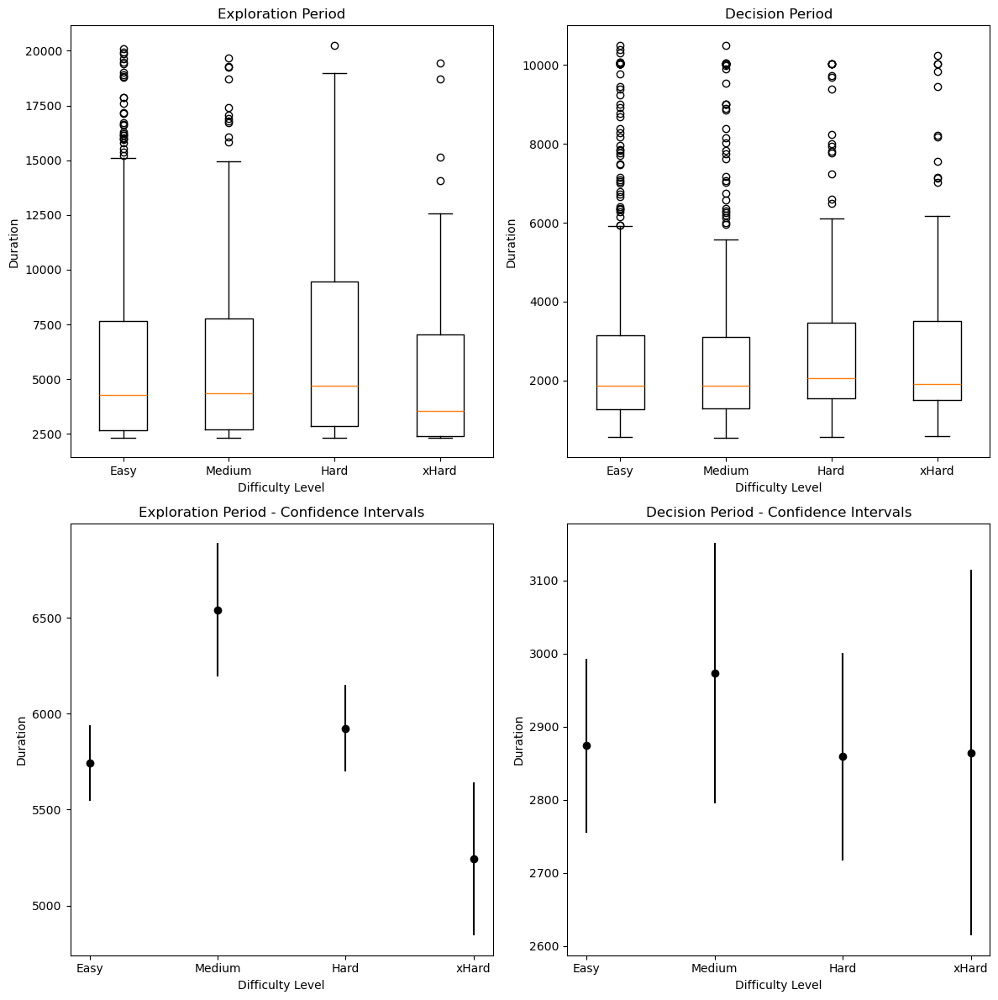

In [38]:
# Duration of both exploration and decision periods vs. difficulty level

exploration_grouped = data[data['period_in_trial'] == 'exploration'].groupby('difficulty')['durPeriodTotal']
decision_grouped = data[data['period_in_trial'] == 'decision'].groupby('difficulty')['durPeriodTotal']

# Means and standard errors of the mean for exploration and decision periods
exploration_means = exploration_grouped.mean()
exploration_sem = exploration_grouped.sem()
decision_means = decision_grouped.mean()
decision_sem = decision_grouped.sem()

# Shapiro-Wilk test for normality - Exploration period
for group_name, group_data in exploration_data.groupby('difficulty')['durPeriodTotal']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Exploration period
stat, p = levene(*[group_data for group_name, group_data in exploration_data.groupby('difficulty')['durPeriodTotal']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Exploration period
H, p = kruskal(*[group_data for group_name, group_data in exploration_data.groupby('difficulty')['durPeriodTotal']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Shapiro-Wilk test for normality - Decision period
for group_name, group_data in decision_data.groupby('difficulty')['durPeriodTotal']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Decision period
stat, p = levene(*[group_data for group_name, group_data in decision_data.groupby('difficulty')['durPeriodTotal']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Decision period
H, p = kruskal(*[group_data for group_name, group_data in decision_data.groupby('difficulty')['durPeriodTotal']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

print("Exploration period duration")
print("Means: ")
print(exploration_means)
print("Standard Errors of the Mean: ")
print(exploration_sem)
print("\nDecision period duration")
print("Means: ")
print(decision_means)
print("Standard Errors of the Mean: ")
print(decision_sem)

# Plots
difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

# Exploration Period Boxplot
exploration_data_reordered = [exploration_grouped.get_group(difficulty_order[i]).values for i in range(len(difficulty_order))]
axs[0, 0].boxplot(exploration_data_reordered, positions=np.arange(len(difficulty_order)))
axs[0, 0].set_title('Exploration Period')
axs[0, 0].set_xlabel('Difficulty Level')
axs[0, 0].set_ylabel('Duration')
axs[0, 0].set_xticks(np.arange(len(difficulty_order)))
axs[0, 0].set_xticklabels(difficulty_order)

# Decision Period Boxplot
decision_data_reordered = [decision_grouped.get_group(difficulty_order[i]).values for i in range(len(difficulty_order))]
axs[0, 1].boxplot(decision_data_reordered, positions=np.arange(len(difficulty_order)))
axs[0, 1].set_title('Decision Period')
axs[0, 1].set_xlabel('Difficulty Level')
axs[0, 1].set_ylabel('Duration')
axs[0, 1].set_xticks(np.arange(len(difficulty_order)))
axs[0, 1].set_xticklabels(difficulty_order)

# Exploration Period Error Bars
axs[1, 0].errorbar(np.arange(len(difficulty_order)), exploration_means, yerr=exploration_sem, fmt='o', color='black')
axs[1, 0].set_title('Exploration Period - Confidence Intervals')
axs[1, 0].set_xlabel('Difficulty Level')
axs[1, 0].set_ylabel('Duration')
axs[1, 0].set_xticks(np.arange(len(difficulty_order)))
axs[1, 0].set_xticklabels(difficulty_order)

# Decision Period Error Bars
axs[1, 1].errorbar(np.arange(len(difficulty_order)), decision_means, yerr=decision_sem, fmt='o', color='black')
axs[1, 1].set_title('Decision Period - Confidence Intervals')
axs[1, 1].set_xlabel('Difficulty Level')
axs[1, 1].set_ylabel('Duration')
axs[1, 1].set_xticks(np.arange(len(difficulty_order)))
axs[1, 1].set_xticklabels(difficulty_order)

plt.tight_layout()
plt.show()

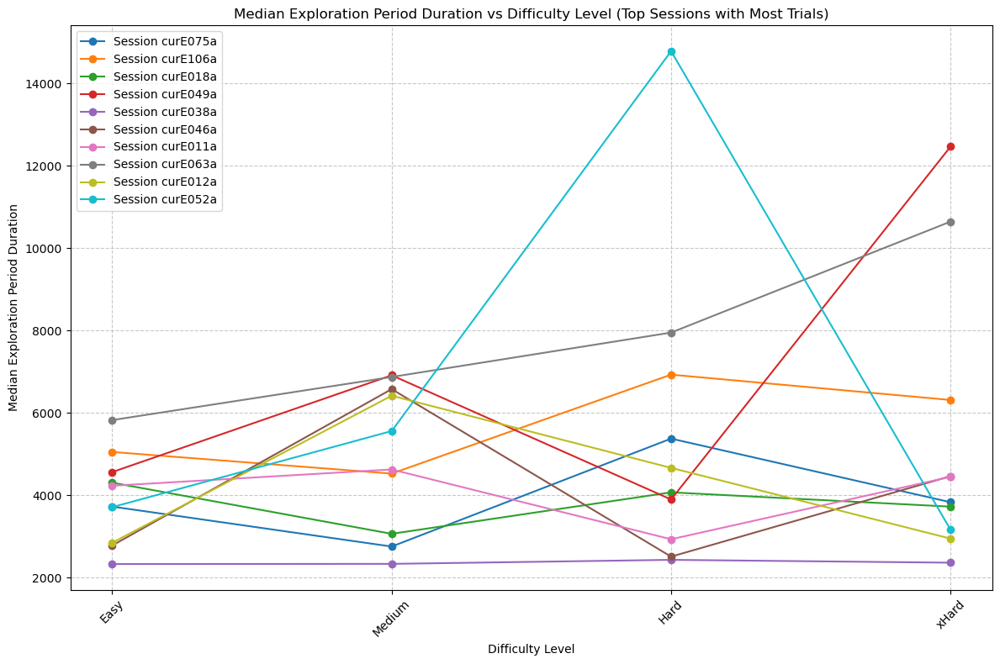

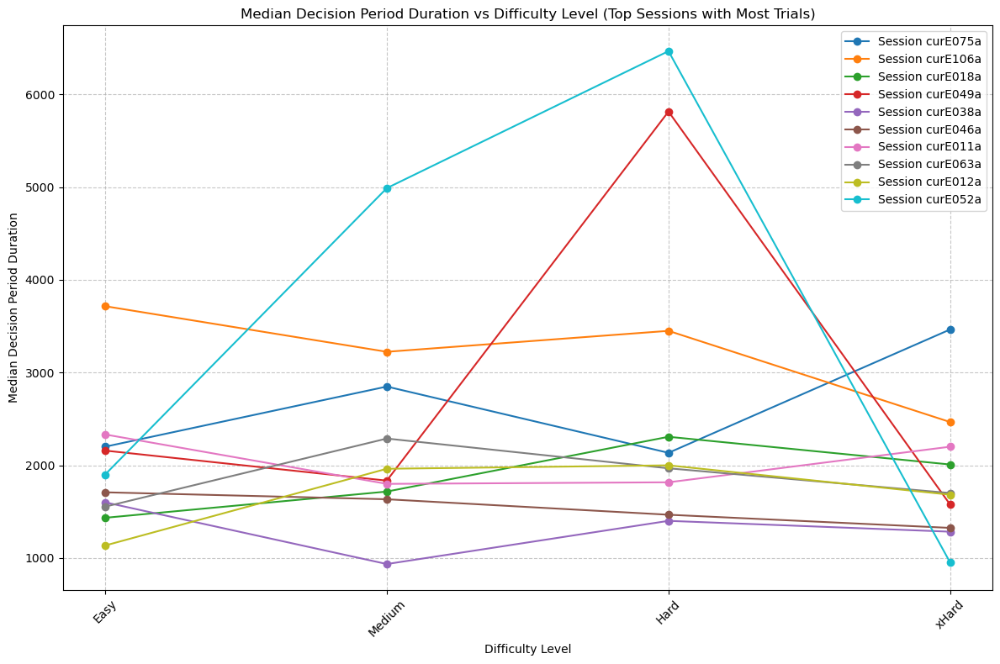

In [39]:
# Median duration of exploration and decision periods per session by difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

exploration_grouped = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()
decision_grouped = data[data['period_in_trial'] == 'decision'].groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()

plt.figure(figsize=(12, 8))

complete_sessions_exploration = exploration_grouped.dropna().index.get_level_values('session').unique()

total_trials_per_session_exploration = data[data['session'].isin(complete_sessions_exploration)].groupby('session')['durPeriodTotal'].sum()

top_complete_sessions_exploration = total_trials_per_session_exploration.nlargest(10).index

for session in top_complete_sessions_exploration:
    available_difficulty_levels = exploration_grouped.loc[session].dropna().index.tolist()
    
    if available_difficulty_levels:
        duration_session_exploration = exploration_grouped.loc[session][difficulty_order]
        plt.plot(duration_session_exploration.index, duration_session_exploration, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median Exploration Period Duration vs Difficulty Level (Top Sessions with Most Trials)')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Exploration Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))

complete_sessions_decision = decision_grouped.dropna().index.get_level_values('session').unique()

total_trials_per_session_decision = data[data['session'].isin(complete_sessions_decision)].groupby('session')['durPeriodTotal'].sum()

top_complete_sessions_decision = total_trials_per_session_decision.nlargest(10).index

for session in top_complete_sessions_decision:
    available_difficulty_levels = decision_grouped.loc[session].dropna().index.tolist()
    
    if available_difficulty_levels:
        duration_session_decision = decision_grouped.loc[session][difficulty_order]
        plt.plot(duration_session_decision.index, duration_session_decision, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median Decision Period Duration vs Difficulty Level (Top Sessions with Most Trials)')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Decision Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 1.1127690946152014e-23
Shapiro-Wilk test for 1.0: p-value = 6.075253401391355e-25
Levene's test for homogeneity of variances: p-value = 0.5956470624890615
Kruskal-Wallis test:
H-statistic: 0.08311093289024193
p-value: 0.773125015048195
Shapiro-Wilk test for 0.0: p-value = 5.553754251329691e-28
Shapiro-Wilk test for 1.0: p-value = 2.4936250755207744e-27
Levene's test for homogeneity of variances: p-value = 0.6017520363994722
Kruskal-Wallis test:
H-statistic: 5.6115469065065815
p-value: 0.017842505080864962
Exploration period duration
Means: 
accuracy
0.0    5936.904277
1.0    5827.844156
Name: durPeriodTotal, dtype: float64
Standard Errors of the Mean: 
accuracy
0.0    190.986279
1.0    177.643778
Name: durPeriodTotal, dtype: float64

Decision period duration
Means: 
accuracy
0.0    2791.727088
1.0    2968.315399
Name: durPeriodTotal, dtype: float64
Standard Errors of the Mean: 
accuracy
0.0    112.604926
1.0    106.345876
Name: durPeriodTotal, dtype

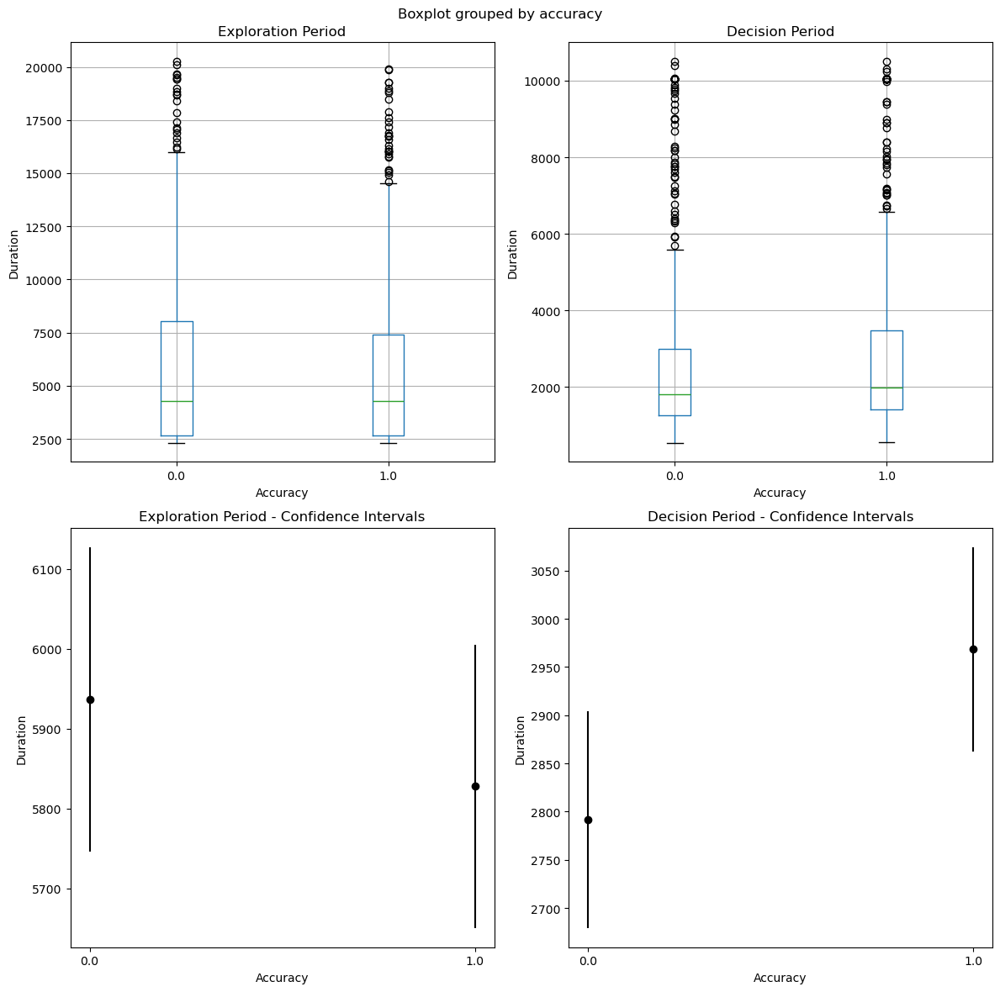

In [40]:
# Duration of both exploration and decision periods vs.accuracy
exploration_accuracy = data[data['period_in_trial'] == 'exploration'].groupby('accuracy')['durPeriodTotal']
decision_accuracy = data[data['period_in_trial'] == 'decision'].groupby('accuracy')['durPeriodTotal']

# Means and standard errors of the mean for exploration and decision periods
exploration_means_accuracy = exploration_accuracy.mean()
exploration_sem_accuracy = exploration_accuracy.sem()
decision_means_accuracy = decision_accuracy.mean()
decision_sem_accuracy = decision_accuracy.sem()

# Shapiro-Wilk test for normality - Exploration period
for group_name, group_data in exploration_data.groupby('accuracy')['durPeriodTotal']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Exploration period
stat, p = levene(*[group_data for group_name, group_data in exploration_data.groupby('accuracy')['durPeriodTotal']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Exploration period
H, p = kruskal(*[group_data for group_name, group_data in exploration_data.groupby('accuracy')['durPeriodTotal']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Shapiro-Wilk test for normality - Decision period
for group_name, group_data in decision_data.groupby('accuracy')['durPeriodTotal']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Decision period
stat, p = levene(*[group_data for group_name, group_data in decision_data.groupby('accuracy')['durPeriodTotal']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Decision period
H, p = kruskal(*[group_data for group_name, group_data in decision_data.groupby('accuracy')['durPeriodTotal']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

print("Exploration period duration")
print("Means: ")
print(exploration_means_accuracy)
print("Standard Errors of the Mean: ")
print(exploration_sem_accuracy)
print("\nDecision period duration")
print("Means: ")
print(decision_means_accuracy)
print("Standard Errors of the Mean: ")
print(decision_sem_accuracy)

accuracy_order = sorted(data['accuracy'].unique())

# Plots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

# Exploration Period Boxplot
data[data['period_in_trial'] == 'exploration'].boxplot(column='durPeriodTotal', by='accuracy', ax=axs[0, 0])
axs[0, 0].set_title('Exploration Period')
axs[0, 0].set_xlabel('Accuracy')
axs[0, 0].set_ylabel('Duration')

# Decision Period Boxplot
data[data['period_in_trial'] == 'decision'].boxplot(column='durPeriodTotal', by='accuracy', ax=axs[0, 1])
axs[0, 1].set_title('Decision Period')
axs[0, 1].set_xlabel('Accuracy')
axs[0, 1].set_ylabel('Duration')

# Exploration Period Error Bars
x_exploration = np.arange(len(accuracy_order))
axs[1, 0].errorbar(x_exploration, exploration_means_accuracy, yerr=exploration_sem_accuracy, fmt='o', color='black')
axs[1, 0].set_title('Exploration Period - Confidence Intervals')
axs[1, 0].set_xlabel('Accuracy')
axs[1, 0].set_ylabel('Duration')
axs[1, 0].set_xticks(x_exploration)
axs[1, 0].set_xticklabels(accuracy_order)

# Decision Period Error Bars
x_decision = np.arange(len(accuracy_order))
axs[1, 1].errorbar(x_decision, decision_means_accuracy, yerr=decision_sem_accuracy, fmt='o', color='black')
axs[1, 1].set_title('Decision Period - Confidence Intervals')
axs[1, 1].set_xlabel('Accuracy')
axs[1, 1].set_ylabel('Duration')
axs[1, 1].set_xticks(x_decision)
axs[1, 1].set_xticklabels(accuracy_order)

plt.tight_layout()
plt.show()

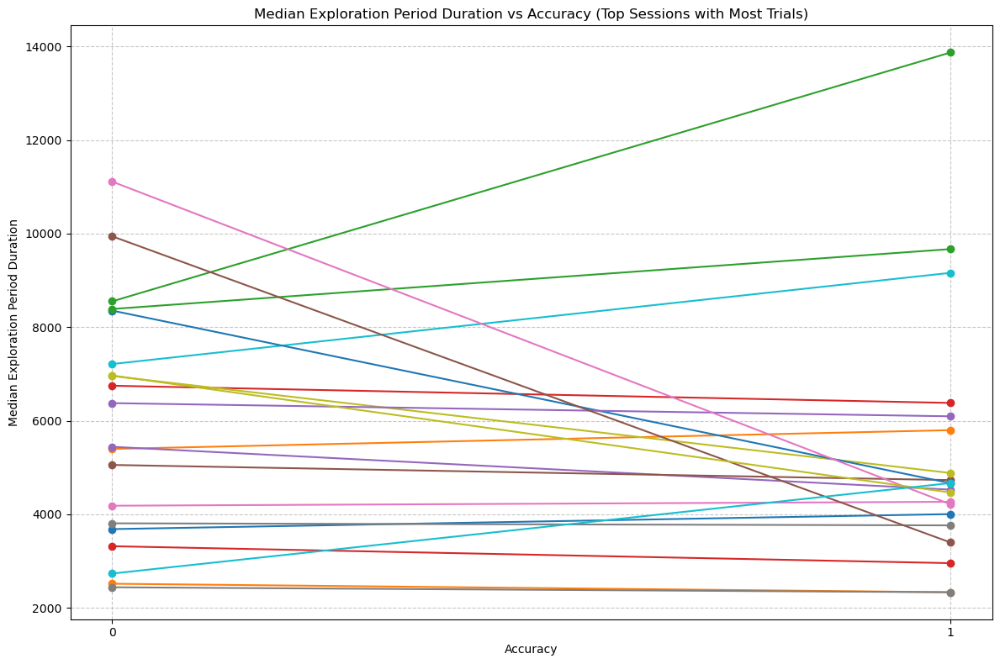

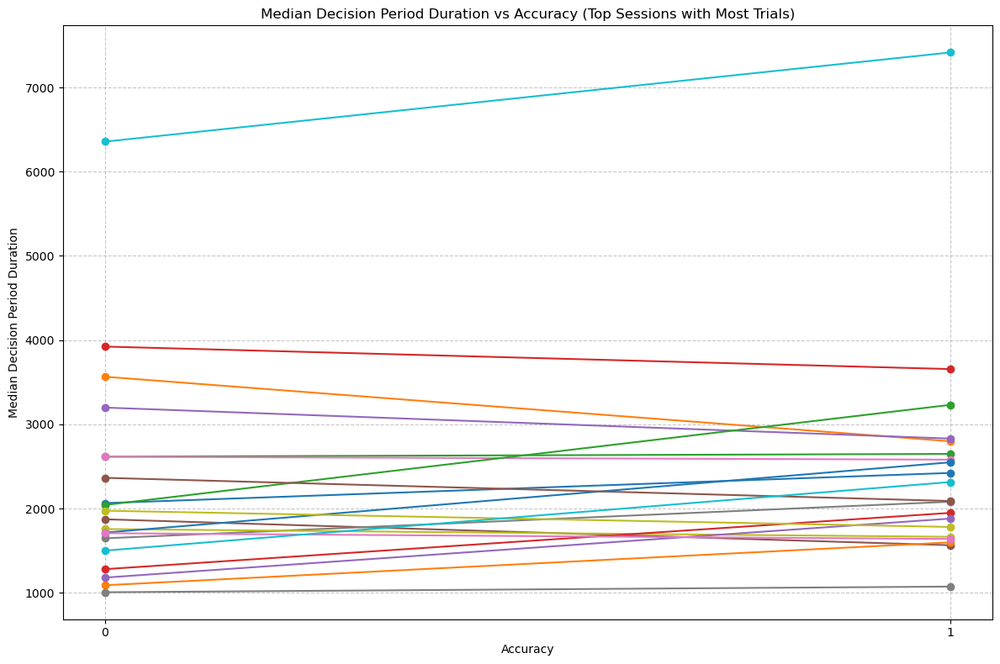

In [41]:
# Median duration of each period per session by accuracy (top sessions)
exploration_grouped = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'accuracy'])['durPeriodTotal'].median().unstack()
decision_grouped = data[data['period_in_trial'] == 'decision'].groupby(['session', 'accuracy'])['durPeriodTotal'].median().unstack()

plt.figure(figsize=(12, 8))

complete_sessions_exploration = exploration_grouped.dropna().index.get_level_values('session').unique()

total_trials_per_session_exploration = data[data['session'].isin(complete_sessions_exploration)].groupby('session')['durPeriodTotal'].sum()

top_complete_sessions_exploration = total_trials_per_session_exploration.nlargest(20).index

for session in top_complete_sessions_exploration:
    available_accuracy_levels = exploration_grouped.loc[session].dropna().index.tolist()
    
    if available_accuracy_levels:
        duration_session_exploration = exploration_grouped.loc[session][available_accuracy_levels]
        plt.plot(duration_session_exploration.index, duration_session_exploration, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median Exploration Period Duration vs Accuracy (Top Sessions with Most Trials)')
plt.xlabel('Accuracy')
plt.ylabel('Median Exploration Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))

complete_sessions_decision = decision_grouped.dropna().index.get_level_values('session').unique()

total_trials_per_session_decision = data[data['session'].isin(complete_sessions_decision)].groupby('session')['durPeriodTotal'].sum()

top_complete_sessions_decision = total_trials_per_session_decision.nlargest(20).index

for session in top_complete_sessions_decision:
    available_accuracy_levels = decision_grouped.loc[session].dropna().index.tolist()
    
    if available_accuracy_levels:
        duration_session_decision = decision_grouped.loc[session][available_accuracy_levels]
        plt.plot(duration_session_decision.index, duration_session_decision, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median Decision Period Duration vs Accuracy (Top Sessions with Most Trials)')
plt.xlabel('Accuracy')
plt.ylabel('Median Decision Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

Shapiro-Wilk test for Easy: p-value = 2.4936864554606906e-23
Shapiro-Wilk test for Hard: p-value = 6.152749243902459e-11
Shapiro-Wilk test for Medium: p-value = 4.356622668381656e-19
Shapiro-Wilk test for xHard: p-value = 6.241215107518201e-10
Levene's test for homogeneity of variances: p-value = 0.7139761274105348
Kruskal-Wallis test:
H-statistic: 3.2804650901879002
p-value: 0.3503708080897381
Mean LookTotDurInT (decision) by Difficulty Level:
difficulty
Easy      1527.325991
Hard      1601.042945
Medium    1434.368750
xHard     1418.430108
Name: LookTotDurInT, dtype: float64
SEM LookTotDurInT (decision) by Difficulty Level:
difficulty
Easy       69.578898
Hard      108.887590
Medium     76.458334
xHard     138.334918
Name: LookTotDurInT, dtype: float64


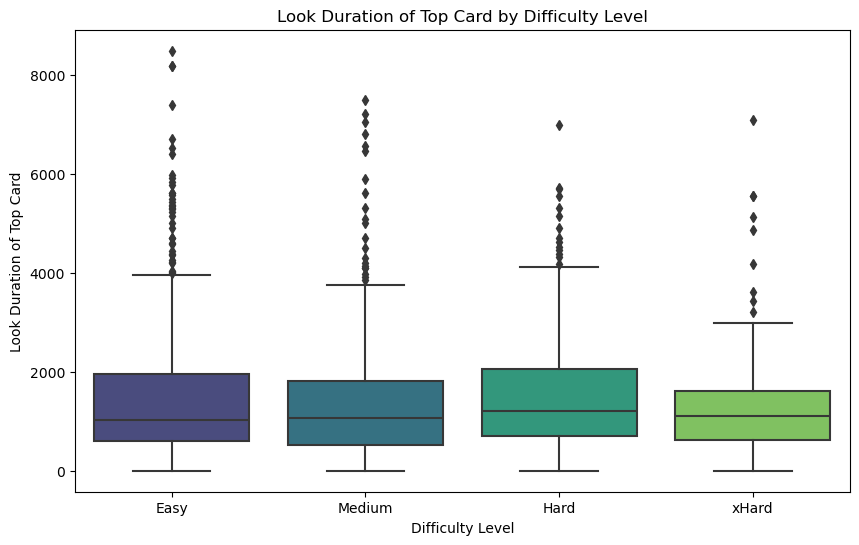

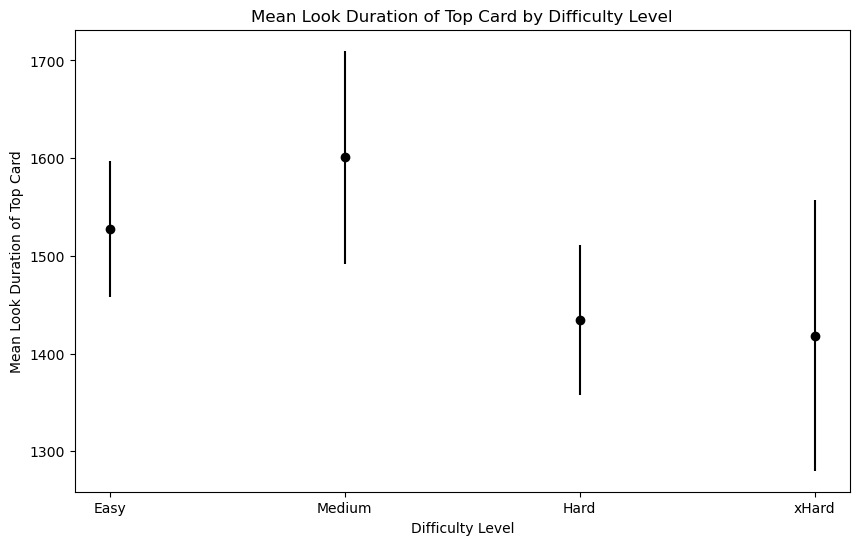

In [42]:
# Distribution of durgazeT per difficulty levels

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

LookTotDurInT_by_difficulty = [decision_data[decision_data['difficulty'] == level]['LookTotDurInT'] for level in decision_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in decision_data.groupby('difficulty')['LookTotDurInT']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*LookTotDurInT_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*LookTotDurInT_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration of bottom cards by difficulty level
mean_LookTotDurInT_by_difficulty = decision_data.groupby('difficulty')['LookTotDurInT'].mean()
sem_LookTotDurInT_by_difficulty = decision_data.groupby('difficulty')['LookTotDurInT'].sem()

print("Mean LookTotDurInT (decision) by Difficulty Level:")
print(mean_LookTotDurInT_by_difficulty)
print("SEM LookTotDurInT (decision) by Difficulty Level:")
print(sem_LookTotDurInT_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='LookTotDurInT', data=decision_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Look Duration of Top Card')
plt.title('Look Duration of Top Card by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_LookTotDurInT_by_difficulty))
plt.errorbar(x_gaze_positions, mean_LookTotDurInT_by_difficulty, yerr=sem_LookTotDurInT_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Look Duration of Top Card')
plt.title('Mean Look Duration of Top Card by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

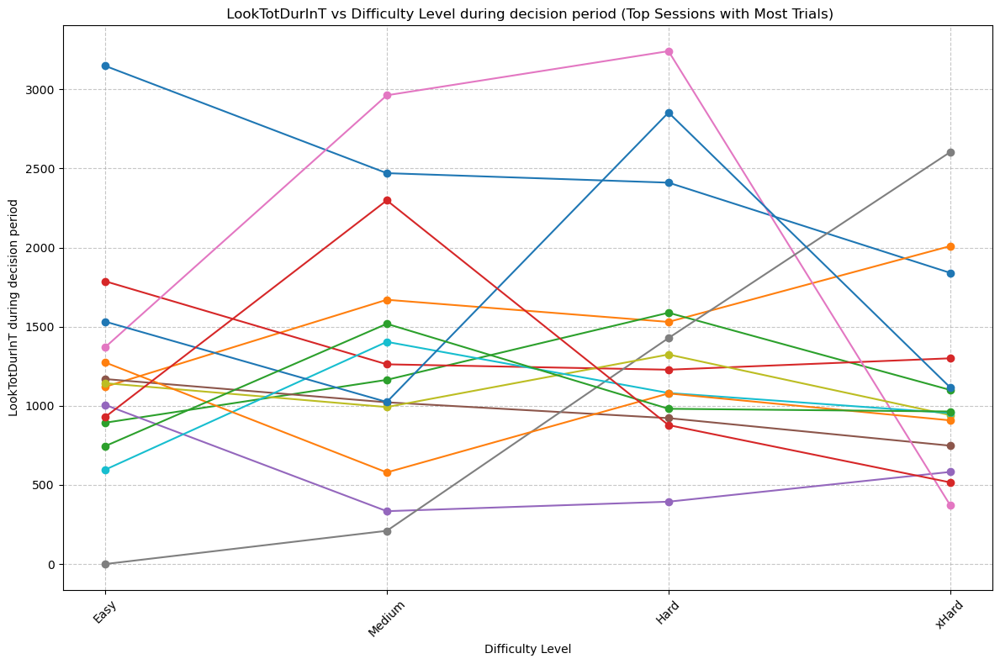

In [43]:
# Median gaze duration of top cards (decision period) per session by difficulty level (top sessions)

LookTotDurInT_by_difficulty = decision_data.groupby(['session', 'difficulty'])['LookTotDurInT'].median().unstack()

plt.figure(figsize=(12, 8))

complete_sessions = LookTotDurInT_by_difficulty.dropna().index.get_level_values('session').unique()

total_trials_per_session = decision_data[decision_data['session'].isin(complete_sessions)].groupby('session')['LookTotDurInT'].sum()

top_complete_sessions = total_trials_per_session.nlargest(25).index

for session in top_complete_sessions:
    available_difficulty_levels = LookTotDurInT_by_difficulty.loc[session].dropna().index.tolist()
    
    if available_difficulty_levels:
        LookTotDurInT_session = LookTotDurInT_by_difficulty.loc[session][available_difficulty_levels]
        LookTotDurInT_session_sorted = LookTotDurInT_session.reindex(difficulty_order)
        plt.plot(LookTotDurInT_session_sorted.index, LookTotDurInT_session_sorted, marker='o', linestyle='-', label=f'Session {session}')

plt.title(' LookTotDurInT vs Difficulty Level during decision period (Top Sessions with Most Trials)')
plt.xlabel('Difficulty Level')
plt.ylabel('LookTotDurInT during decision period')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 1.1576162796152296e-24
Shapiro-Wilk test for 1.0: p-value = 6.534064515872679e-23
Levene's test for homogeneity of variances: p-value = 0.4182754911099349
Kruskal-Wallis test:
H-statistic: 1.0365204531197085
p-value: 0.3086321055414889
Mean LookTotDurInT by Accuracy (decision):
accuracy
0.0    1503.804481
1.0    1497.068646
Name: LookTotDurInT, dtype: float64
SEM LookTotDurInT by Accuracy (decision):
accuracy
0.0    67.628306
1.0    57.921097
Name: LookTotDurInT, dtype: float64


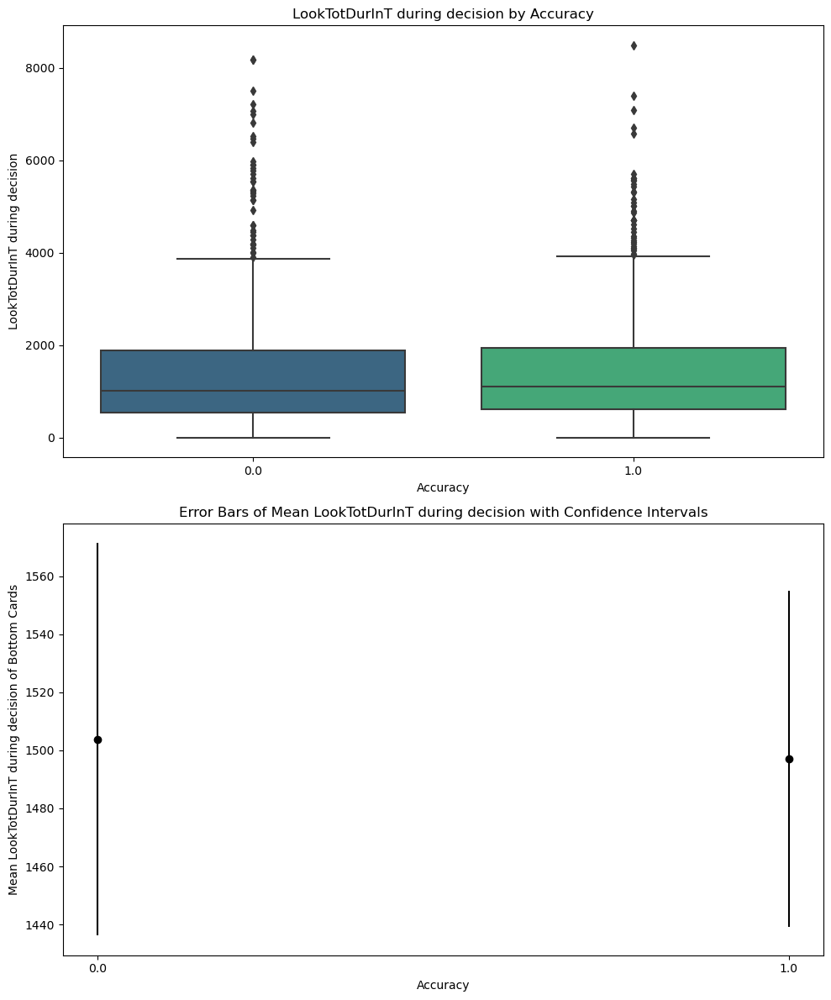

In [44]:
#Distribution of durgazeT vs accuracy

LookTotDurInT_by_accuracy = [decision_data[decision_data['accuracy'] == level]['LookTotDurInT'] for level in decision_data['accuracy'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in decision_data.groupby('accuracy')['LookTotDurInT']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*LookTotDurInT_by_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*LookTotDurInT_by_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of LookTotDurInTs during decision by accuracy
mean_LookTotDurInT_by_accuracy = decision_data.groupby('accuracy')['LookTotDurInT'].mean()
sem_LookTotDurInT_by_accuracy = decision_data.groupby('accuracy')['LookTotDurInT'].sem()
print("Mean LookTotDurInT by Accuracy (decision):")
print(mean_LookTotDurInT_by_accuracy)
print("SEM LookTotDurInT by Accuracy (decision):")
print(sem_LookTotDurInT_by_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='accuracy', y='LookTotDurInT', data=decision_data, palette='viridis', ax=ax1)
ax1.set_xlabel('Accuracy')
ax1.set_ylabel('LookTotDurInT during decision')
ax1.set_title('LookTotDurInT during decision by Accuracy')

ax2.errorbar(np.arange(len(mean_LookTotDurInT_by_accuracy)), mean_LookTotDurInT_by_accuracy, yerr=sem_LookTotDurInT_by_accuracy, fmt='o', color='black')
ax2.set_xlabel('Accuracy')
ax2.set_ylabel('Mean LookTotDurInT during decision of Bottom Cards')
ax2.set_title('Error Bars of Mean LookTotDurInT during decision with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_LookTotDurInT_by_accuracy)))
ax2.set_xticklabels(mean_LookTotDurInT_by_accuracy.index)

plt.tight_layout()
plt.show()

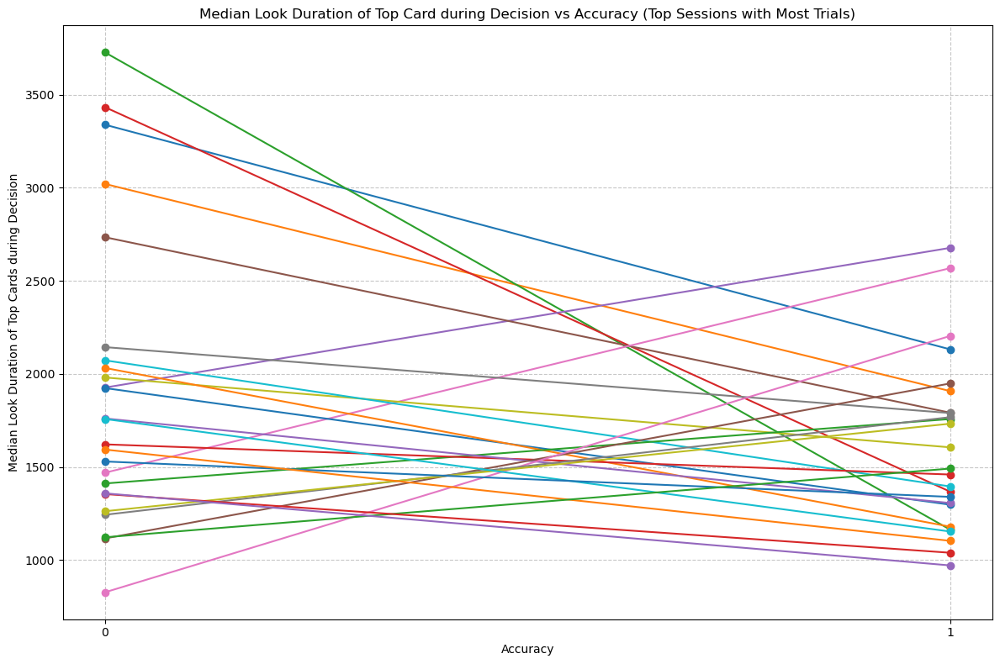

In [45]:
# Mean gaze duration of top cards per session by accuracy (top sessions)

decision_LookTotDurInT_per_trial_accuracy = decision_data.groupby(['session', 'trialno', 'accuracy'])['LookTotDurInT'].sum().reset_index()
median_decision_LookTotDurInT_per_session_accuracy = decision_LookTotDurInT_per_trial_accuracy.groupby(['session', 'accuracy'])['LookTotDurInT'].median().unstack()

plt.figure(figsize=(12, 8))

top_sessions = median_decision_LookTotDurInT_per_session_accuracy.sum(axis=1).nlargest(25).index

for session in top_sessions:
    session_data = median_decision_LookTotDurInT_per_session_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median Look Duration of Top Card during Decision vs Accuracy (Top Sessions with Most Trials)')
plt.xlabel('Accuracy')
plt.ylabel('Median Look Duration of Top Cards during Decision')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()
plt.tight_layout()
plt.show()

Shapiro-Wilk test for 0.0: p-value = 2.1947924329897676e-26
Shapiro-Wilk test for 1.0: p-value = 2.9870692623357816e-22
Levene's test for homogeneity of variances: p-value = 0.23545036543625297
Kruskal-Wallis test:
H-statistic: 3.436175346694272
p-value: 0.06378318609232107
Mean FixNbInT by Accuracy (decision):
accuracy
0.0    3.700611
1.0    3.730983
Name: FixNbInT, dtype: float64
SEM FixNbInT by Accuracy (decision):
accuracy
0.0    0.164558
1.0    0.130599
Name: FixNbInT, dtype: float64


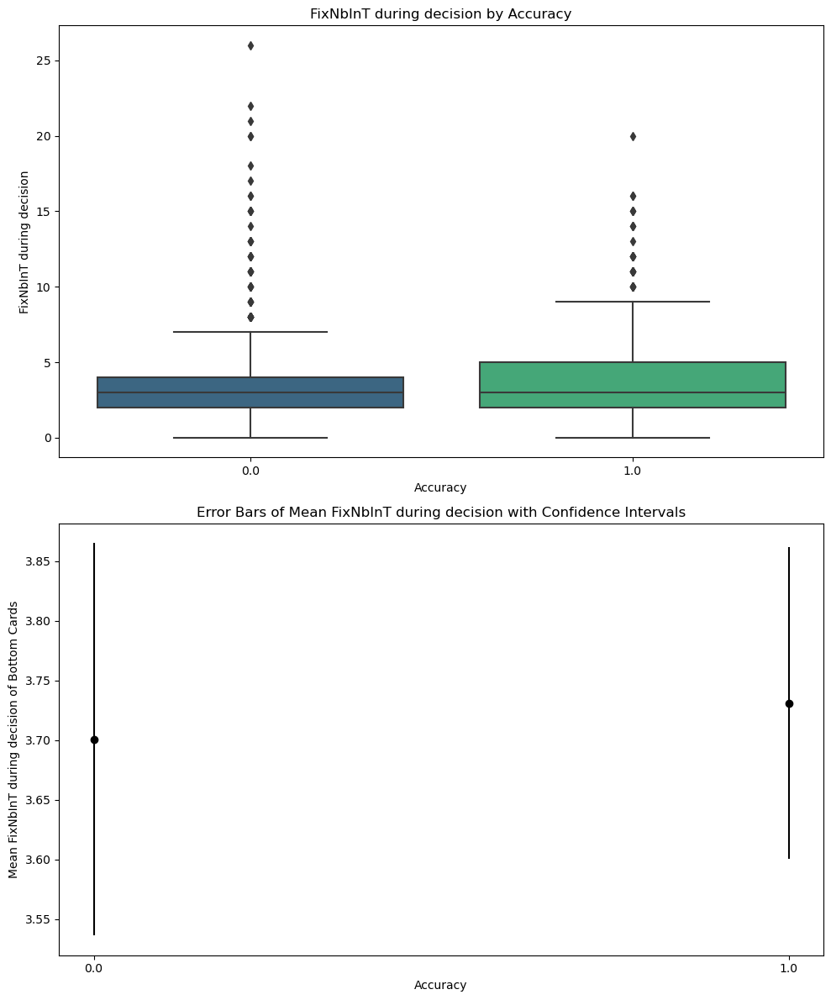

In [46]:
#Distribution of nFixWithinT (decision) per difficulty level 

FixNbInT_by_accuracy = [decision_data[decision_data['accuracy'] == level]['FixNbInT'] for level in decision_data['accuracy'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in decision_data.groupby('accuracy')['FixNbInT']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*FixNbInT_by_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*FixNbInT_by_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of FixNbInT during decision by accuracy
mean_FixNbInT_by_accuracy = decision_data.groupby('accuracy')['FixNbInT'].mean()
sem_FixNbInT_by_accuracy = decision_data.groupby('accuracy')['FixNbInT'].sem()
print("Mean FixNbInT by Accuracy (decision):")
print(mean_FixNbInT_by_accuracy)
print("SEM FixNbInT by Accuracy (decision):")
print(sem_FixNbInT_by_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='accuracy', y='FixNbInT', data=decision_data, palette='viridis', ax=ax1)
ax1.set_xlabel('Accuracy')
ax1.set_ylabel('FixNbInT during decision')
ax1.set_title('FixNbInT during decision by Accuracy')

ax2.errorbar(np.arange(len(mean_FixNbInT_by_accuracy)), mean_FixNbInT_by_accuracy, yerr=sem_FixNbInT_by_accuracy, fmt='o', color='black')
ax2.set_xlabel('Accuracy')
ax2.set_ylabel('Mean FixNbInT during decision of Bottom Cards')
ax2.set_title('Error Bars of Mean FixNbInT during decision with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_FixNbInT_by_accuracy)))
ax2.set_xticklabels(mean_FixNbInT_by_accuracy.index)

plt.tight_layout()
plt.show()

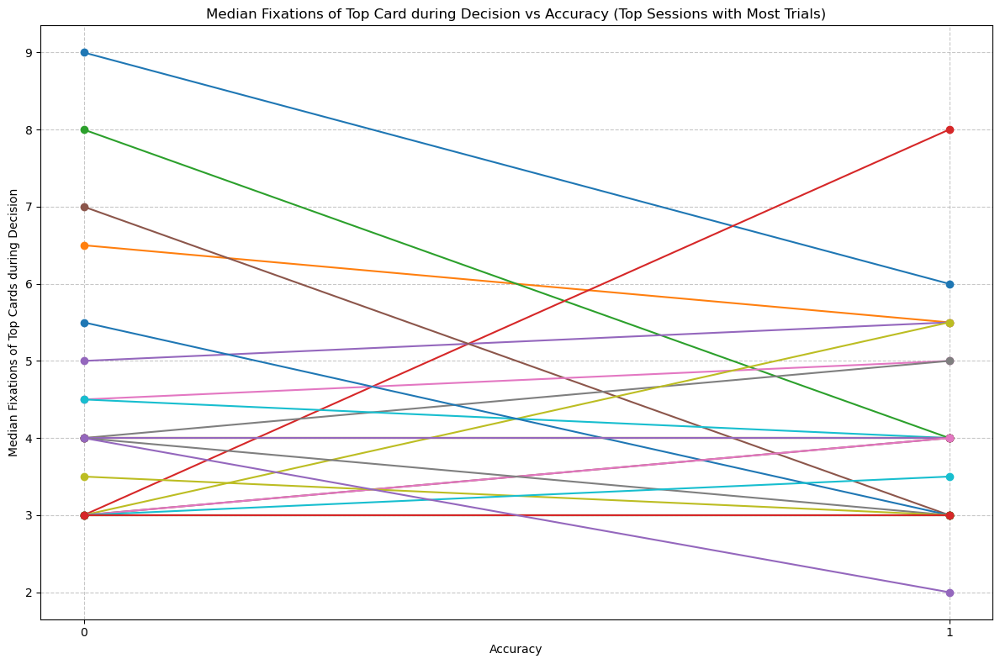

In [47]:
# Distribution of nFixWithinT (Decision) per accuracy 

decision_FixNbInT_per_trial_accuracy = decision_data.groupby(['session', 'trialno', 'accuracy'])['FixNbInT'].sum().reset_index()
median_decision_FixNbInT_per_session_accuracy = decision_FixNbInT_per_trial_accuracy.groupby(['session', 'accuracy'])['FixNbInT'].median().unstack()

plt.figure(figsize=(12, 8))

top_sessions = median_decision_FixNbInT_per_session_accuracy.sum(axis=1).nlargest(25).index

for session in top_sessions:
    session_data = median_decision_FixNbInT_per_session_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')

plt.title('Median Fixations of Top Card during Decision vs Accuracy (Top Sessions with Most Trials)')
plt.xlabel('Accuracy')
plt.ylabel('Median Fixations of Top Cards during Decision')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()
plt.tight_layout()
plt.show()

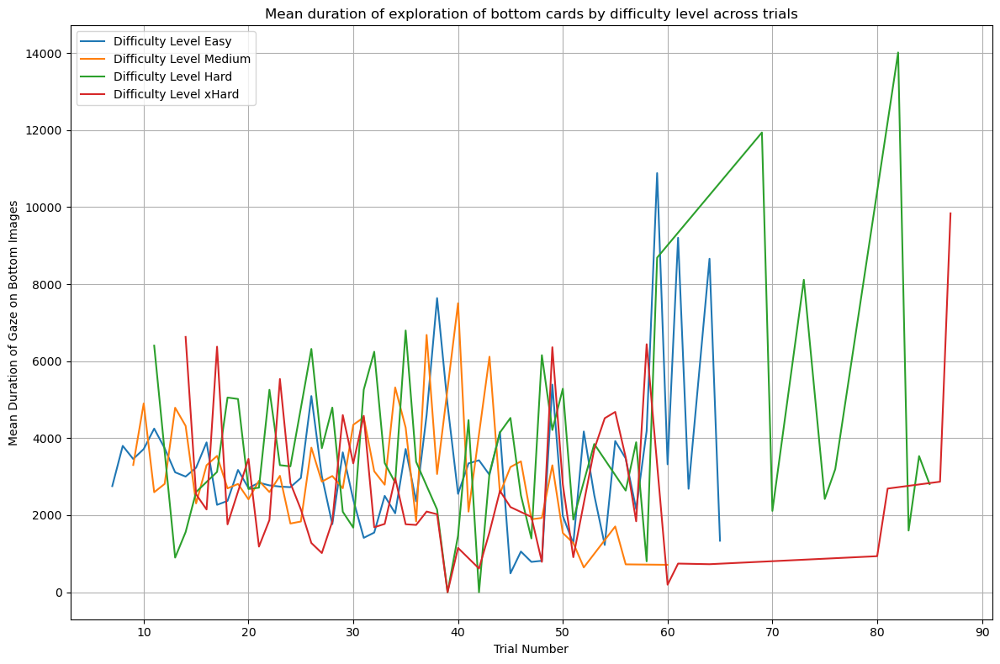

In [48]:
#Mean duration of exploration of bottom cards by difficulty level across trials

plt.figure(figsize=(12, 8))
for level in exploration_data['difficulty'].unique():
    filtered_data = exploration_data[exploration_data['difficulty'] == level]
    mean_gaze_duration = filtered_data.groupby('trialno')['durLookBottom'].mean()
    plt.plot(mean_gaze_duration.index, mean_gaze_duration, label=f'Difficulty Level {level}')

plt.xlabel('Trial Number')
plt.ylabel('Mean Duration of Gaze on Bottom Images')
plt.title('Mean duration of exploration of bottom cards by difficulty level across trials')
plt.legend()

plt.grid(True)
plt.tight_layout()
plt.show()

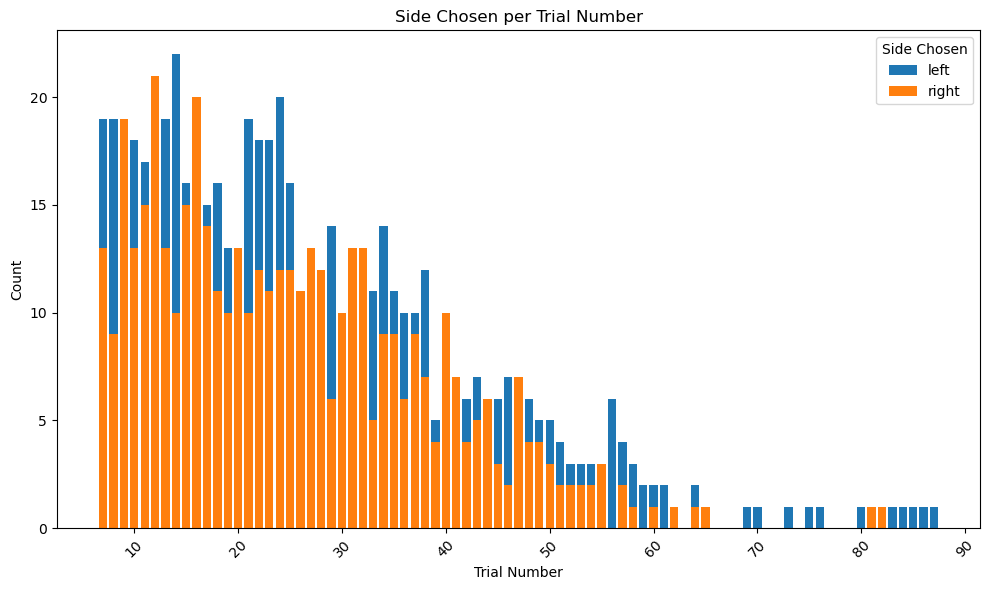

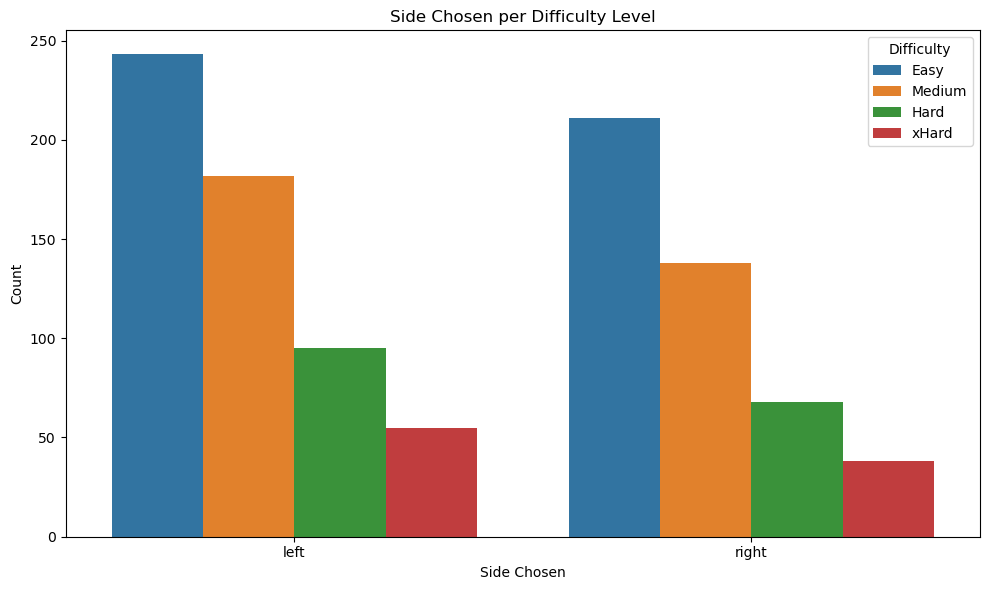

In [49]:
# Is there a tendency to choose a side?

# Plot: side chosen per trial number

agg_data = decision_data.groupby(['trialno', 'sideChosen']).size().unstack(fill_value=0).reset_index()

plt.figure(figsize=(10, 6))
for side in ['left', 'right']:
    plt.bar(agg_data['trialno'], agg_data[side], label=side)
    
plt.title('Side Chosen per Trial Number')
plt.xlabel('Trial Number')
plt.ylabel('Count')
plt.legend(title='Side Chosen', loc='upper right')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot: side chosen per difficulty level
plt.figure(figsize=(10, 6))
sns.countplot(data=decision_data, x='sideChosen', hue='difficulty')
plt.title('Side Chosen per Difficulty Level')
plt.xlabel('Side Chosen')
plt.ylabel('Count')
plt.legend(title='Difficulty')
plt.tight_layout()
plt.show()

In [19]:
#Read the dataset and drop NaN values

dataset = 'merged_filtered_data.csv'
merged_filtered_data = pd.read_csv(dataset)
merged_filtered_data.dropna(inplace=True)

merged_filtered_data

,session,trialno,difficulty,accuracy,sideChosen,durExplorationPeriod,durDecisionPeriod,durPeriodTotal,SwitchesExplorationPeriod,SwitchesDecisionPeriod,...,FixNbDecisionPeriod,FixNb,FixNbInTDecision,FixNbInLExploration,FixNbInRExploration,FixNbBottomExploration,LookDurInTDecision,LookDurInLExploration,LookDurInRExploration,LookDurBottomExploration
0,curE002a,8,Easy,0.0,left,11270,924,12194,6,0,...,2,22,1,13,5,18,1208,4404,1076,5480
1,curE002a,9,Easy,1.0,left,2498,2182,4680,2,0,...,4,10,3,3,2,5,2176,1036,634,1670
2,curE002a,10,Easy,1.0,right,9912,2914,12826,3,1,...,6,17,3,3,5,8,2020,754,1904,2658
3,curE002a,11,Medium,1.0,right,2328,1582,3910,2,1,...,5,10,3,2,1,3,1780,584,410,994
4,curE002a,12,Medium,0.0,left,14272,984,15256,5,1,...,3,26,1,14,7,21,1296,4854,2700,7554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1025,curE122a,27,Medium,1.0,left,13092,1598,14690,2,0,...,5,25,4,15,3,18,1484,8504,894,9398
1026,curE122a,28,Medium,1.0,right,13796,566,14362,3,1,...,2,24,0,5,16,21,288,1178,5768,6946
1027,curE122a,35,Hard,1.0,left,16894,1432,18326,5,0,...,0,38,0,22,15,37,118,6830,4860,11690
1028,curE122a,38,Hard,1.0,left,2414,582,2996,2,1,...,2,7,0,2,1,3,502,1316,270,1586


In [20]:
#Correlation between difficulty level and some of the variables: including the four difficulty levels

grouped = merged_filtered_data.groupby('difficulty')


continuous_variables = ['accuracy', 'durExplorationPeriod', 'durDecisionPeriod', 'durPeriodTotal', 'SwitchesExplorationPeriod', 
                        'FixNb', 'FixNbInTDecision', 'FixNbBottomExploration', 'LookDurInTDecision', 'LookDurBottomExploration']

#Kruskal-Wallis test and Spearman's correlation 

kruskal_results = {}
spearman_results = {}
for variable in continuous_variables:
    groups_data = [group[variable].dropna() for _, group in grouped]
    kruskal_stat, kruskal_pvalue = kruskal(*groups_data)
    kruskal_results[variable] = (kruskal_stat, kruskal_pvalue)
    spearman_results[variable] = spearmanr(merged_filtered_data[variable], merged_filtered_data['difficulty'])
    
for variable in continuous_variables:
    print(f"{variable}")
    print(f"Kruskal-Wallis test: test statistic = {kruskal_results[variable][0]:.4f}, p-value = {kruskal_results[variable][1]:.4f}")
    print(f"Spearman's rank correlation: correlation coefficient = {spearman_results[variable].correlation:.4f}, p-value = {spearman_results[variable].pvalue:.4f}")
    print()


accuracy
Kruskal-Wallis test: test statistic = 3.8721, p-value = 0.2756
Spearman's rank correlation: correlation coefficient = -0.0397, p-value = 0.2035

durExplorationPeriod
Kruskal-Wallis test: test statistic = 8.9777, p-value = 0.0296
Spearman's rank correlation: correlation coefficient = 0.0028, p-value = 0.9279

durDecisionPeriod
Kruskal-Wallis test: test statistic = 5.2136, p-value = 0.1568
Spearman's rank correlation: correlation coefficient = 0.0081, p-value = 0.7946

durPeriodTotal
Kruskal-Wallis test: test statistic = 6.5662, p-value = 0.0871
Spearman's rank correlation: correlation coefficient = 0.0106, p-value = 0.7338

SwitchesExplorationPeriod
Kruskal-Wallis test: test statistic = 9.0875, p-value = 0.0282
Spearman's rank correlation: correlation coefficient = -0.0107, p-value = 0.7314

FixNb
Kruskal-Wallis test: test statistic = 8.3710, p-value = 0.0389
Spearman's rank correlation: correlation coefficient = -0.0303, p-value = 0.3311

FixNbInTDecision
Kruskal-Wallis test: 

In [21]:
#Correlation between difficulty level and some of the variables: excluding xHard level

filtered_data = merged_filtered_data[merged_filtered_data['difficulty'] != 'xHard']

grouped = filtered_data.groupby('difficulty')

continuous_variables = ['accuracy', 'durExplorationPeriod', 'durDecisionPeriod', 'durPeriodTotal', 'SwitchesExplorationPeriod', 
                        'FixNb', 'FixNbInTDecision', 'FixNbBottomExploration', 'LookDurInTDecision', 'LookDurBottomExploration']

# Kruskal-Wallis test and Spearman's correlation
kruskal_results = {}
spearman_results = {}
for variable in continuous_variables:
    groups_data = [group[variable].dropna() for _, group in grouped]
    kruskal_stat, kruskal_pvalue = kruskal(*groups_data)
    kruskal_results[variable] = (kruskal_stat, kruskal_pvalue)
    spearman_results[variable] = spearmanr(filtered_data[variable], filtered_data['difficulty'])

for variable in continuous_variables:
    print(f"Variable: {variable}")
    print(f"Kruskal-Wallis test: test statistic = {kruskal_results[variable][0]:.4f}, p-value = {kruskal_results[variable][1]:.4f}")
    print(f"Spearman's rank correlation: correlation coefficient = {spearman_results[variable].correlation:.4f}, p-value = {spearman_results[variable].pvalue:.4f}")
    print()


Variable: accuracy
Kruskal-Wallis test: test statistic = 2.3546, p-value = 0.3081
Spearman's rank correlation: correlation coefficient = -0.0239, p-value = 0.4653

Variable: durExplorationPeriod
Kruskal-Wallis test: test statistic = 5.0796, p-value = 0.0789
Spearman's rank correlation: correlation coefficient = 0.0440, p-value = 0.1786

Variable: durDecisionPeriod
Kruskal-Wallis test: test statistic = 5.1600, p-value = 0.0758
Spearman's rank correlation: correlation coefficient = 0.0049, p-value = 0.8818

Variable: durPeriodTotal
Kruskal-Wallis test: test statistic = 5.2063, p-value = 0.0740
Spearman's rank correlation: correlation coefficient = 0.0363, p-value = 0.2665

Variable: SwitchesExplorationPeriod
Kruskal-Wallis test: test statistic = 5.2332, p-value = 0.0731
Spearman's rank correlation: correlation coefficient = 0.0273, p-value = 0.4043

Variable: FixNb
Kruskal-Wallis test: test statistic = 5.4475, p-value = 0.0656
Spearman's rank correlation: correlation coefficient = -0.002

In [22]:
#Correlation between accuracy and some of the variables

grouped = merged_filtered_data.groupby('accuracy')

continuous_variables = ['durExplorationPeriod', 'durDecisionPeriod', 'durPeriodTotal', 'SwitchesExplorationPeriod', 
                        'FixNb', 'FixNbInTDecision', 'FixNbBottomExploration', 'LookDurInTDecision', 'LookDurBottomExploration']

# Kruskal-Wallis test and Spearman's correlation
kruskal_results = {}
spearman_results = {}
for variable in continuous_variables:
    groups_data = [group[variable].dropna() for _, group in grouped]
    kruskal_stat, kruskal_pvalue = kruskal(*groups_data)
    kruskal_results[variable] = (kruskal_stat, kruskal_pvalue)
    spearman_results[variable] = spearmanr(merged_filtered_data[variable], merged_filtered_data['accuracy'])

for variable in continuous_variables:
    print(f"Variable: {variable}")
    print(f"Kruskal-Wallis test: test statistic = {kruskal_results[variable][0]:.4f}, p-value = {kruskal_results[variable][1]:.4f}")
    print(f"Spearman's rank correlation: correlation coefficient = {spearman_results[variable].correlation:.4f}, p-value = {spearman_results[variable].pvalue:.4f}")
    print()

Variable: durExplorationPeriod
Kruskal-Wallis test: test statistic = 0.0831, p-value = 0.7731
Spearman's rank correlation: correlation coefficient = -0.0090, p-value = 0.7733

Variable: durDecisionPeriod
Kruskal-Wallis test: test statistic = 5.6115, p-value = 0.0178
Spearman's rank correlation: correlation coefficient = 0.0738, p-value = 0.0178

Variable: durPeriodTotal
Kruskal-Wallis test: test statistic = 0.7093, p-value = 0.3997
Spearman's rank correlation: correlation coefficient = 0.0263, p-value = 0.3999

Variable: SwitchesExplorationPeriod
Kruskal-Wallis test: test statistic = 0.0383, p-value = 0.8448
Spearman's rank correlation: correlation coefficient = 0.0061, p-value = 0.8450

Variable: FixNb
Kruskal-Wallis test: test statistic = 0.0498, p-value = 0.8234
Spearman's rank correlation: correlation coefficient = 0.0070, p-value = 0.8235

Variable: FixNbInTDecision
Kruskal-Wallis test: test statistic = 3.4362, p-value = 0.0638
Spearman's rank correlation: correlation coefficient 

In [23]:
# Building dataset for clustering sessions according to their information-seeking strategies based on difficulty level: I thought I could find a way of clustering data by building this dataset

# Aggregate data for each difficulty level
agg_easy = merged_filtered_data[merged_filtered_data['difficulty'] == 'Easy'].copy()
agg_medium = merged_filtered_data[merged_filtered_data['difficulty'] == 'Medium'].copy()
agg_hard = merged_filtered_data[merged_filtered_data['difficulty'] == 'Hard'].copy()
agg_xhard = merged_filtered_data[merged_filtered_data['difficulty'] == 'xHard'].copy()

agg_easy_medians = agg_easy.drop(columns=['sideChosen', 'difficulty', 'trialno']).groupby('session').median().reset_index()
agg_medium_medians = agg_medium.drop(columns=['sideChosen', 'difficulty', 'trialno']).groupby('session').median().reset_index()
agg_hard_medians = agg_hard.drop(columns=['sideChosen', 'difficulty', 'trialno']).groupby('session').median().reset_index()
agg_xhard_medians = agg_xhard.drop(columns=['sideChosen', 'difficulty', 'trialno']).groupby('session').median().reset_index()

side_bias_freq_easy = agg_easy.groupby('session')['sideChosen'].apply(lambda x: (x == x.iloc[0]).mean()).reset_index(name='sideBiasFreq')
side_bias_freq_medium = agg_medium.groupby('session')['sideChosen'].apply(lambda x: (x == x.iloc[0]).mean()).reset_index(name='sideBiasFreq')
side_bias_freq_hard = agg_hard.groupby('session')['sideChosen'].apply(lambda x: (x == x.iloc[0]).mean()).reset_index(name='sideBiasFreq')
side_bias_freq_xhard = agg_xhard.groupby('session')['sideChosen'].apply(lambda x: (x == x.iloc[0]).mean()).reset_index(name='sideBiasFreq')

#Tal vez aca puedo agregar algo de exploration decision ratios para hacer el clustering

agg_easy_medians.rename(columns={'durPeriodTotal': 'durTrialTotal'}, inplace=True)
agg_medium_medians.rename(columns={'durPeriodTotal': 'durTrialTotal'}, inplace=True)
agg_hard_medians.rename(columns={'durPeriodTotal': 'durTrialTotal'}, inplace=True)
agg_xhard_medians.rename(columns={'durPeriodTotal': 'durTrialTotal'}, inplace=True)

merged_agg_easy = pd.merge(agg_easy_medians, side_bias_freq_easy, on='session', how='left')
merged_agg_medium = pd.merge(agg_medium_medians, side_bias_freq_medium, on='session', how='left')
merged_agg_hard = pd.merge(agg_hard_medians, side_bias_freq_hard, on='session', how='left')
merged_agg_xhard = pd.merge(agg_xhard_medians, side_bias_freq_xhard, on='session', how='left')

merged_agg_easy['difficulty'] = 'Easy'
merged_agg_medium['difficulty'] = 'Medium'
merged_agg_hard['difficulty'] = 'Hard'
merged_agg_xhard['difficulty'] = 'xHard'

final_dataset = pd.concat([merged_agg_easy, merged_agg_medium, merged_agg_hard, merged_agg_xhard], ignore_index=True)


final_dataset = final_dataset[['session', 'difficulty', 'accuracy', 'sideBiasFreq', 'durExplorationPeriod', 'durDecisionPeriod', 'durTrialTotal', 'NbSwitches', 'SwitchesExplorationPeriod', 'SwitchesDecisionPeriod', 'FixNb', 'FixNbExplorationPeriod', 'FixNbDecisionPeriod', 'FixNbInTDecision', 'FixNbInRExploration', 'FixNbInLExploration', 'FixNbBottomExploration', 'LookDurInTDecision', 'LookDurInRExploration', 'LookDurInLExploration', 'LookDurBottomExploration']]

clustering_dataset = final_dataset.sort_values(by=['session', 'difficulty'])

clustering_dataset.reset_index(drop=True, inplace=True)

clustering_dataset

,session,difficulty,accuracy,sideBiasFreq,durExplorationPeriod,durDecisionPeriod,durTrialTotal,NbSwitches,SwitchesExplorationPeriod,SwitchesDecisionPeriod,...,FixNbExplorationPeriod,FixNbDecisionPeriod,FixNbInTDecision,FixNbInRExploration,FixNbInLExploration,FixNbBottomExploration,LookDurInTDecision,LookDurInRExploration,LookDurInLExploration,LookDurBottomExploration
0,curE002a,Easy,1.0,0.500000,3748.0,2466.0,6738.0,4.0,2.5,0.5,...,8.0,4.0,2.5,4.5,2.5,6.5,1936.0,1424.0,722.0,2478.0
1,curE002a,Medium,0.0,0.285714,5326.0,1600.0,7128.0,3.0,3.0,1.0,...,10.0,4.0,2.0,2.0,6.0,8.0,1726.0,542.0,2040.0,2450.0
2,curE004a,Easy,1.0,0.705882,5248.0,1732.0,9978.0,3.0,2.0,0.0,...,12.0,4.0,3.0,5.0,4.0,8.0,1874.0,1166.0,1152.0,2952.0
3,curE004a,Hard,1.0,1.000000,4476.0,1868.0,6344.0,2.0,2.0,0.0,...,11.0,2.0,2.0,6.0,3.0,9.0,1066.0,1100.0,666.0,1766.0
4,curE004a,Medium,0.0,0.571429,6612.0,1648.0,8030.0,2.0,2.0,0.0,...,10.0,4.0,3.0,5.0,6.0,9.0,1870.0,1952.0,2170.0,3462.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151,curE121a,Easy,1.0,0.750000,3574.0,1233.0,4340.0,3.0,2.0,1.0,...,5.5,3.0,2.0,2.0,2.0,4.5,1046.0,718.0,983.0,1574.0
152,curE121a,Medium,0.0,0.800000,10296.0,932.0,10862.0,3.0,2.0,0.0,...,11.0,2.0,1.0,7.0,6.0,10.0,770.0,2784.0,1428.0,4068.0
153,curE122a,Easy,1.0,0.285714,6080.0,1384.0,9480.0,4.0,3.0,0.0,...,13.0,4.0,2.0,3.0,7.0,10.0,1628.0,912.0,2664.0,4160.0
154,curE122a,Hard,1.0,1.000000,9654.0,1007.0,10661.0,4.0,3.5,0.5,...,21.5,1.0,0.0,8.0,12.0,20.0,310.0,2565.0,4073.0,6638.0


In [55]:
# 1st Attempt of clustering babies based on their exploration patterns across difficulty levels: didn't work with clustering_dataset

#features_clustering = ['difficulty', 'sideBiasFreq', 'durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']
#X_clustering = clustering_dataset[features_clustering]

#le = LabelEncoder()
#X_clustering['difficulty_encoded'] = le.fit_transform(X_clustering['difficulty'])
#X_clustering.drop('difficulty', axis=1, inplace=True)

#scaler = StandardScaler()
#X_clustering_scaled = scaler.fit_transform(X_clustering)

#wcss = []
#for i in range(1, 11):
    #kmeans = KMeans(n_clusters=i, random_state=42)
    #kmeans.fit(X_clustering_scaled)
    #wcss.append(kmeans.inertia_)

#plt.figure(figsize=(10, 6))
#plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
#plt.title('Elbow Method')
#plt.xlabel('Number of Clusters')
#plt.ylabel('WCSS')
#plt.xticks(range(1, 11))
#plt.grid(True)
#plt.show()

#num_clusters = 2

#kmeans = KMeans(n_clusters=num_clusters, random_state=42)
#clusters = kmeans.fit_predict(X_clustering_scaled)

#clustering_dataset['cluster'] = clusters

#import seaborn as sns
#sns.pairplot(clustering_dataset, vars=features_clustering[1:], hue='cluster', palette='Set1')
#plt.show()

#cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
#cluster_centers_df = pd.DataFrame(cluster_centers, columns=X_clustering.columns)
#print("Cluster Centroids:")
#print(cluster_centers_df)

#clusters_info = clustering_dataset.groupby('cluster')['session'].apply(list)

#for cluster, babies in clusters_info.items():
    #print(f"Cluster {cluster}: {babies}")

In [56]:
# 2nd Attempt of clustering babies based on their exploration patterns across difficulty levels: also didn't work

#summary_stats_2= clustering_dataset.groupby(['session', 'difficulty']).agg({
    #'sideBiasFreq': 'mean',
    #'durExplorationPeriod': 'mean',
    #'durDecisionPeriod': 'mean',
    #'SwitchesExplorationPeriod': 'mean',
    #'FixNb': 'mean',
    #'LookDurInTDecision': 'mean',
    #'LookDurBottomExploration': 'mean'
#}).reset_index()

#features_clustering = ['sideBiasFreq', 'durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']

#scaler = StandardScaler()
#X_clustering_scaled_2 = scaler.fit_transform(summary_stats_2[features_clustering])

#wcss_2 = []
#for i in range(1, 11):
    #kmeans_2 = KMeans(n_clusters=i, random_state=42)
    #kmeans_2.fit(X_clustering_scaled_2)
    #wcss_2.append(kmeans_2.inertia_)

#plt.figure(figsize=(10, 6))
#plt.plot(range(1, 11), wcss_2, marker='o', linestyle='--')
#plt.title('Elbow Method')
#plt.xlabel('Number of Clusters')
#plt.ylabel('WCSS 2')
#plt.xticks(range(1, 11))
#plt.grid(True)
#plt.show()

#num_clusters= 2 

#kmeans_2 = KMeans(n_clusters=num_clusters, random_state=42)
#clusters_2 = kmeans_2.fit_predict(X_clustering_scaled_2)

#summary_stats_2['cluster'] = clusters_2

#print(summary_stats_2.columns)

#clustering_dataset = pd.merge(clustering_dataset, summary_stats_2[['session', 'difficulty', 'cluster']], on=['session', 'difficulty'], how='left')

#print(clustering_dataset[['session', 'difficulty', 'cluster']])

In [24]:
#Pivoting clustering dataset
#Note: I decided to leave out the XHard level, since not many babies had completed this level and it did not help much

# Group by session and difficulty level
grouped_data = merged_filtered_data.groupby(['session', 'difficulty'])

# Calculate median for numeric columns for each difficulty level
median_data = grouped_data[['durExplorationPeriod', 'durDecisionPeriod', 'durPeriodTotal', 'NbSwitches', 'SwitchesExplorationPeriod', 'SwitchesDecisionPeriod', 'FixNb', 'FixNbExplorationPeriod', 'FixNbDecisionPeriod', 'FixNbInTDecision', 'FixNbInRExploration', 'FixNbInLExploration', 'FixNbBottomExploration', 'LookDurInTDecision', 'LookDurInRExploration', 'LookDurInLExploration', 'LookDurBottomExploration']].median().reset_index()

# Pivot the dataset to have each difficulty level's variables as columns
pivoted_data = median_data.pivot(index='session', columns='difficulty')

# Flatten multi-level column index
pivoted_data.columns = [f'{col[0]}_{col[1]}' for col in pivoted_data.columns]

# Reorder columns
columns_order = ['durExplorationPeriod_Easy', 'durExplorationPeriod_Medium', 'durExplorationPeriod_Hard',
                 'durDecisionPeriod_Easy', 'durDecisionPeriod_Medium', 'durDecisionPeriod_Hard',
                 'durPeriodTotal_Easy', 'durPeriodTotal_Medium', 'durPeriodTotal_Hard',
                 'NbSwitches_Easy', 'NbSwitches_Medium', 'NbSwitches_Hard',
                 'SwitchesExplorationPeriod_Easy', 'SwitchesExplorationPeriod_Medium', 'SwitchesExplorationPeriod_Hard', 
                 'SwitchesDecisionPeriod_Easy', 'SwitchesDecisionPeriod_Medium', 'SwitchesDecisionPeriod_Hard', 
                 'FixNb_Easy', 'FixNb_Medium', 'FixNb_Hard', 
                 'FixNbExplorationPeriod_Easy', 'FixNbExplorationPeriod_Medium', 'FixNbExplorationPeriod_Hard', 
                 'FixNbDecisionPeriod_Easy', 'FixNbDecisionPeriod_Medium', 'FixNbDecisionPeriod_Hard', 
                 'FixNbInTDecision_Easy', 'FixNbInTDecision_Medium', 'FixNbInTDecision_Hard', 
                 'FixNbInRExploration_Easy', 'FixNbInRExploration_Medium', 'FixNbInRExploration_Hard', 
                 'FixNbInLExploration_Easy', 'FixNbInLExploration_Medium', 'FixNbInLExploration_Hard', 
                 'FixNbBottomExploration_Easy', 'FixNbBottomExploration_Medium', 'FixNbBottomExploration_Hard', 
                 'LookDurInTDecision_Easy', 'LookDurInTDecision_Medium', 'LookDurInTDecision_Hard', 
                 'LookDurInRExploration_Easy', 'LookDurInRExploration_Medium', 'LookDurInRExploration_Hard', 
                 'LookDurInLExploration_Easy', 'LookDurInLExploration_Medium', 'LookDurInLExploration_Hard', 
                 'LookDurBottomExploration_Easy', 'LookDurBottomExploration_Medium', 'LookDurBottomExploration_Hard']

pivoted_data = pivoted_data[columns_order]

# Drop columns corresponding to xHard difficulty level
non_xHard_columns = [col for col in pivoted_data.columns if not col.endswith('_xHard')]
filtered_data = pivoted_data[non_xHard_columns]

# Optional: Reset index to have session as a regular column
filtered_data.reset_index(inplace=True)

# Optional: Sort dataset by session
filtered_data.sort_values(by='session', inplace=True)

filtered_data.dropna(inplace=True)
filtered_data.reset_index(drop=True, inplace=True)
filtered_data

,session,durExplorationPeriod_Easy,durExplorationPeriod_Medium,durExplorationPeriod_Hard,durDecisionPeriod_Easy,durDecisionPeriod_Medium,durDecisionPeriod_Hard,durPeriodTotal_Easy,durPeriodTotal_Medium,durPeriodTotal_Hard,...,LookDurInTDecision_Hard,LookDurInRExploration_Easy,LookDurInRExploration_Medium,LookDurInRExploration_Hard,LookDurInLExploration_Easy,LookDurInLExploration_Medium,LookDurInLExploration_Hard,LookDurBottomExploration_Easy,LookDurBottomExploration_Medium,LookDurBottomExploration_Hard
0,curE004a,5248.0,6612.0,4476.0,1732.0,1648.0,1868.0,9978.0,8030.0,6344.0,...,1066.0,1166.0,1952.0,1100.0,1152.0,2170.0,666.0,2952.0,3462.0,1766.0
1,curE011a,4231.0,4627.0,2932.0,2332.0,1799.0,1816.0,6563.0,6426.0,4532.0,...,2750.0,2026.0,3602.0,1322.0,1228.0,215.0,936.0,3254.0,3817.0,2258.0
2,curE012a,2848.0,6418.0,4665.0,1134.0,1962.0,1999.0,3616.0,8380.0,7129.0,...,1512.0,990.0,1932.0,739.0,500.0,472.0,1216.0,1816.0,2404.0,1955.0
3,curE014a,11487.0,7227.0,10374.0,3358.0,2075.0,2532.0,17534.0,9302.0,12906.0,...,2186.0,2278.0,2472.0,3324.0,2236.0,1943.0,2048.0,6076.0,4415.0,5372.0
4,curE017a,4314.0,3963.0,6652.0,2596.0,2900.0,1882.0,7230.0,8622.0,13746.0,...,1870.0,966.0,653.0,0.0,1092.0,1507.0,2574.0,3068.0,2184.0,3074.0
5,curE018a,4306.0,3064.0,4071.0,1433.0,1716.0,2307.0,6196.0,5064.0,7147.0,...,2032.0,1682.0,1752.0,1406.0,1330.0,998.0,1300.0,3138.0,2358.0,3008.0
6,curE019a,4298.0,8162.0,7169.0,1982.0,4716.0,3316.0,6280.0,12342.0,11402.0,...,2981.0,1686.0,2500.0,2344.0,1408.0,2590.0,2449.0,3094.0,4724.0,5050.0
7,curE027a,2366.0,2332.0,2332.0,1416.0,1391.0,1166.0,3782.0,4098.0,3498.0,...,622.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,curE030a,3531.0,2328.0,4794.0,1548.0,3182.0,2899.0,5255.0,5510.0,7693.0,...,1255.0,960.0,408.0,1560.0,1014.0,1148.0,1617.0,1953.0,1556.0,3177.0
9,curE038a,2330.0,2334.0,2432.0,1600.0,934.0,1400.0,3930.0,4266.0,4426.0,...,1598.0,0.0,444.0,0.0,518.0,202.0,518.0,792.0,724.0,582.0


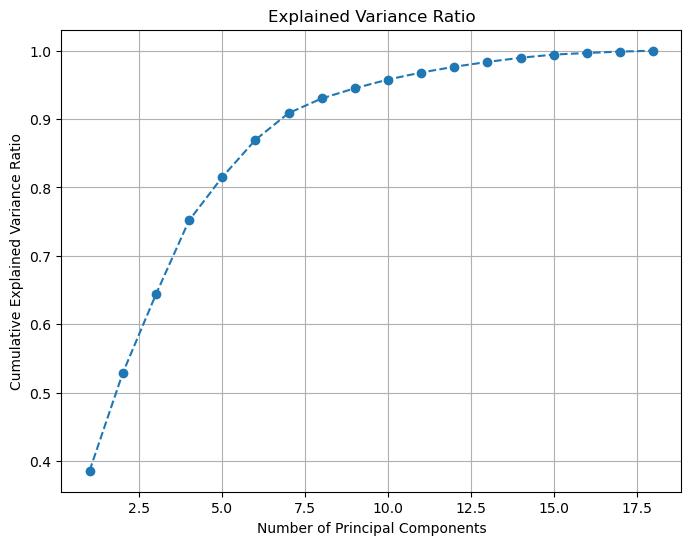

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks t

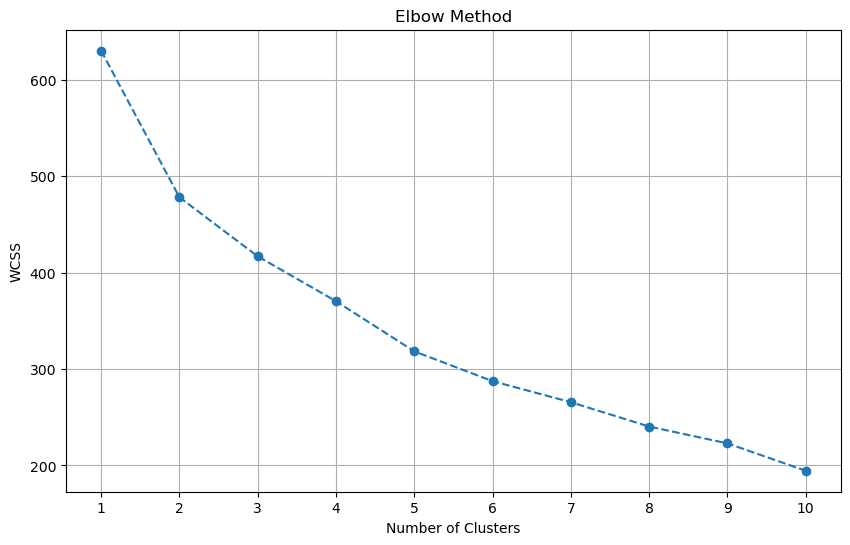

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a fu

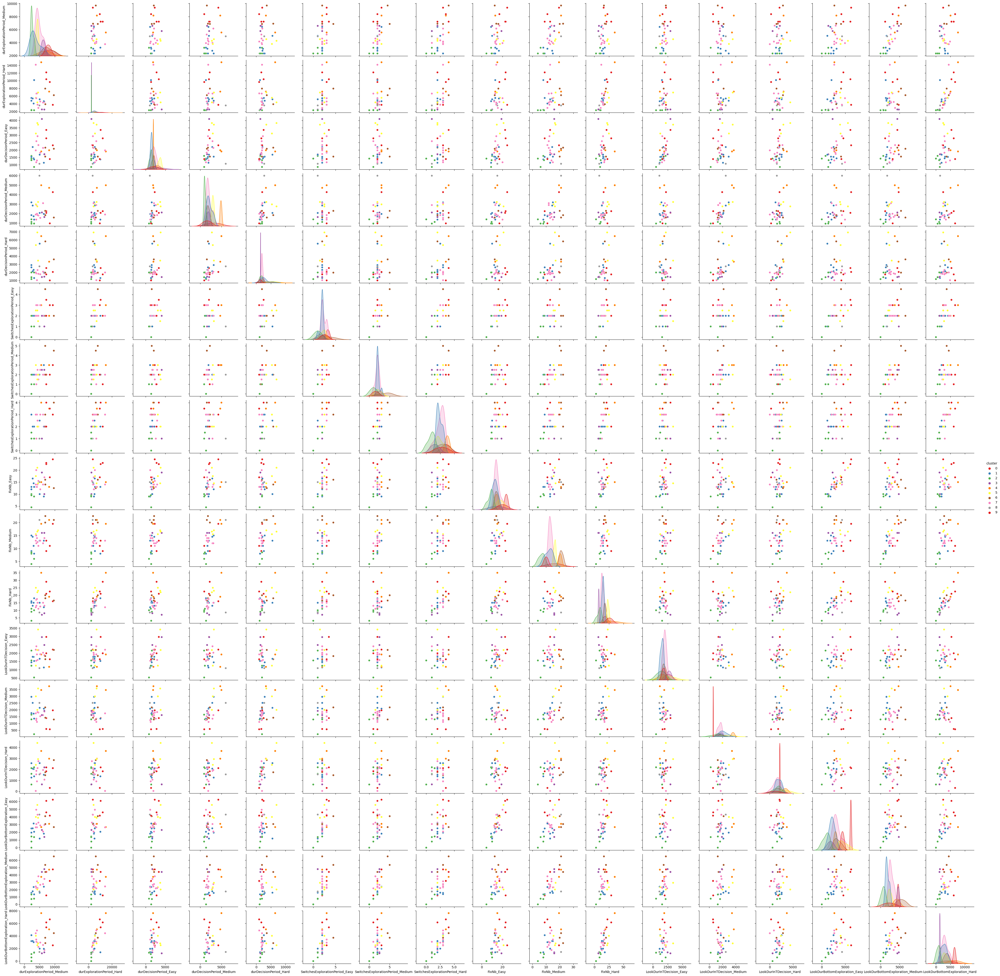

Cluster Centroids:
   durExplorationPeriod_Easy  durExplorationPeriod_Medium  \
0                1006.138422                 12305.653762   
1                7430.755193                  3837.863736   
2               15231.015956                  5177.106836   
3                6831.383019                  4759.990314   
4               -3459.307548                 -1296.085176   
5                 133.596411                  2086.715762   
6                -185.372401                  3767.680044   
7                5248.914845                  6763.983843   
8                5819.100723                  1256.186569   
9               -4449.892157                  9367.590067   

   durExplorationPeriod_Hard  durDecisionPeriod_Easy  \
0                4870.350488              689.633216   
1                4545.193537             1392.108778   
2                6411.306543             1743.589696   
3                7033.822047             4594.082562   
4                2323.010586 

In [27]:
# Clustering babies based on their exploratory behaviours per difficulty level
#I tried it here with different combinations of features - Nothing really provides clear clusters unfortunately. 

features_clustering = ['durExplorationPeriod_Easy', 'durExplorationPeriod_Medium', 'durExplorationPeriod_Hard',
                 'durDecisionPeriod_Easy', 'durDecisionPeriod_Medium', 'durDecisionPeriod_Hard',
                 'SwitchesExplorationPeriod_Easy', 'SwitchesExplorationPeriod_Medium', 'SwitchesExplorationPeriod_Hard', 
                 'FixNb_Easy', 'FixNb_Medium', 'FixNb_Hard', 
                 'LookDurInTDecision_Easy', 'LookDurInTDecision_Medium', 'LookDurInTDecision_Hard', 
                 'LookDurBottomExploration_Easy', 'LookDurBottomExploration_Medium', 'LookDurBottomExploration_Hard']
X_clustering = filtered_data[features_clustering]

scaler = StandardScaler()
X_clustering_scaled = scaler.fit_transform(X_clustering)

pca = PCA()
X_pca = pca.fit_transform(X_clustering_scaled)

plt.figure(figsize=(8, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--')
plt.title('Explained Variance Ratio')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.show()

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_clustering_scaled)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

num_clusters = 10

kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X_pca)

filtered_data['cluster'] = clusters

sns.pairplot(filtered_data, vars=features_clustering[1:], hue='cluster', palette='Set1')
plt.show()

cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_centers_df = pd.DataFrame(cluster_centers, columns=X_clustering.columns)
print("Cluster Centroids:")
print(cluster_centers_df)

for cluster_id, cluster_group in filtered_data.groupby('cluster'):
    print(f"Cluster {cluster_id}:")
    print(cluster_group['session'].values)

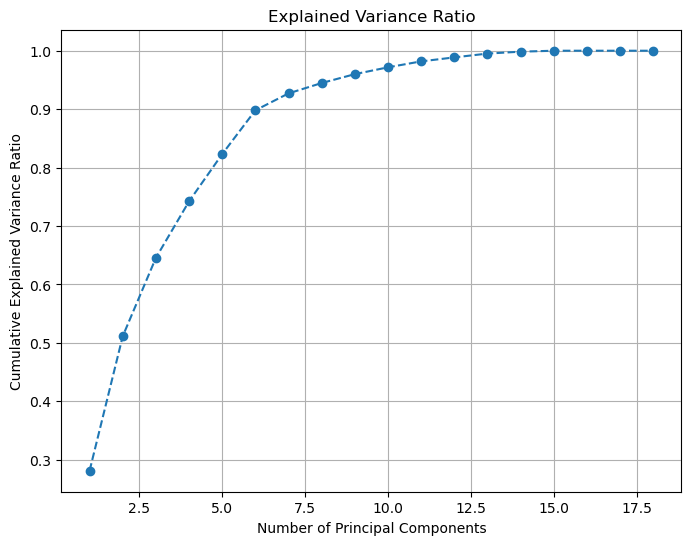

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks t

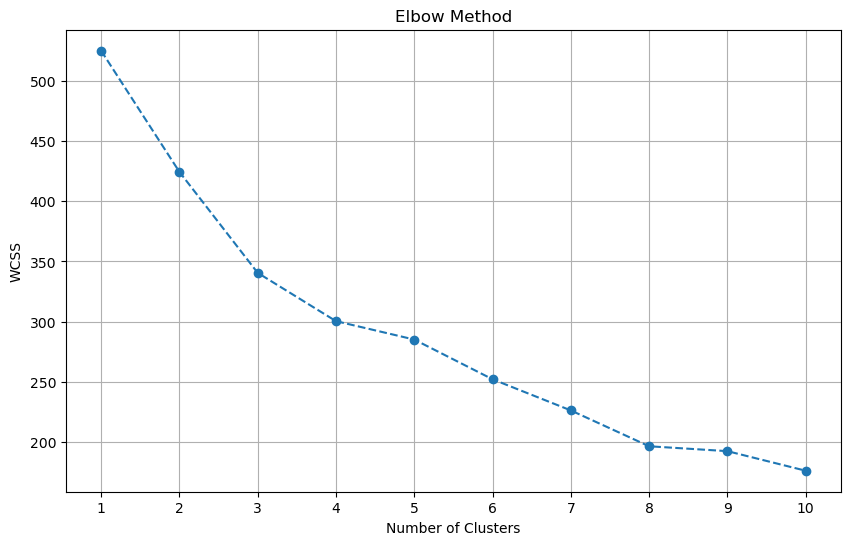

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a fu

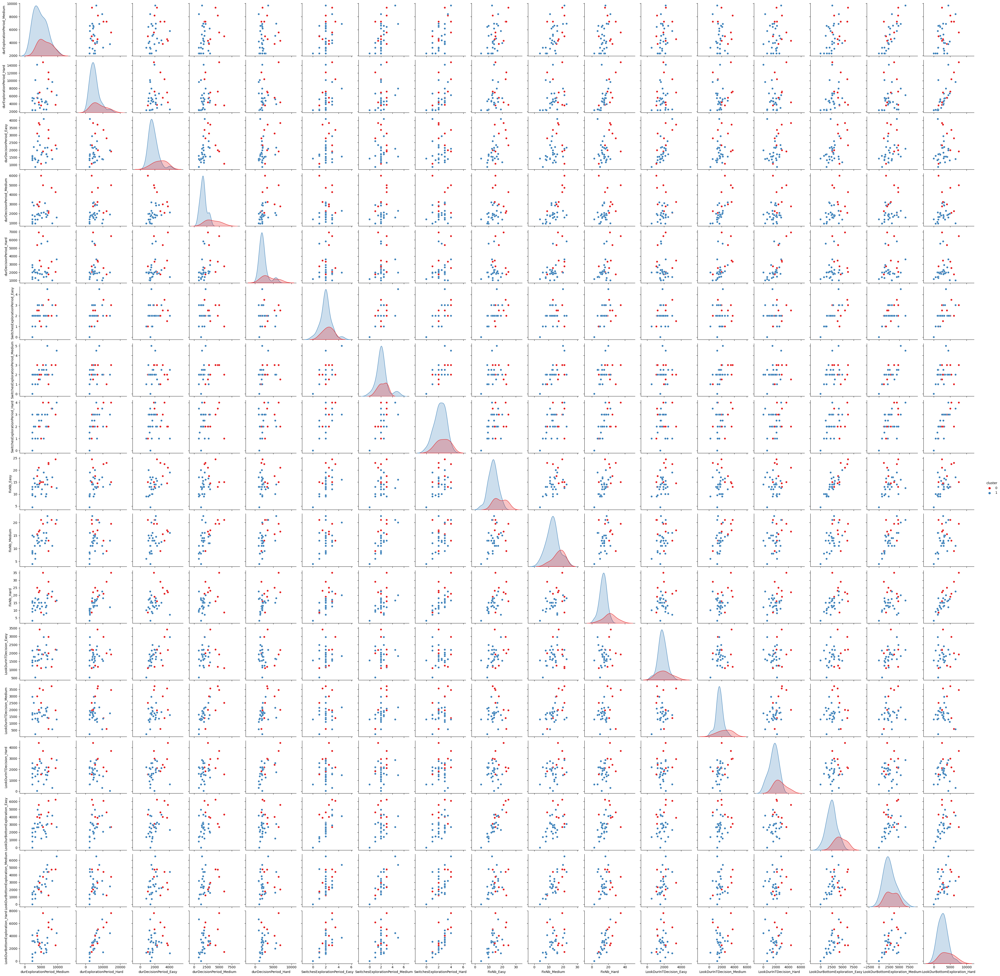

Cluster Centroids:
   diff_durExplorationPeriod_Easy  diff_durDecisionPeriod_Easy  \
0                       -2.714009                 -4144.221390   
1                        0.939465                 -2204.077211   

   diff_SwitchesExplorationPeriod_Easy  diff_FixNb_Easy  \
0                         -2340.968662        12.749030   
1                         -1921.299309        12.298413   

   diff_LookDurInTDecision_Easy  diff_LookDurBottomExploration_Easy  \
0                   2025.553411                         1284.516968   
1                   1763.846896                         1130.474896   

   diff_durExplorationPeriod_Medium  diff_durDecisionPeriod_Medium  \
0                         -0.191947                   -2656.586821   
1                          0.066443                   -2789.143024   

   diff_SwitchesExplorationPeriod_Medium  diff_FixNb_Medium  \
0                           -2296.207413          12.137903   
1                           -2322.101280          11.

In [61]:
#Clustering by calculating the difference in values within a variable depending on difficulty level (per session)
# It's a bit better than before, but still it's not a good clustering. 
#I improved here the previous analysis (previous cell) by analyzing each variable separately
features_clustering = ['durExplorationPeriod_Easy', 'durExplorationPeriod_Medium', 'durExplorationPeriod_Hard',
                 'durDecisionPeriod_Easy', 'durDecisionPeriod_Medium', 'durDecisionPeriod_Hard',
                 'SwitchesExplorationPeriod_Easy', 'SwitchesExplorationPeriod_Medium', 'SwitchesExplorationPeriod_Hard', 
                 'FixNb_Easy', 'FixNb_Medium', 'FixNb_Hard', 
                 'LookDurInTDecision_Easy', 'LookDurInTDecision_Medium', 'LookDurInTDecision_Hard', 
                 'LookDurBottomExploration_Easy', 'LookDurBottomExploration_Medium', 'LookDurBottomExploration_Hard']

X_clustering = filtered_data[features_clustering]

X_clustering_diff = pd.DataFrame()

for difficulty in ['Easy', 'Medium', 'Hard']:
    cols = [f'durExplorationPeriod_{difficulty}', f'durDecisionPeriod_{difficulty}', f'SwitchesExplorationPeriod_{difficulty}', f'FixNb_{difficulty}', f'LookDurInTDecision_{difficulty}', f'LookDurBottomExploration_{difficulty}']
    diff_cols = [f'diff_{col}' for col in cols]
    diff_df = X_clustering[cols].diff(axis=1).fillna(0) 
    diff_df.columns = diff_cols  
    X_clustering_diff = pd.concat([X_clustering_diff, diff_df], axis=1) 

scaler = StandardScaler()
X_clustering_scaled = scaler.fit_transform(X_clustering_diff)

# PCA
pca = PCA()
X_pca = pca.fit_transform(X_clustering_scaled)

plt.figure(figsize=(8, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--')
plt.title('Explained Variance Ratio')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.grid(True)
plt.show()

# Elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_clustering_scaled)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

num_clusters = 2 

# K-means clustering 
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X_pca)

filtered_data['cluster'] = clusters

sns.pairplot(filtered_data, vars=features_clustering[1:], hue='cluster', palette='Set1')
plt.show()

cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)

cluster_centers_df = pd.DataFrame(cluster_centers, columns=X_clustering_diff.columns)
print("Cluster Centroids:")
print(cluster_centers_df)

for cluster_id, cluster_group in filtered_data.groupby('cluster'):
    print(f"Cluster {cluster_id}:")
    print(cluster_group['session'].values)

In [118]:
# Mixed effects model: HIERARCHICAL - Including sessions from cluster 1 (2nd attempt)
# Method: REML
# Variables included: durExplorationPeriod, durDecisionPeriod, SwitchesExplorationPeriod, FixNb, LookDurInTDecision, LookDurBottomExploration
# NOTE: here I also excluded xHard level to match previous analysis - I thought this would make it better, but it doesn't

# Include only the selected sessions
selected_sessions = ['curE04a', 'curE011a', 'curE012a', 'curE017a', 'curE018a', 'curE027a', 'curE030a', 'curE038a', 'curE046a', 'curE049a','curE050a', 'curE054a', 'curE055a', 'curE063a', 'curE067a','curE070a', 'curE072a', 'curE075a', 'curE078a', 'curE090a', 'curE092a', 'curE104a', 'curE109a', 'curE112a', 'curE119a', 'curE122a']
filtered_data_selected = merged_filtered_data[merged_filtered_data['session'].isin(selected_sessions)].copy()
filtered_data_selected = filtered_data_selected[filtered_data_selected['difficulty'] != 'xHard']

filtered_data_selected['difficulty'] = filtered_data_selected['difficulty'].astype('category').cat.codes
filtered_data_selected['session'] = filtered_data_selected['session'].astype('category').cat.codes

scaler = StandardScaler() 
filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']] = scaler.fit_transform(filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']])

formula = 'difficulty ~ durExplorationPeriod + durDecisionPeriod + SwitchesExplorationPeriod + FixNb + LookDurInTDecision + LookDurBottomExploration + (1 | session)'

mixed_model = smf.mixedlm(formula, filtered_data_selected, groups=filtered_data_selected['session'])
result = mixed_model.fit()

print(result.summary())

# Feature importance
feature_importance = result.fe_params  
print(feature_importance)

# Leave-One-Out Cross-Validation (LOO-CV)
loo = LeaveOneOut()
predictions = []
true_values = []

#print("\nPredicted vs Observed:")

for train_index, test_index in loo.split(filtered_data_selected):
    train_data = filtered_data_selected.iloc[train_index]
    test_data = filtered_data_selected.iloc[test_index]
    
    mixed_model = smf.mixedlm(formula, train_data, groups=train_data['session'])
    result = mixed_model.fit()
    
    if len(test_data) > 0:
        test_predictions = result.predict(test_data)
    
        true_values.extend(test_data['difficulty'])
        predictions.extend(test_predictions)
        
        #print("Observed:", test_data['difficulty'].iloc[0], "| Predicted:", test_predictions.iloc[0])

# Mean Absolute Error (MAE)
mae = mean_absolute_error(true_values, predictions)
print("\nMean Absolute Error:", mae)

               Mixed Linear Model Regression Results
Model:                MixedLM     Dependent Variable:     difficulty
No. Observations:     461         Method:                 REML      
No. Groups:           25          Scale:                  0.6877    
Min. group size:      7           Log-Likelihood:         -590.2130 
Max. group size:      35          Converged:              Yes       
Mean group size:      18.4                                          
--------------------------------------------------------------------
                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------
Intercept                  0.927    0.119  7.786 0.000  0.694  1.160
durExplorationPeriod       0.091    0.079  1.154 0.249 -0.064  0.246
durDecisionPeriod          0.101    0.055  1.817 0.069 -0.008  0.209
SwitchesExplorationPeriod  0.018    0.058  0.313 0.754 -0.096  0.133
FixNb                      0.099    0.116  0.859 0

In [120]:
#Mixed effects model: HIERARCHICAL - Including sessions from cluster 0 (2nd attempt)
# Method: REML
# Variables included: durExplorationPeriod, durDecisionPeriod, SwitchesExplorationPeriod, FixNb, LookDurInTDecision, LookDurBottomExploration
# NOTE: here I also excluded xHard level to match previous analysis - I thought this would make it better, but it doesn't

# Include only the selected sessions
selected_sessions = ['curE014a', 'curE019a', 'curE039a', 'curE051a', 'curE052a', 'curE058a', 'curE062a', 'curE106a', 'curE115a']
filtered_data_selected = merged_filtered_data[merged_filtered_data['session'].isin(selected_sessions)].copy()
filtered_data_selected = filtered_data_selected[filtered_data_selected['difficulty'] != 'xHard']

filtered_data_selected['difficulty'] = filtered_data_selected['difficulty'].astype('category').cat.codes
filtered_data_selected['session'] = filtered_data_selected['session'].astype('category').cat.codes

scaler = StandardScaler() 
filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']] = scaler.fit_transform(filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']])

formula = 'difficulty ~ durExplorationPeriod + durDecisionPeriod + SwitchesExplorationPeriod + FixNb + LookDurInTDecision + LookDurBottomExploration + (1 | session)'

mixed_model = smf.mixedlm(formula, filtered_data_selected, groups=filtered_data_selected['session'])
result = mixed_model.fit()

print(result.summary())

# Feature importance
feature_importance = result.fe_params  
print(feature_importance)

# Leave-One-Out Cross-Validation (LOO-CV)
loo = LeaveOneOut()
predictions = []
true_values = []

#print("\nPredicted vs Observed:")

for train_index, test_index in loo.split(filtered_data_selected):
    train_data = filtered_data_selected.iloc[train_index]
    test_data = filtered_data_selected.iloc[test_index]
    
    mixed_model = smf.mixedlm(formula, train_data, groups=train_data['session'])
    result = mixed_model.fit()
    
    if len(test_data) > 0:
        test_predictions = result.predict(test_data)
    
        true_values.extend(test_data['difficulty'])
        predictions.extend(test_predictions)
        
        #print("Observed:", test_data['difficulty'].iloc[0], "| Predicted:", test_predictions.iloc[0])

# Mean Absolute Error (MAE)
mae = mean_absolute_error(true_values, predictions)
print("\nMean Absolute Error:", mae)

               Mixed Linear Model Regression Results
Model:                MixedLM     Dependent Variable:     difficulty
No. Observations:     145         Method:                 REML      
No. Groups:           9           Scale:                  0.7503    
Min. group size:      11          Log-Likelihood:         -195.7633 
Max. group size:      23          Converged:              Yes       
Mean group size:      16.1                                          
--------------------------------------------------------------------
                          Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------
Intercept                  0.942    0.222  4.234 0.000  0.506  1.378
durExplorationPeriod      -0.118    0.146 -0.811 0.417 -0.405  0.168
durDecisionPeriod          0.137    0.121  1.130 0.258 -0.101  0.375
SwitchesExplorationPeriod  0.115    0.101  1.131 0.258 -0.084  0.313
FixNb                      0.037    0.210  0.177 0

In [100]:
# Bayesian hierarchical regression model - Including sessions from cluster 1 (2nd attempt)
# Method of moments to estimate priors
# Variables included: durExplorationPeriod, durDecisionPeriod, SwitchesExplorationPeriod, FixNb, LookDurInTDecision, LookDurBottomExploration. 
# NOTE: here I also excluded xHard level to match previous analysis - I thought this would make it better, but it doesn't. 
#I am aware of the issue when tuning and sampling the model. I have tried to make it better (by increasing samples and retuning, as well as by using mean and std for priors, and trying different combinations of features.

selected_sessions = ['curE04a', 'curE011a', 'curE012a', 'curE017a', 'curE018a', 'curE027a', 'curE030a', 'curE038a', 'curE046a', 'curE049a','curE050a', 'curE054a', 'curE055a', 'curE063a', 'curE067a','curE070a', 'curE072a', 'curE075a', 'curE078a', 'curE090a', 'curE092a', 'curE104a', 'curE109a', 'curE112a', 'curE119a', 'curE122a']
filtered_data_selected = merged_filtered_data[merged_filtered_data['session'].isin(selected_sessions)].copy()

filtered_data_selected = filtered_data_selected[filtered_data_selected['difficulty'] != 'xHard']
filtered_data_selected['difficulty'] = filtered_data_selected['difficulty'].astype('category').cat.codes
filtered_data_selected['session'] = filtered_data_selected['session'].astype('category').cat.codes

scaler = StandardScaler()
filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']] = scaler.fit_transform(filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']])

medians = numeric_columns.median()
iqr = numeric_columns.quantile(0.75) - numeric_columns.quantile(0.25)

with pm.Model() as hierarchical_model:
    beta0 = pm.Normal('beta0', mu=medians['difficulty'], sigma=iqr['difficulty'] / 1.349)  # Scaling IQR to approximate std
    beta1 = pm.Normal('beta1', mu=medians['durExplorationPeriod'], sigma=iqr['durExplorationPeriod'] / 1.349)
    beta2 = pm.Normal('beta2', mu=medians['durDecisionPeriod'], sigma=iqr['durDecisionPeriod'] / 1.349)
    beta3 = pm.Normal('beta3', mu=medians['SwitchesExplorationPeriod'], sigma=iqr['SwitchesExplorationPeriod'] / 1.349)
    beta4 = pm.Normal('beta4', mu=medians['FixNb'], sigma=iqr['FixNb'] / 1.349)
    beta5 = pm.Normal('beta5', mu=medians['LookDurInTDecision'], sigma=iqr['LookDurInTDecision'] / 1.349)
    beta6 = pm.Normal('beta6', mu=medians['LookDurBottomExploration'], sigma=iqr['LookDurBottomExploration'] / 1.349)

    sigma_session = pm.Exponential('sigma_session', lam=1)

    mu_linear = beta0 + beta1 * filtered_data_selected['durExplorationPeriod'] + beta2 * filtered_data_selected['durDecisionPeriod'] + beta3 * filtered_data_selected['SwitchesExplorationPeriod'] + beta4 * filtered_data_selected['FixNb'] + beta5 * filtered_data_selected['LookDurInTDecision'] + beta6 * filtered_data_selected['LookDurBottomExploration']

    mu = pm.math.exp(mu_linear)

    sigma = pm.Exponential('sigma', lam=1)

    difficulty = pm.Normal('difficulty', mu=mu, sigma=sigma, observed=filtered_data_selected['difficulty'])

    session_effects = pm.Normal('session_effects', mu=0, sigma=sigma_session, shape=len(filtered_data_selected['session'].unique()))

    mu += session_effects[filtered_data_selected['session'].values]
    
    trace = pm.sample(2000, tune=1000)

print(az.summary(trace, round_to=2))

feature_names = ['difficulty', 'durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']

summary = az.summary(trace, var_names=['beta0', 'beta1', 'beta2', 'beta3', 'beta4', 'beta5', 'beta6'], round_to=2)
for i, feature in enumerate(feature_names):
    print(f"Beta for {feature}: {summary['mean'][i]} +/- {summary['sd'][i]}")

beta0_samples = trace.posterior['beta0'].values
beta1_samples = trace.posterior['beta1'].values
beta2_samples = trace.posterior['beta2'].values
beta3_samples = trace.posterior['beta3'].values
beta4_samples = trace.posterior['beta4'].values
beta5_samples = trace.posterior['beta5'].values
beta6_samples = trace.posterior['beta6'].values

feature_importance = {
    'Beta for difficulty': np.mean(beta0_samples),
    'Beta for durExplorationPeriod': np.mean(beta1_samples),
    'Beta for durDecisionPeriod': np.mean(beta2_samples),
    'Beta for SwitchesExplorationPeriod': np.mean(beta3_samples),
    'Beta for FixNb': np.mean(beta4_samples),
    'Beta for LookDurInTDecision': np.mean(beta5_samples),
    'Beta for LookDurBottomExploration': np.mean(beta6_samples)
}

print("Feature Importance:")
for feature, importance in feature_importance.items():
    print(f"{feature}: {importance}")

ppc = pm.sample_posterior_predictive(trace, var_names=['difficulty', 'sigma'], model=hierarchical_model)

predicted_difficulty = ppc['posterior_predictive']['difficulty']

#predicted_summary = {
    #'mean_difficulty': np.mean(predicted_difficulty, axis=0),
    #'median_difficulty': np.median(predicted_difficulty, axis=0),
    #'lower_95_difficulty': np.percentile(predicted_difficulty, 2.5, axis=0),
    #'upper_95_difficulty': np.percentile(predicted_difficulty, 97.5, axis=0)
#}


#for stat, value in predicted_summary.items():
 #   print(f"{stat}: {value}")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta0, beta1, beta2, beta3, beta4, beta5, beta6, sigma_session, sigma, session_effects]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 77 seconds.
There were 100 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


                     mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  \
beta0               -0.06  0.04   -0.14     0.02       0.00     0.00   
beta1                0.07  0.06   -0.05     0.19       0.00     0.00   
beta2                0.07  0.04   -0.02     0.15       0.00     0.00   
beta3               -0.01  0.06   -0.10     0.09       0.00     0.00   
beta4                0.15  0.11   -0.06     0.34       0.01     0.00   
beta5               -0.20  0.06   -0.32    -0.08       0.00     0.00   
beta6               -0.19  0.11   -0.41     0.01       0.00     0.00   
session_effects[0]  -0.01  1.52   -2.78     2.77       0.02     0.03   
session_effects[1]  -0.00  1.52   -2.96     2.94       0.02     0.03   
session_effects[2]   0.02  1.47   -2.78     2.88       0.01     0.04   
session_effects[3]   0.03  1.46   -3.18     2.74       0.02     0.04   
session_effects[4]   0.02  1.51   -2.99     2.90       0.01     0.04   
session_effects[5]   0.01  1.49   -3.04     2.80       0.01     

C:\Users\I587504\AppData\Local\Temp\ipykernel_78196\1353785998.py:67: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Beta for {feature}: {summary['mean'][i]} +/- {summary['sd'][i]}")
Sampling: [difficulty, sigma]


<xarray.DataArray 'difficulty' (chain: 4, draw: 2000, difficulty_dim_2: 461)>
array([[[ 7.47501273e-01,  1.06822982e+00,  9.98881109e-01, ...,
          1.40595825e+00,  1.32029183e+00,  4.66998432e-01],
        [ 7.84716782e-01,  8.95741302e-01,  1.00129036e+00, ...,
          1.06195895e+00,  9.47979482e-01,  7.05649931e-01],
        [ 9.79708071e+00,  7.65689886e+00,  2.33558544e+00, ...,
         -8.02092922e+00,  2.60360382e+00,  2.65660241e+00],
        ...,
        [ 6.66915940e-01,  7.24543937e-01,  8.13875220e-01, ...,
          1.58072064e+00,  8.96159781e-01,  7.31553519e-01],
        [ 1.00719149e+00,  6.75778387e-01,  4.79873822e-01, ...,
          1.08885713e+00,  1.01362355e+00,  7.56439297e-01],
        [ 7.97285497e-01,  8.73530091e-01,  1.13846809e+00, ...,
          1.27504216e+00,  9.53201923e-01,  8.48994798e-01]],

       [[ 9.63025322e-01,  7.23014862e-01,  7.81411239e-01, ...,
          7.50298088e-01,  5.66697272e-01,  1.02870282e+00],
        [ 9.88660458e-01,  1.31724862e+00,  8.19732882e-01, ...,
          1.29000029e+00,  1.10673642e+00,  1.47133051e+00],
        [ 1.88453402e+00,  3.82624726e-01,  1.21504768e-01, ...,
          1.54084108e+00,  5.69971304e-01,  5.69797900e-01],
...
        [ 2.47101906e+00, -2.36064581e-01,  2.92243436e+00, ...,
         -3.77361776e-02, -2.05625978e+00, -4.29552295e+00],
        [-1.58560752e+00,  2.09155149e+00,  1.32544603e+00, ...,
          2.25779111e+00,  9.79459947e-01,  5.47746855e-01],
        [ 1.67056766e+00,  9.63242756e-01,  1.65162721e+00, ...,
          2.17009676e+00,  1.20671389e+00,  2.46006635e+00]],

       [[ 9.59390968e-01,  9.19409994e-01,  8.83116764e-01, ...,
          1.32490414e+00,  1.15425005e+00,  8.89556763e-01],
        [ 8.33788555e-01,  8.58931571e-01,  7.22111956e-01, ...,
          1.21009349e+00,  8.29955951e-01,  7.71672735e-01],
        [ 1.48835399e+00,  2.81529597e-01,  1.45898261e+00, ...,
          1.51969869e+00,  1.02860821e+00,  7.32793632e-01],
        ...,
        [ 5.00570236e-01,  1.01567217e+00,  1.10388727e+00, ...,
          1.89011964e+00,  1.05122461e-01, -3.72543428e-01],
        [ 3.20862930e+00, -2.76470942e+00,  2.34416087e-03, ...,
          5.49369049e-01,  1.11284278e+00,  7.50917871e-02],
        [ 1.67385470e-01,  1.85934849e+00,  9.87955277e-01, ...,
          1.00654580e+00,  7.09068478e-01,  3.29690112e-01]]])
Coordinates:
  * chain             (chain) int32 0 1 2 3
  * draw              (draw) int32 0 1 2 3 4 5 ... 1994 1995 1996 1997 1998 1999
  * difficulty_dim_2  (difficulty_dim_2) int32 0 1 2 3 4 ... 456 457 458 459 460

In [114]:
# Bayesian hierarchical regression model - Including sessions from cluster 0 (2nd attempt)
# Method of moments to estimate priors
# Variables included: durExplorationPeriod, durDecisionPeriod, SwitchesExplorationPeriod, FixNb, LookDurInTDecision, LookDurBottomExploration. 
# NOTE: here I also excluded xHard level to match previous analysis - I thought this would make it better, but it doesn't. 
#I am aware of the issue when tuning and sampling the model. I have tried to make it better (by increasing samples and retuning, as well as by using mean and std for priors, and trying different combinations of features.

selected_sessions = ['curE014a', 'curE019a', 'curE039a', 'curE051a', 'curE052a', 'curE058a', 'curE062a', 'curE106a', 'curE115a']
filtered_data_selected = merged_filtered_data[merged_filtered_data['session'].isin(selected_sessions)].copy()

filtered_data_selected = filtered_data_selected[filtered_data_selected['difficulty'] != 'xHard']
filtered_data_selected['difficulty'] = filtered_data_selected['difficulty'].astype('category').cat.codes
filtered_data_selected['session'] = filtered_data_selected['session'].astype('category').cat.codes

scaler = StandardScaler()
filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']] = scaler.fit_transform(filtered_data_selected[['durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']])

numeric_columns = filtered_data_selected.select_dtypes(include=['number']).columns
medians = filtered_data_selected[numeric_columns].median()
iqr = filtered_data_selected[numeric_columns].quantile(0.75) - filtered_data_selected[numeric_columns].quantile(0.25)

with pm.Model() as hierarchical_model:
    beta0 = pm.Normal('beta0', mu=medians['difficulty'], sigma=iqr['difficulty'] / 1.349)  # Scaling IQR to approximate std
    beta1 = pm.Normal('beta1', mu=medians['durExplorationPeriod'], sigma=iqr['durExplorationPeriod'] / 1.349)
    beta2 = pm.Normal('beta2', mu=medians['durDecisionPeriod'], sigma=iqr['durDecisionPeriod'] / 1.349)
    beta3 = pm.Normal('beta3', mu=medians['SwitchesExplorationPeriod'], sigma=iqr['SwitchesExplorationPeriod'] / 1.349)
    beta4 = pm.Normal('beta4', mu=medians['FixNb'], sigma=iqr['FixNb'] / 1.349)
    beta5 = pm.Normal('beta5', mu=medians['LookDurInTDecision'], sigma=iqr['LookDurInTDecision'] / 1.349)
    beta6 = pm.Normal('beta6', mu=medians['LookDurBottomExploration'], sigma=iqr['LookDurBottomExploration'] / 1.349)

    sigma_session = pm.Exponential('sigma_session', lam=1)

    mu_linear = beta0 + beta1 * filtered_data_selected['durExplorationPeriod'] + beta2 * filtered_data_selected['durDecisionPeriod'] + beta3 * filtered_data_selected['SwitchesExplorationPeriod'] + beta4 * filtered_data_selected['FixNb'] + beta5 * filtered_data_selected['LookDurInTDecision'] + beta6 * filtered_data_selected['LookDurBottomExploration']

    mu = pm.math.exp(mu_linear)

    sigma = pm.Exponential('sigma', lam=1)

    difficulty = pm.Normal('difficulty', mu=mu, sigma=sigma, observed=filtered_data_selected['difficulty'])

    session_effects = pm.Normal('session_effects', mu=0, sigma=sigma_session, shape=len(filtered_data_selected['session'].unique()))

    mu += session_effects[filtered_data_selected['session'].values]

    trace = pm.sample(2000, tune=1000)

print(az.summary(trace, round_to=2))

feature_names = ['difficulty', 'durExplorationPeriod', 'durDecisionPeriod', 'SwitchesExplorationPeriod', 'FixNb', 'LookDurInTDecision', 'LookDurBottomExploration']

summary = az.summary(trace, var_names=['beta0', 'beta1', 'beta2', 'beta3', 'beta4', 'beta5', 'beta6'], round_to=2)
for i, feature in enumerate(feature_names):
    print(f"Beta for {feature}: {summary['mean'][i]} +/- {summary['sd'][i]}")

beta0_samples = trace.posterior['beta0'].values
beta1_samples = trace.posterior['beta1'].values
beta2_samples = trace.posterior['beta2'].values
beta3_samples = trace.posterior['beta3'].values
beta4_samples = trace.posterior['beta4'].values
beta5_samples = trace.posterior['beta5'].values
beta6_samples = trace.posterior['beta6'].values

feature_importance = {
    'Beta for difficulty': np.mean(beta0_samples),
    'Beta for durExplorationPeriod': np.mean(beta1_samples),
    'Beta for durDecisionPeriod': np.mean(beta2_samples),
    'Beta for SwitchesExplorationPeriod': np.mean(beta3_samples),
    'Beta for FixNb': np.mean(beta4_samples),
    'Beta for LookDurInTDecision': np.mean(beta5_samples),
    'Beta for LookDurBottomExploration': np.mean(beta6_samples)
}

print("Feature Importance:")
for feature, importance in feature_importance.items():
    print(f"{feature}: {importance}")

ppc = pm.sample_posterior_predictive(trace, var_names=['difficulty', 'sigma'], model=hierarchical_model)

predicted_difficulty = ppc['posterior_predictive']['difficulty']

#predicted_summary = {
    #'mean_difficulty': np.mean(predicted_difficulty, axis=0),
    #'median_difficulty': np.median(predicted_difficulty, axis=0),
    #'lower_95_difficulty': np.percentile(predicted_difficulty, 2.5, axis=0),
    #'upper_95_difficulty': np.percentile(predicted_difficulty, 97.5, axis=0)
#}

#print("Predicted Difficulty Summary:")
#for stat, value in predicted_summary.items():
 #   print(f"{stat}: {value}")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta0, beta1, beta2, beta3, beta4, beta5, beta6, sigma_session, sigma, session_effects]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 78 seconds.
There were 106 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
C:\Users\I587504\AppData\Local\Temp\ipykernel_78196\3134344769.py:67: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Beta for {feature}: {summary['mean'][i]} +/- {summary['sd'][i]}")
Sampling: [difficulty, sigma]


                    mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta0              -0.11  0.09   -0.29     0.05       0.00     0.00   4143.55   
beta1              -0.20  0.16   -0.49     0.09       0.00     0.00   5231.39   
beta2               0.10  0.13   -0.15     0.34       0.00     0.00   3459.94   
beta3               0.14  0.10   -0.06     0.34       0.00     0.00   3105.69   
beta4               0.02  0.22   -0.41     0.43       0.00     0.00   4211.71   
beta5              -0.03  0.13   -0.28     0.22       0.00     0.00   4520.21   
beta6              -0.10  0.24   -0.57     0.33       0.00     0.00   4582.69   
session_effects[0] -0.01  1.57   -3.16     2.97       0.02     0.03   9242.60   
session_effects[1]  0.00  1.52   -3.07     2.89       0.02     0.03   8982.63   
session_effects[2] -0.01  1.58   -3.08     2.96       0.02     0.03   9087.54   
session_effects[3] -0.05  1.55   -3.05     2.98       0.02     0.03   9175.36   
session_effects[4]  0.01  1.